In [1]:
import gspread
from oauth2client.service_account import ServiceAccountCredentials
from gspread_formatting import *
from collections import Counter
import numpy as np
import time

import pandas as pd
import geopandas as gpd
import datetime as dt

import matplotlib.pyplot as plt

import matplotlib.patheffects as path_effects
from matplotlib import ticker
from matplotlib.gridspec import GridSpec
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.ticker import MaxNLocator
import matplotlib.ticker as mtick
import matplotlib
import cmocean as cmo

import itertools as it

plt.rcParams['figure.facecolor'] = 'white'
plt.rcParams['axes.facecolor'] = 'white'
plt.rcParams['savefig.facecolor'] = 'white'
plt.rc('axes', axisbelow=True)
%matplotlib inline

In [2]:
today = time.strftime("%Y-%m-%d")

month_dict = {'01':'Jan','02':'Feb','03':'Mar','04':'Apr','05':'May','06':'Jun',
              '07':'Jul','08':'Aug','09':'Sep','10':'Oct','11':'Nov','12':'Dec'}

weekday_mapping = {0:'Monday',1:'Tuesday',2:'Wednesday',3:'Thursday',4:'Friday',5:'Saturday',6:'Sunday'}

alldates = pd.date_range(start='2020-01-06', end='2021-12-31').tolist()
datelist = [str(i.date()) for i in alldates]
weekdays = [weekday_mapping[i.date().weekday()] for i in alldates]
weeklist = [i//7 for i in range(len(alldates))]
DATE_DF = pd.DataFrame({'date':datelist,'day':weekdays,'week':weeklist})
DATERANGE = DATE_DF['date'].tolist()

date_dict = {DATERANGE[i]:i for i in range(len(DATERANGE))}

In [3]:
# use creds to create a client to interact with the Google Drive API
scope = ['https://spreadsheets.google.com/feeds',
         'https://www.googleapis.com/auth/drive']

creds = ServiceAccountCredentials.from_json_keyfile_name('../client_secret.json', scope)
client = gspread.authorize(creds)

mass_data = client.open("COVID-data_Massachusetts")
contact_data = mass_data.worksheet('contact_tracing')
city_data = mass_data.worksheet('new_town_data')
school_data = mass_data.worksheet('k12_schools')

contact_df = pd.DataFrame(contact_data.get_all_records(default_blank=np.nan))
city_df = pd.DataFrame(city_data.get_all_records(default_blank=np.nan))
school_df = pd.DataFrame(school_data.get_all_records(default_blank=np.nan))
school_df = school_df[['date','school_id','name','new_cases_students','new_cases_employee','details',
                       'num_students_est','num_employee_est']].copy()

In [4]:
# fn = '/Users/brennan/Downloads/BYU_Idaho_Active_New_Cases_Data.csv'
# df = pd.read_csv(fn)
# df['Date']  = pd.to_datetime(df['Date']).astype(str)

# rec_days = 6
# df2 = pd.DataFrame({'date':df['Date']})
# df2['estimated_new'] = np.nan
# df2.loc[df2['date'].isin(sorted(df2['date'].values[:rec_days])),'estimated_new'] = df.loc[df['Date']==df['Date'].values[rec_days-1],'Daily Active Cases'].values[0]/rec_days

# for curr_date in range(rec_days,df2.shape[0]):
#     tmp = df2['estimated_new'].values
#     val = df['Daily Active Cases'].values[curr_date]-df2['estimated_new'].values[curr_date-rec_days-1:curr_date-1].sum()
#     if val < 0:
#         val = 0
#     tmp[curr_date] = val
#     df2['estimated_new'] = tmp
# #     print(val)


# df2['estimated_new'].rolling(window=21).mean().plot()
# df['Daily New Reported Cases'].rolling(window=21).mean().plot()

____________

In [5]:
# city_df.loc[city_df['city']=='BOSTON'].to_csv('../data/BOSTON.tsv',sep='\t',index=False)

In [6]:
dat_shp = gpd.read_file('../../covid19-mobility/data/towns/').rename(columns={'TOWN':'city'})
city_df['city'] = city_df['city'].str.upper()

city_df['new_cases_per1000_town'] = city_df['new_cases_town'] / city_df['population'] * 1000

eligible_df = city_df.loc[(city_df['date']==city_df['date'].max())&\
                          (city_df['total_cases']>np.quantile(city_df['total_cases'],0.9))].copy()
rank_last4weeks = city_df.loc[(city_df['date'].isin(city_df['date'].unique()[-4:]))&\
                              (city_df['city'].isin(eligible_df['city'].values))].groupby('city').agg(
        {'new_cases_town':'mean'}).reset_index().sort_values('new_cases_town',ascending=False)

In [7]:
dates_tt = ['2020-07-01','2020-07-15','2020-08-01','2020-08-15','2020-09-01','2020-09-15','2020-10-01',
            '2020-10-15','2020-11-01','2020-11-15','2020-12-01','2020-12-15','2021-01-01','2021-01-15',
            '2021-02-01','2021-02-15','2021-03-01','2021-03-15','2021-04-01','2021-04-15','2021-05-01',
            '2021-05-15','2021-06-01','2021-06-15','2021-07-01','2021-07-15','2021-08-01']
dates_ll = ['Jul','','','','Sep','','','','Nov','','','','2021','','','','Mar','','','','May','','','','Jul','','']

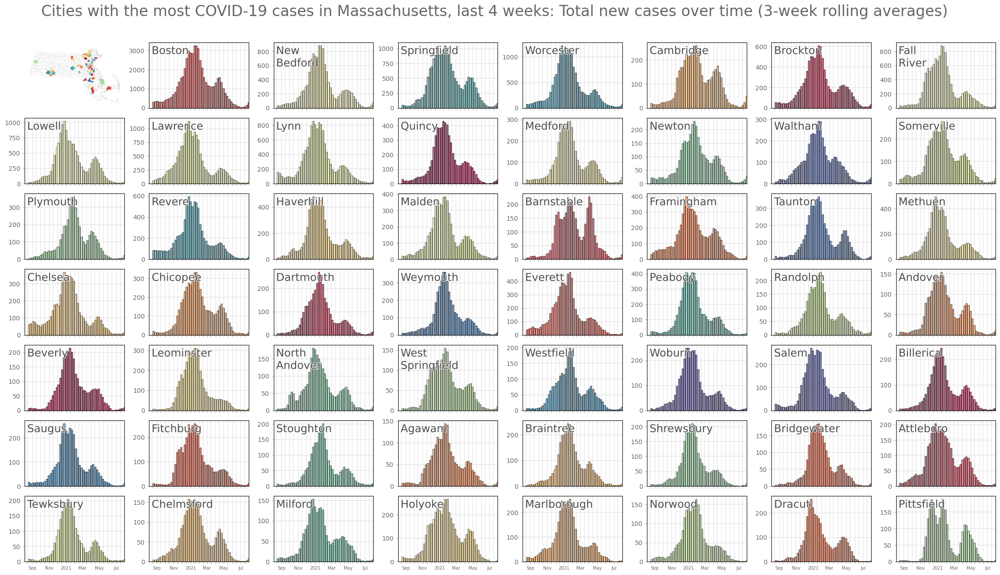

In [8]:
cmaa = plt.cm.Spectral

w = 3.5; h = 2.2
ncols = 8; nrows = 7
tups = list(it.product(range(nrows), range(ncols)))
fig, ax = plt.subplots(nrows, ncols, figsize=(ncols*w,nrows*h), dpi=100)#, sharex=True)
plt.subplots_adjust(wspace=0.25,hspace=0.15)

dat_shp.plot(ax=ax[tups[0]], ec='.8', fc='none', lw=0.2)
dat_shp_i = dat_shp.loc[dat_shp['city'].isin(rank_last4weeks['city'].values[:(nrows*ncols)-1])].copy()
dat_shp_i = dat_shp_i.reset_index().iloc[:,1:]
dat_shp_i['col'] = list(range(dat_shp_i.shape[0]))
dat_shp_i.plot(ax=ax[tups[0]], ec='.8', lw=0.2, column='col', cmap=cmaa)
ax[tups[0]].set_axis_off()

cols = cmaa(dat_shp_i['col'].values/dat_shp_i['col'].max())
cols = dict(zip(dat_shp_i['city'].values,cols))

for ci, city_i in enumerate(rank_last4weeks['city'].values[:(nrows*ncols)-1]):
    aa = ax[tups[ci+1]]
    cti = city_df.loc[city_df['city']==city_i].copy()
    xvals_i = [date_dict[i] for i in cti['date']]
    yvals_i = cti['new_cases_per1000_town'].values
    yvals_i = cti['new_cases_town'].rolling(window=3).mean().values
    aa.bar(xvals_i, yvals_i, fc='w', ec='.2', width=5)
    aa.bar(xvals_i, yvals_i, fc=cols[city_i], ec='none',alpha=0.5, width=5)

    title_i = " ".join([i.capitalize() for i in city_i.split(' ')]).replace(' ','\n')

    aa.text(0.025,0.95,title_i,ha='left',va='top',transform=aa.transAxes,fontsize='xx-large',color='.3',
            path_effects=[path_effects.Stroke(linewidth=1.5, foreground='w'), path_effects.Normal()])
    aa.grid(linewidth=1.5,color='.75',alpha=0.25)
    aa.tick_params(labelcolor='.4',color='.7',labelsize='medium')

    aa.set_xticks([date_dict[i] for i in dates_tt])
    if tups[ci+1][0] == nrows-1:
        aa.set_xticklabels(dates_ll, fontsize='x-small')
    else:
        aa.set_xticklabels(['' for i in dates_ll])
        
    aa.set_xlim(date_dict[city_df['date'].min()]-1,date_dict[city_df['date'].max()]+1)

plt.suptitle('Cities with the most COVID-19 cases in Massachusetts, last 4 weeks: '+\
             'Total new cases over time (3-week rolling averages)', y=0.935, fontsize=24,
             color='.4')

plt.savefig('../figs/pngs/ma_cities_last4weeks_ranking.png',dpi=425,bbox_inches='tight')

plt.show()

In [9]:
labs = dict(zip(contact_df['setting'].unique(),['24/7 Congr. Care', 'Child Care',
       'Higher Education', 'Corrections', 'Hospitals', 'Household',
       'Industr. Settings', 'K-12 Schools', 'Long Term Care',
       'Offices', 'Athletics/Camps', 'Other',
       'Other Food Estab.', 'Other Healthcare',
       'Other Workplace', 'Places of Worship', 'Rec./Cultural',
       'Restaurants', 'Retail/Services', 'Senior Living',
       'Shelters', 'Soc. Gatherings', 'Travel/Lodging']))

dates_tt = ['2020-11-01','2020-11-15','2020-12-01','2020-12-15','2021-01-01','2021-01-15','2021-02-01','2021-02-15',
            '2021-03-01','2021-03-15','2021-04-01','2021-04-15','2021-05-01','2021-05-15','2021-06-01','2021-06-15','2021-07-01','2021-07-15','2021-08-01']
dates_ll = ['Nov','','Dec','','2021','','Feb','','Mar','','Apr','','May','','Jun','','Jul','','Aug']

In [10]:
heatm = []
city_order = city_df.loc[city_df['date']==city_df['date'].max()].sort_values('total_cases').city.values[::-1]
for ci, city_i in enumerate(city_order):
    cti = city_df.loc[city_df['city']==city_i].copy()
    yvals_i = cti['new_cases_per1000_town'].rolling(window=3).mean().values
    if sum(cti['new_cases_town'])>10:
        heatm.append(yvals_i)
    else:
        heatm.append(np.zeros(cti.shape[0]))

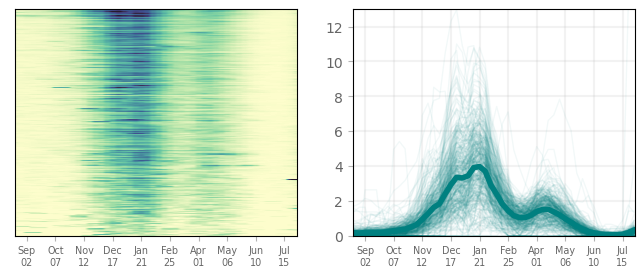

In [11]:
fig, ax = plt.subplots(1,2,figsize=(8,3),dpi=100)

ax[0].imshow(np.array(heatm),aspect='auto',vmin=0, vmax=10, cmap=cmo.cm.deep)
ax[1].plot(np.array(heatm).T, color='teal', alpha=0.05, lw=1)
ax[1].plot(np.mean(heatm,axis=0), color='teal', lw=4)
# ax.set_yticks(list(range(len(city_order)))[::10])
# ax.set_yticklabels(city_order[::10], fontsize='xx-small')
ax[0].set_yticks([])

ax[0].set_ylim(330,0)
ax[1].set_ylim(0,13)
ax[0].set_xlim(1.9,len(np.mean(heatm,axis=0))-0.85)
ax[1].set_xlim(1.9,len(np.mean(heatm,axis=0))-0.85)
ax[1].grid(linewidth=1.5,color='.75',alpha=0.2)
for a in fig.axes:
    a.tick_params(labelcolor='.4',color='.7',labelsize='medium')
    a.set_xticks([i for i in list(range(cti['date'].nunique()))[4::5]])
    a.set_xticklabels([month_dict[i[5:7]]+"\n%s"%i[8:] for i in cti['date'].unique()[4::5]],fontsize='x-small')

plt.savefig('../figs/pngs/ma_heatmap_city_cases.png',dpi=425,bbox_inches='tight')

plt.show()

In [12]:
city_df['city'] = city_df['city'].str.capitalize()

In [13]:
wid = 4
nw = 4
barw = 4.5

settings_order = contact_df.loc[contact_df['end_date'].isin(
                            sorted(contact_df['end_date'].unique())[-nw:])].copy()
settings_order = settings_order.groupby('setting').agg({'raw_new_cases':'sum'}).reset_index()
settings_order = settings_order.sort_values('raw_new_cases',ascending=False)['setting'].unique()

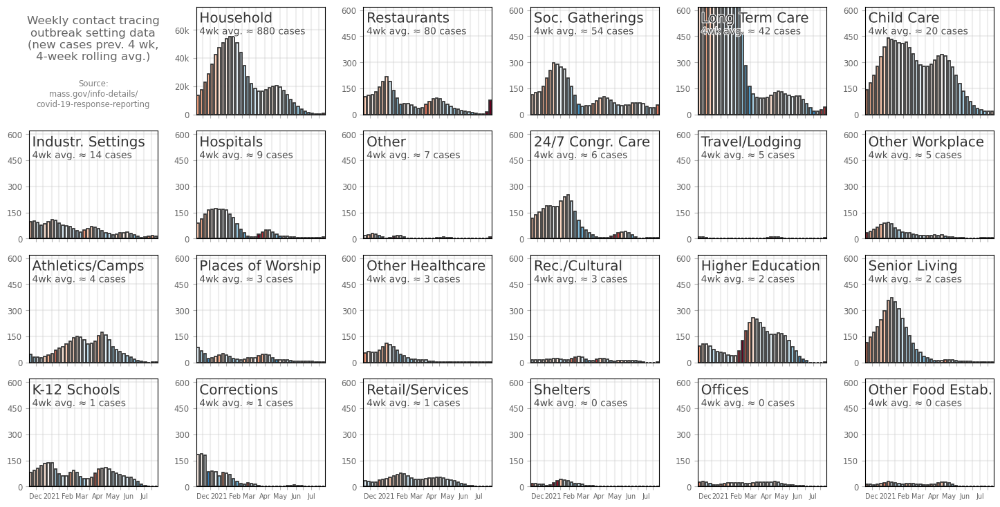

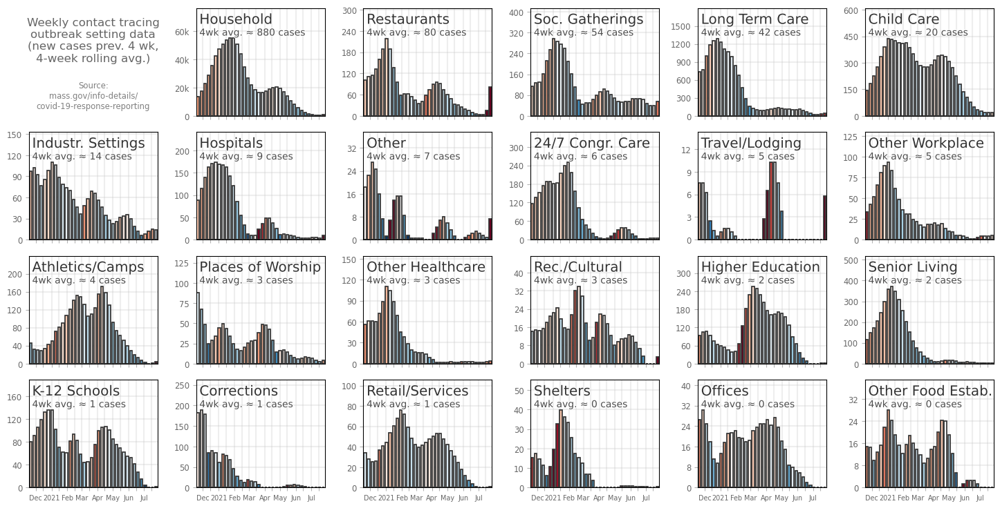

In [14]:
colum = 'raw_new_cases'
colab = 'new cases prev. 4 wk'
colim = 0.75

for samescale in ['samescale','diffscale']:

    w = 3.0; h = 2.3
    ncols = 6; nrows = 4
    tups = list(it.product(range(nrows), range(ncols)))
    fig, ax = plt.subplots(nrows, ncols, figsize=(ncols*w,nrows*h), dpi=100, sharex=True)#, sharey=True)
    plt.subplots_adjust(wspace=0.3,hspace=0.15)

    for di, dcurr in enumerate(settings_order):

        di += 1
        aa = ax[tups[di]]
        cti = contact_df.loc[contact_df['setting']==dcurr].copy()
        cti[colum] = np.nan_to_num(cti[colum])
        norm = matplotlib.colors.Normalize(vmin=-colim, vmax=colim)
        cvals = norm(np.nan_to_num((cti[colum]+1).rolling(window=wid).mean().pct_change().values))
        col = plt.cm.RdBu_r(cvals)

        aa.bar([date_dict[i] for i in cti['end_date']], cti[colum].rolling(window=wid).mean(),
               color=col, ec='.2', width=barw, lw=1.25)

        aa.text(0.025,0.95,labs[dcurr],ha='left',va='top',
                transform=aa.transAxes,fontsize='x-large',color='.2',
                path_effects=[path_effects.Stroke(linewidth=1.5, foreground='w'),
                              path_effects.Normal()])
        four_wmean = np.nanmean(np.nan_to_num(cti[colum].values)[-nw:])
        aa.text(0.025,0.815,'%iwk avg. ≈ %i %s'%(nw,four_wmean,colum.replace('raw_new_','')),
                ha='left', va='top',transform=aa.transAxes, fontsize='medium',color='.3',
                path_effects=[path_effects.Stroke(linewidth=1.5, foreground='w'),
                              path_effects.Normal()])

        aa.grid(linewidth=1.5,color='.75',alpha=0.25)
        aa.tick_params(labelcolor='.4',color='.7',labelsize='small')

        aa.set_xticks([date_dict[i] for i in dates_tt])
        aa.set_xticklabels(dates_ll, fontsize='x-small')
        aa.set_xlim(date_dict[contact_df['end_date'].min()]-barw/2-1+wid*7,
                    date_dict[contact_df['end_date'].max()]+barw/2+1)

        aa.yaxis.set_major_locator(MaxNLocator(integer=True, nbins='auto'))
        ylims = aa.get_ylim()
        ydiff = ylims[1] - ylims[0]
        aa.set_ylim(ylims[0], ylims[1]+ydiff*0.325)

        if di == 1:
            aa.set_ylim(0, 76500)
            aa.set_yticks([0, 20000, 40000, 60000])
            aa.set_yticklabels(['0', '20k', '40k', '60k'])
        else:
            if samescale=='samescale':
                aa.set_ylim(0, 620)


    aa = ax[tups[0]]
    aa.text(0.5, 0.70, 'Weekly contact tracing\noutbreak setting data\n(%s,\n%i-week rolling avg.)'%(colab, wid),
            ha='center', va='center', transform=aa.transAxes, color='.4', fontsize='large')
    aa.text(0.5, 0.05, 'Source:\nmass.gov/info-details/\ncovid-19-response-reporting',
            ha='center', va='bottom', transform=aa.transAxes, color='.5', fontsize='small')

    aa.set_axis_off()

    plt.savefig('../figs/pngs/ma_outbreak_settings_%s_%s.png'%(colum,samescale),dpi=425,bbox_inches='tight')

    plt.show()

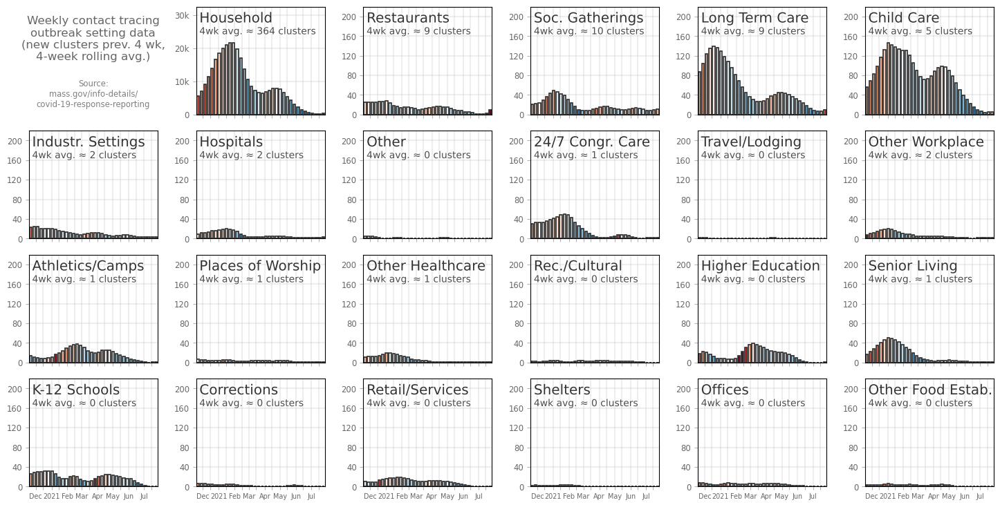

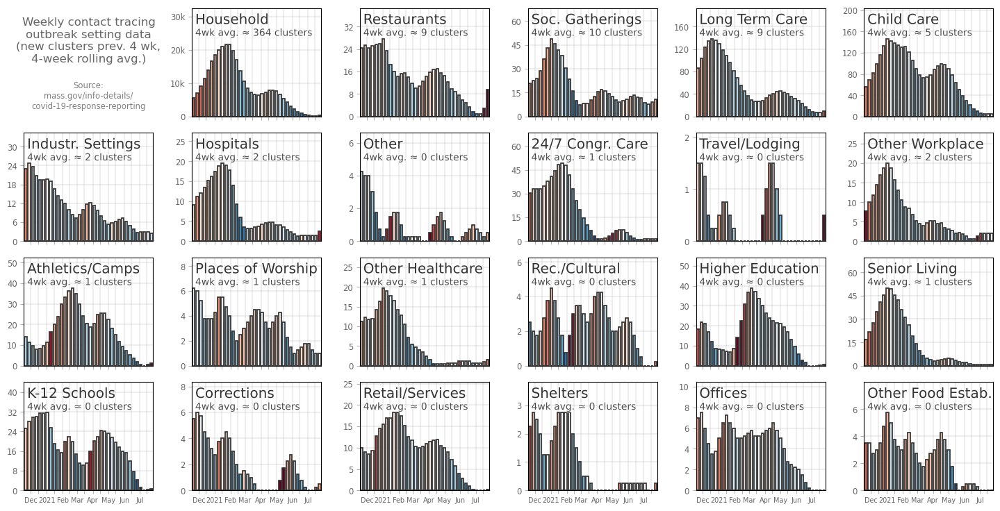

In [15]:
colum = 'raw_new_clusters'
colab = 'new clusters prev. 4 wk'
colim = 0.5

for samescale in ['samescale','diffscale']:

    w = 3.0; h = 2.3
    ncols = 6; nrows = 4
    tups = list(it.product(range(nrows), range(ncols)))
    fig, ax = plt.subplots(nrows, ncols, figsize=(ncols*w,nrows*h), dpi=100, sharex=True)#, sharey=True)
    plt.subplots_adjust(wspace=0.3,hspace=0.15)

    for di, dcurr in enumerate(settings_order):

        di += 1
        aa = ax[tups[di]]
        cti = contact_df.loc[contact_df['setting']==dcurr].copy()
        cti[colum] = np.nan_to_num(cti[colum])
        norm = matplotlib.colors.Normalize(vmin=-colim, vmax=colim)
        cvals = norm(np.nan_to_num((cti[colum]+1).rolling(window=wid).mean().pct_change().values))
        col = plt.cm.RdBu_r(cvals)

        aa.bar([date_dict[i] for i in cti['end_date']], cti[colum].rolling(window=wid).mean(),
               color=col, ec='.2', width=barw, lw=1.25)

        aa.text(0.025,0.95,labs[dcurr],ha='left',va='top',
                transform=aa.transAxes,fontsize='x-large',color='.2',
                path_effects=[path_effects.Stroke(linewidth=1.5, foreground='w'),
                              path_effects.Normal()])
        four_wmean = np.nanmean(np.nan_to_num(cti[colum].values)[-nw:])
        aa.text(0.025,0.815,'%iwk avg. ≈ %i %s'%(nw,four_wmean,colum.replace('raw_new_','')),
                ha='left', va='top',transform=aa.transAxes, fontsize='medium',color='.3',
                path_effects=[path_effects.Stroke(linewidth=1.5, foreground='w'),
                              path_effects.Normal()])

        aa.grid(linewidth=1.5,color='.75',alpha=0.25)
        aa.tick_params(labelcolor='.4',color='.7',labelsize='small')

        aa.set_xticks([date_dict[i] for i in dates_tt])
        aa.set_xticklabels(dates_ll, fontsize='x-small')
        aa.set_xlim(date_dict[contact_df['end_date'].min()]-barw/2-1+wid*7,
                    date_dict[contact_df['end_date'].max()]+barw/2+1)

        aa.yaxis.set_major_locator(MaxNLocator(integer=True, nbins='auto'))
        ylims = aa.get_ylim()
        ydiff = ylims[1] - ylims[0]
        aa.set_ylim(ylims[0], ylims[1]+ydiff*0.325)

        if labs[dcurr]=='Household':
            aa.set_ylim(0, 32500)
            aa.set_yticks([0, 10000, 20000, 30000])
            aa.set_yticklabels(['0', '10k', '20k', '30k'])
        else:
            if samescale=='samescale':
                aa.set_ylim(0, 220)


    aa = ax[tups[0]]
    aa.text(0.5, 0.70, 'Weekly contact tracing\noutbreak setting data\n(%s,\n%i-week rolling avg.)'%(colab, wid),
            ha='center', va='center', transform=aa.transAxes, color='.4', fontsize='large')
    aa.text(0.5, 0.05, 'Source:\nmass.gov/info-details/\ncovid-19-response-reporting',
            ha='center', va='bottom', transform=aa.transAxes, color='.5', fontsize='small')

    aa.set_axis_off()

    plt.savefig('../figs/pngs/ma_outbreak_settings_%s_%s.png'%(colum,samescale),dpi=425,bbox_inches='tight')

    plt.show()

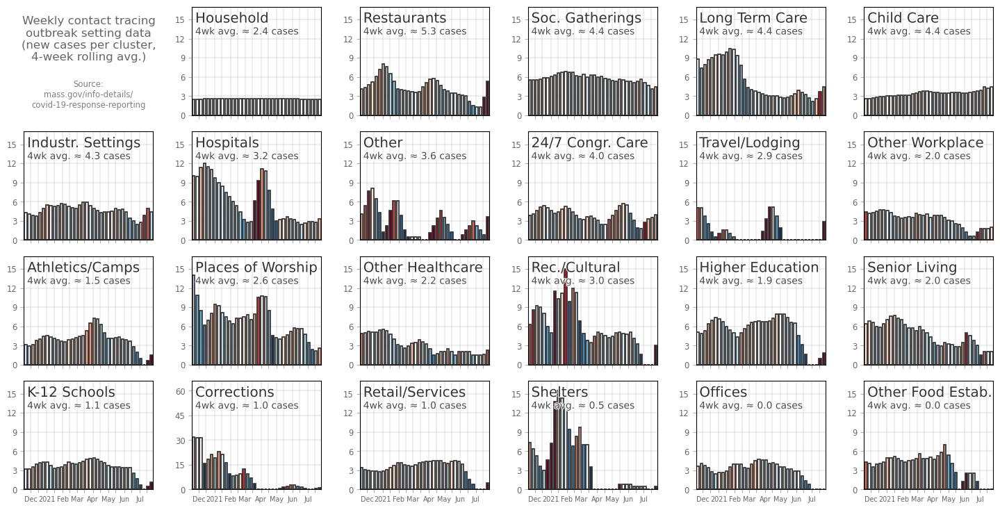

In [16]:
colum = 'raw_new_cases_per_cluster'
colab = 'new cases per cluster'
colim = 0.4
contact_df[colum] = contact_df['raw_new_cases'] / contact_df['raw_new_clusters']

for samescale in ['samescale']:#,'diffscale']:

    w = 3.0; h = 2.3
    ncols = 6; nrows = 4
    tups = list(it.product(range(nrows), range(ncols)))
    fig, ax = plt.subplots(nrows, ncols, figsize=(ncols*w,nrows*h), dpi=100, sharex=True)#, sharey=True)
    plt.subplots_adjust(wspace=0.3,hspace=0.15)

    for di, dcurr in enumerate(settings_order):

        di += 1
        aa = ax[tups[di]]
        cti = contact_df.loc[contact_df['setting']==dcurr].copy()
        
        cti[colum] = np.nan_to_num(cti[colum])
        norm = matplotlib.colors.Normalize(vmin=-colim, vmax=colim)
        cvals = norm(np.nan_to_num((cti[colum]+1).rolling(window=wid).mean().pct_change().values))
        col = plt.cm.RdBu_r(cvals)

        aa.bar([date_dict[i] for i in cti['end_date']], cti[colum].rolling(window=wid).mean(),
               color=col, ec='.2', width=barw, lw=1.25)

        aa.text(0.025,0.95,labs[dcurr],ha='left',va='top',
                transform=aa.transAxes,fontsize='x-large',color='.2',
                path_effects=[path_effects.Stroke(linewidth=1.5, foreground='w'),
                              path_effects.Normal()])
        four_wmean = np.nanmean(np.nan_to_num(cti[colum].values)[-nw:])
        aa.text(0.025,0.815,'%iwk avg. ≈ %.1f cases'%(nw,four_wmean),
                ha='left', va='top',transform=aa.transAxes, fontsize='medium',color='.3',
                path_effects=[path_effects.Stroke(linewidth=1.5, foreground='w'),
                              path_effects.Normal()])

        aa.grid(linewidth=1.5,color='.75',alpha=0.25)
        aa.tick_params(labelcolor='.4',color='.7',labelsize='small')

        aa.set_xticks([date_dict[i] for i in dates_tt])
        aa.set_xticklabels(dates_ll, fontsize='x-small')
        aa.set_xlim(date_dict[contact_df['end_date'].min()]-barw/2-1+wid*7,
                    date_dict[contact_df['end_date'].max()]+barw/2+1)

        aa.yaxis.set_major_locator(MaxNLocator(integer=True, nbins='auto'))
        ylims = aa.get_ylim()
        ydiff = ylims[1] - ylims[0]
        aa.set_ylim(ylims[0], ylims[1]+ydiff*0.35)

        if labs[dcurr]=='Corrections':
            aa.set_ylim(0, 66)
        else:
            if samescale=='samescale':
                aa.set_ylim(0, 17)


    aa = ax[tups[0]]
    aa.text(0.5, 0.70, 'Weekly contact tracing\noutbreak setting data\n(%s,\n%i-week rolling avg.)'%(colab, wid),
            ha='center', va='center', transform=aa.transAxes, color='.4', fontsize='large')
    aa.text(0.5, 0.05, 'Source:\nmass.gov/info-details/\ncovid-19-response-reporting',
            ha='center', va='bottom', transform=aa.transAxes, color='.5', fontsize='small')

    aa.set_axis_off()

    plt.savefig('../figs/pngs/ma_outbreak_settings_%s_%s.png'%(colum,samescale),dpi=425,bbox_inches='tight')

    plt.show()

In [17]:
cont_dfs = []
n_init_attempts = 10000

for di, dcurr in enumerate(settings_order):
    cti = contact_df.loc[contact_df['setting']==dcurr].copy()

    cti_tmp = cti[['start_date','raw_new_clusters','raw_new_cases','raw_total_clusters','raw_total_cases']].copy()
    pad_dates = DATERANGE[date_dict[cti['start_date'].min()]-21:][::7][:3]
    cti_tmp = pd.concat([pd.DataFrame({'start_date':pad_dates,
                                       'raw_new_clusters':[np.nan]*len(pad_dates),
                                       'raw_new_cases':[np.nan]*len(pad_dates),
                                       'raw_total_clusters':[np.nan]*len(pad_dates),
                                       'raw_total_cases':[np.nan]*len(pad_dates)}), cti_tmp])

    for colum in ['raw_new_clusters', 'raw_new_cases', 'raw_total_clusters', 'raw_total_cases']:
        out = []
        val = []
        for _ in range(n_init_attempts):
            init_val = cti_tmp[colum].values[3]
            tmp_vals = list(np.random.multinomial(int(init_val),
                            np.ones(len(pad_dates)+1)/(len(pad_dates)+1), size=1)[0])
            out.append(tmp_vals)
            for v in cti_tmp[colum].values[4:]:
                llx = v-sum(tmp_vals[-3:])
                tmp_vals.append(llx)

            val.append(sum([i if i<=0 else 0 for i in tmp_vals]))

        outx = out[np.argmin(val)]
        cti[colum.replace('raw_','')] = pd.Series(np.nan_to_num(outx)).rolling(window=4).mean().values[3:]
        cti[colum.replace('raw_','')] = [i if i > 0 else 0 for i in np.nan_to_num(cti[colum.replace('raw_','')])]

    cont_dfs.append(cti)

cont_df = pd.concat(cont_dfs).reset_index().iloc[:,1:]

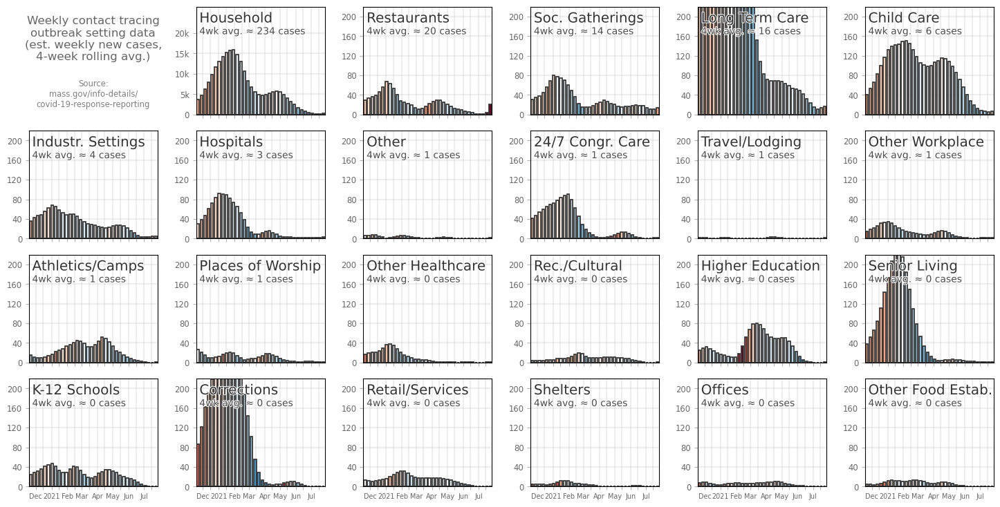

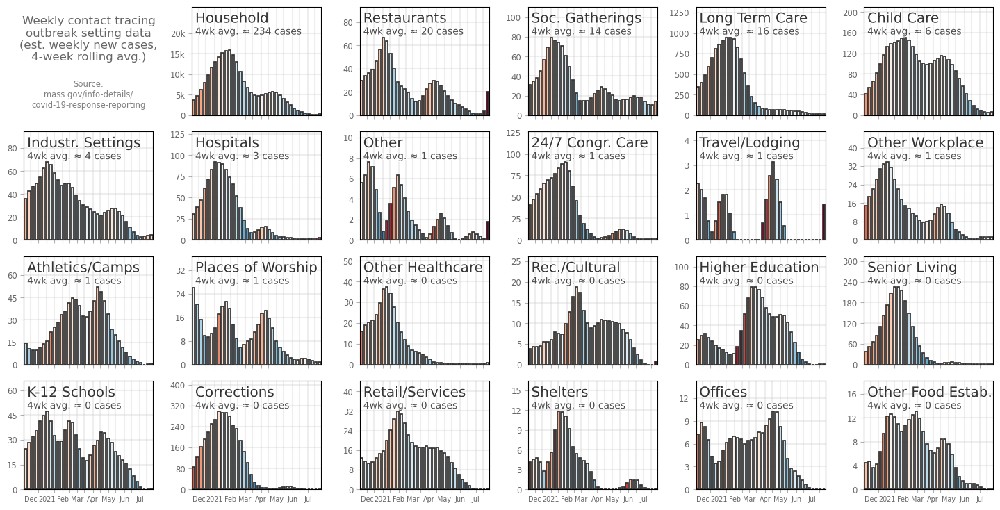

In [18]:
colum = 'total_cases'
colab = 'est. weekly new cases'
colim = 0.75

for samescale in ['samescale','diffscale']:

    w = 3.0; h = 2.3
    ncols = 6; nrows = 4
    tups = list(it.product(range(nrows), range(ncols)))
    fig, ax = plt.subplots(nrows, ncols, figsize=(ncols*w,nrows*h), dpi=100, sharex=True)#, sharey=True)
    plt.subplots_adjust(wspace=0.3,hspace=0.15)

    for di, dcurr in enumerate(settings_order):

        di += 1
        aa = ax[tups[di]]
        cti = cont_df.loc[cont_df['setting']==dcurr].copy()
        cti[colum] = np.nan_to_num(cti[colum])
        norm = matplotlib.colors.Normalize(vmin=-colim, vmax=colim)
        cvals = norm(np.nan_to_num((cti[colum]+1).rolling(window=wid).mean().pct_change().values))
        col = plt.cm.RdBu_r(cvals)

        aa.bar([date_dict[i] for i in cti['end_date']], cti[colum].rolling(window=wid).mean(),
               color=col, ec='.2', width=barw, lw=1.25)

        aa.text(0.025,0.95,labs[dcurr],ha='left',va='top',
                transform=aa.transAxes,fontsize='x-large',color='.2',
                path_effects=[path_effects.Stroke(linewidth=1.5, foreground='w'),
                              path_effects.Normal()])
        four_wmean = np.nanmean(np.nan_to_num(cti[colum].values)[-nw:])
        columL = colum.replace('raw_','')
        columL = columL.replace('new_','')
        columL = columL.replace('total_','')
        aa.text(0.025,0.815,'%iwk avg. ≈ %i %s'%(nw,four_wmean,columL),
                ha='left', va='top',transform=aa.transAxes, fontsize='medium',color='.3',
                path_effects=[path_effects.Stroke(linewidth=1.5, foreground='w'),
                              path_effects.Normal()])

        aa.grid(linewidth=1.5,color='.75',alpha=0.25)
        aa.tick_params(labelcolor='.4',color='.7',labelsize='small')

        aa.set_xticks([date_dict[i] for i in dates_tt])
        aa.set_xticklabels(dates_ll, fontsize='x-small')
        aa.set_xlim(date_dict[cont_df['end_date'].min()]-barw/2-1+wid*7,
                    date_dict[cont_df['end_date'].max()]+barw/2+1)

        aa.yaxis.set_major_locator(MaxNLocator(integer=True, nbins='auto'))
        ylims = aa.get_ylim()
        ydiff = ylims[1] - ylims[0]
        aa.set_ylim(ylims[0], ylims[1]+ydiff*0.325)

        if di == 1:
            aa.set_ylim(0, 26500)
            aa.set_yticks([0, 5000, 10000, 15000,20000])
            aa.set_yticklabels(['0', '5k', '10k', '15k', '20k'])
        else:
            if samescale=='samescale':
                aa.set_ylim(0, 220)


    aa = ax[tups[0]]
    aa.text(0.5, 0.70, 'Weekly contact tracing\noutbreak setting data\n(%s,\n%i-week rolling avg.)'%(colab, wid),
            ha='center', va='center', transform=aa.transAxes, color='.4', fontsize='large')
    aa.text(0.5, 0.05, 'Source:\nmass.gov/info-details/\ncovid-19-response-reporting',
            ha='center', va='bottom', transform=aa.transAxes, color='.5', fontsize='small')

    aa.set_axis_off()

    plt.savefig('../figs/pngs/ma_outbreak_settings_%s_%s.png'%(colum,samescale),dpi=425,bbox_inches='tight')

    plt.show()

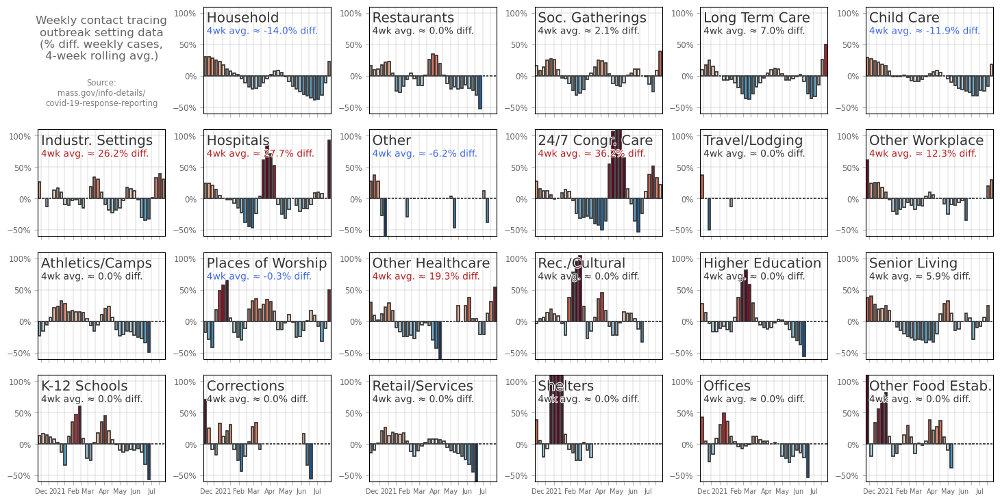

In [19]:
colum = 'new_cases'
colab = '% diff. weekly cases'
colim = 0.65

w = 3.0; h = 2.3
ncols = 6; nrows = 4
tups = list(it.product(range(nrows), range(ncols)))
fig, ax = plt.subplots(nrows, ncols, figsize=(ncols*w,nrows*h), dpi=100, sharex=True)#, sharey=True)
plt.subplots_adjust(wspace=0.3,hspace=0.15)

for di, dcurr in enumerate(settings_order):
    di += 1
    aa = ax[tups[di]]
    cti = cont_df.loc[cont_df['setting']==dcurr].copy()

    cti[colum] = pd.Series(cti[colum].rolling(window=int(wid/2)).mean()).pct_change()
    cti[colum] = cti[colum].rolling(window=wid).mean()

    norm = matplotlib.colors.Normalize(vmin=-colim, vmax=colim)
    cvals = norm(np.nan_to_num(cti[colum].values[1:]))
    col = plt.cm.RdBu_r(cvals)

    aa.bar([date_dict[i] for i in cti['end_date'].values[1:]], np.nan_to_num(cti[colum].values[1:]),
           color=col, ec='.2', width=barw, lw=1.25)
    
    aa.text(0.025,0.95,labs[dcurr],ha='left',va='top',
            transform=aa.transAxes,fontsize='x-large',color='.2',
            path_effects=[path_effects.Stroke(linewidth=1.5, foreground='w'),
                          path_effects.Normal()])

    four_wmean = np.nanmean(np.nan_to_num(cti[colum].values)[-nw:])
    col = 'firebrick'
    if four_wmean < 0.1:
        col = '.2'
    if four_wmean < 0:
        col = 'royalblue'

    aa.text(0.025,0.815,'%iwk avg. ≈ %.1f%% diff.'%(nw,four_wmean*100),
            ha='left', va='top',transform=aa.transAxes, fontsize='medium',color=col,
            path_effects=[path_effects.Stroke(linewidth=1.5, foreground='w'),
                          path_effects.Normal()])

    aa.grid(linewidth=1.5,color='.75',alpha=0.25)
    aa.tick_params(labelcolor='.4',color='.7',labelsize='small')

    aa.set_xticks([date_dict[i] for i in dates_tt])
    aa.set_xticklabels(dates_ll, fontsize='x-small')
    aa.set_xlim(date_dict[cont_df['end_date'].unique()[5]]-barw/2-1,
                date_dict[cont_df['end_date'].max()]+barw/2+1)

    aa.yaxis.set_major_formatter(mtick.PercentFormatter(1.0,decimals=0))
    ylims = aa.get_ylim()
    ydiff = ylims[1] - ylims[0]
    aa.set_ylim(ylims[0], ylims[1]+ydiff*0.35)
    aa.set_ylim(-0.6, 1.1)


aa = ax[tups[0]]
aa.text(0.5, 0.70, 'Weekly contact tracing\noutbreak setting data\n(%s,\n%i-week rolling avg.)'%(colab, wid),
        ha='center', va='center', transform=aa.transAxes, color='.4', fontsize='large')
aa.text(0.5, 0.05, 'Source:\nmass.gov/info-details/\ncovid-19-response-reporting',
        ha='center', va='bottom', transform=aa.transAxes, color='.5', fontsize='small')

aa.set_axis_off()

plt.savefig('../figs/pngs/ma_outbreak_settings_%s_%s.png'%(colum,'pct_change'),dpi=425,bbox_inches='tight')

plt.show()

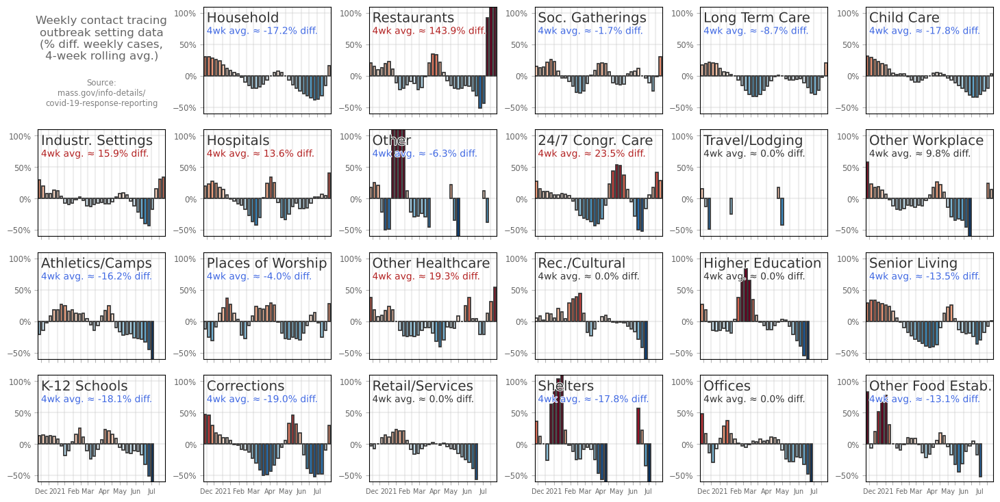

In [20]:
colum = 'total_cases'
colab = '% diff. weekly cases'
colim = 0.65

w = 3.0; h = 2.3
ncols = 6; nrows = 4
tups = list(it.product(range(nrows), range(ncols)))
fig, ax = plt.subplots(nrows, ncols, figsize=(ncols*w,nrows*h), dpi=100, sharex=True)#, sharey=True)
plt.subplots_adjust(wspace=0.3,hspace=0.15)

for di, dcurr in enumerate(settings_order):
    di += 1
    aa = ax[tups[di]]
    cti = cont_df.loc[cont_df['setting']==dcurr].copy()

#     xx = cti[colum].diff()/cti[colum].rolling(window=int(wid/2)).mean()
#     xx.loc[np.abs(xx)==np.inf] = 0
#     xx.loc[xx.isna()] = 0
#     cti[colum] = xx
#     cti[colum] = cti[colum].rolling(window=wid).mean()
    cti[colum] = pd.Series(cti[colum].rolling(window=int(wid/2)).mean()).pct_change()
    cti[colum] = cti[colum].rolling(window=wid).mean()

    norm = matplotlib.colors.Normalize(vmin=-colim, vmax=colim)
    cvals = norm(np.nan_to_num(cti[colum].values[1:]))
    col = plt.cm.RdBu_r(cvals)

    aa.bar([date_dict[i] for i in cti['end_date'].values[1:]], cti[colum].values[1:],
           color=col, ec='.2', width=barw, lw=1.25)
    
    aa.text(0.025,0.95,labs[dcurr],ha='left',va='top',
            transform=aa.transAxes,fontsize='x-large',color='.2',
            path_effects=[path_effects.Stroke(linewidth=1.5, foreground='w'),
                          path_effects.Normal()])

    four_wmean = np.nanmean(np.nan_to_num(cti[colum].values)[-nw:])
    col = 'firebrick'
    if four_wmean < 0.1:
        col = '.2'
    if four_wmean < 0:
        col = 'royalblue'

    aa.text(0.025,0.815,'%iwk avg. ≈ %.1f%% diff.'%(nw,four_wmean*100),
            ha='left', va='top',transform=aa.transAxes, fontsize='medium',color=col,
            path_effects=[path_effects.Stroke(linewidth=1.5, foreground='w'),
                          path_effects.Normal()])

    aa.grid(linewidth=1.5,color='.75',alpha=0.25)
    aa.tick_params(labelcolor='.4',color='.7',labelsize='small')

    aa.set_xticks([date_dict[i] for i in dates_tt])
    aa.set_xticklabels(dates_ll, fontsize='x-small')
    aa.set_xlim(date_dict[cont_df['end_date'].unique()[5]]-barw/2-1,
                date_dict[cont_df['end_date'].max()]+barw/2+1)

    aa.yaxis.set_major_formatter(mtick.PercentFormatter(1.0,decimals=0))
    ylims = aa.get_ylim()
    ydiff = ylims[1] - ylims[0]
    aa.set_ylim(ylims[0], ylims[1]+ydiff*0.35)
    aa.set_ylim(-0.6, 1.1)


aa = ax[tups[0]]
aa.text(0.5, 0.70, 'Weekly contact tracing\noutbreak setting data\n(%s,\n%i-week rolling avg.)'%(colab, wid),
        ha='center', va='center', transform=aa.transAxes, color='.4', fontsize='large')
aa.text(0.5, 0.05, 'Source:\nmass.gov/info-details/\ncovid-19-response-reporting',
        ha='center', va='bottom', transform=aa.transAxes, color='.5', fontsize='small')

aa.set_axis_off()

plt.savefig('../figs/pngs/ma_outbreak_settings_%s_%s.png'%(colum,'pct_change'),dpi=425,bbox_inches='tight')

plt.show()

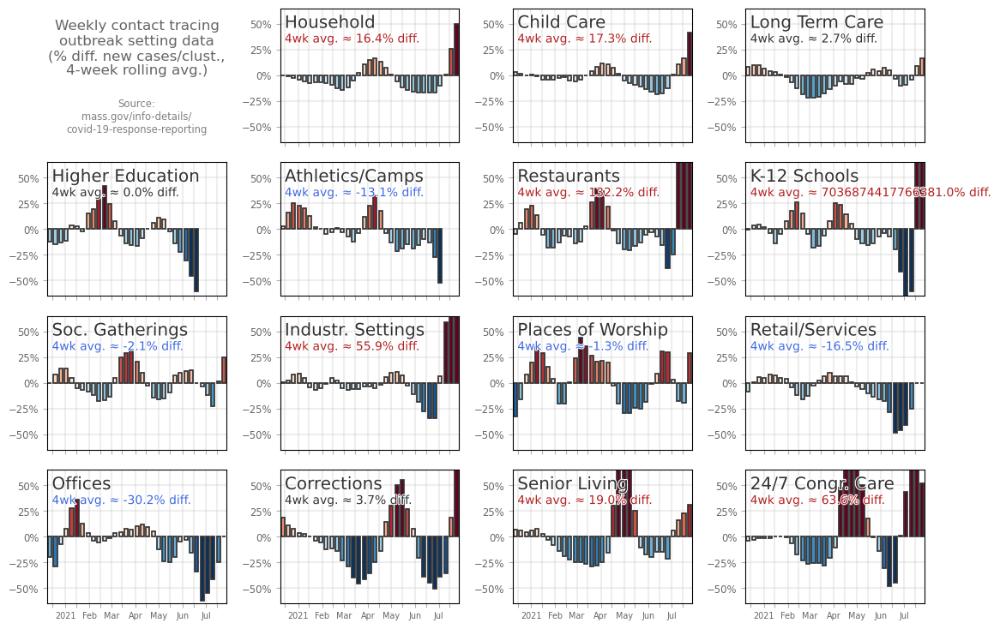

In [21]:
colum = 'new_cases_per_cluster'
colab = '% diff. new cases/clust.'
colim = 0.4
cont_df[colum] = cont_df['total_cases']/cont_df['total_clusters']
cont_df[colum] = cont_df['new_cases']/cont_df['new_clusters']
cont_df[colum] = cont_df['raw_new_cases']/cont_df['raw_new_clusters']
cont_df[colum] = cont_df['raw_total_cases']/cont_df['raw_total_clusters']

w = 3.3; h = 2.3
ncols = 4; nrows = 4
tups = list(it.product(range(nrows), range(ncols)))
fig, ax = plt.subplots(nrows, ncols, figsize=(ncols*w,nrows*h), dpi=100, sharex=True)#, sharey=True)
plt.subplots_adjust(wspace=0.3,hspace=0.15)

tmp = ['Household', 'Child Care', 'Long Term Care Facilities',
       'Colleges & Universities', 'Organized Athletics & Camps',
       'Restaurants & Food Courts', 'K-12 Schools', 'Social Gatherings',
       'Industrial Settings', 'Places of Worship', 'Retail & Services',
#        'Other Workplaces', 
#  'Recreation/Cultural', 
       'Offices',
       'Corrections', 'Senior Living',# 'Other Food Establishments',
#        'Other Healthcare', 
       '24/7 Congregate Settings']#,
#        'Shelters']

for di, dcurr in enumerate(tmp):
    di += 1
    aa = ax[tups[di]]
    cti = cont_df.loc[cont_df['setting']==dcurr].copy()
#     cti[colum] = pd.Series(cti[colum].rolling(window=int(wid/2)).mean()).pct_change()
#     cti[colum] = np.nan_to_num(cti[colum])
#     cti[colum] = (cti[colum].diff()/cti[colum].rolling(window=wid).mean()).rolling(window=int(wid/2)).mean()
#     cti[colum] = cti[colum].rolling(window=wid).mean()
    cti[colum] = pd.Series(cti[colum].rolling(window=int(wid/2)).mean()).pct_change()
    cti[colum] = cti[colum].rolling(window=wid).mean()

    norm = matplotlib.colors.Normalize(vmin=-colim, vmax=colim)
    cvals = norm(np.nan_to_num(cti[colum].values[1:]))
    col = plt.cm.RdBu_r(cvals)

    aa.bar([date_dict[i] for i in cti['end_date'].values[1:]], cti[colum].values[1:],
           color=col, ec='.2', width=barw, lw=1.25)
    
    aa.text(0.025,0.95,labs[dcurr],ha='left',va='top',
            transform=aa.transAxes,fontsize='x-large',color='.2',
            path_effects=[path_effects.Stroke(linewidth=1.5, foreground='w'),
                          path_effects.Normal()])

    four_wmean = np.nanmean(np.nan_to_num(cti[colum].values)[-nw:])
    col = 'firebrick'
    if four_wmean < 0.1:
        col = '.2'
    if four_wmean < 0:
        col = 'royalblue'

    aa.text(0.025,0.815,'%iwk avg. ≈ %.1f%% diff.'%(nw,four_wmean*100),
            ha='left', va='top',transform=aa.transAxes, fontsize='medium',color=col,
            path_effects=[path_effects.Stroke(linewidth=1.5, foreground='w'),
                          path_effects.Normal()])

    aa.grid(linewidth=1.5,color='.75',alpha=0.25)
    aa.tick_params(labelcolor='.4',color='.7',labelsize='small')

    aa.set_xticks([date_dict[i] for i in dates_tt])
    aa.set_xticklabels(dates_ll, fontsize='x-small')
    aa.set_xlim(date_dict[cont_df['end_date'].unique()[7]]-barw/2-1,
                date_dict[cont_df['end_date'].max()]+barw/2+1)

    aa.yaxis.set_major_formatter(mtick.PercentFormatter(1.0,decimals=0))
    ylims = aa.get_ylim()
    ydiff = ylims[1] - ylims[0]
    aa.set_ylim(ylims[0], ylims[1]+ydiff*0.35)
    aa.set_ylim(-0.65, 0.65)


aa = ax[tups[0]]
aa.text(0.5, 0.70, 'Weekly contact tracing\noutbreak setting data\n(%s,\n%i-week rolling avg.)'%(colab, wid),
        ha='center', va='center', transform=aa.transAxes, color='.4', fontsize='large')
aa.text(0.5, 0.05, 'Source:\nmass.gov/info-details/\ncovid-19-response-reporting',
        ha='center', va='bottom', transform=aa.transAxes, color='.5', fontsize='small')

aa.set_axis_off()

plt.savefig('../figs/pngs/ma_outbreak_settings_%s_%s.png'%(colum,'pct_change_raw'),dpi=425,bbox_inches='tight')

plt.show()

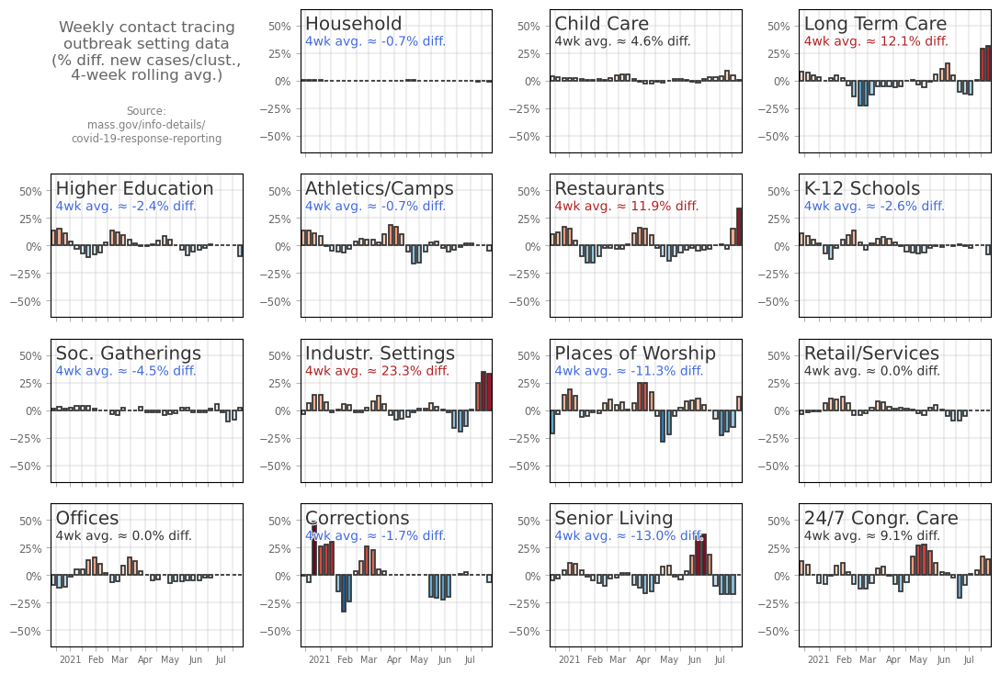

In [22]:
colum = 'new_cases_per_cluster'
colab = '% diff. new cases/clust.'
colim = 0.4
cont_df[colum] = cont_df['total_cases']/cont_df['total_clusters']
# cont_df[colum] = cont_df['new_cases']/cont_df['new_clusters']
cont_df[colum] = cont_df['raw_new_cases']/cont_df['raw_new_clusters']
# cont_df[colum] = cont_df['raw_total_cases']/cont_df['raw_total_clusters']

w = 3.3; h = 2.3
ncols = 4; nrows = 4
tups = list(it.product(range(nrows), range(ncols)))
fig, ax = plt.subplots(nrows, ncols, figsize=(ncols*w,nrows*h), dpi=100, sharex=True)#, sharey=True)
plt.subplots_adjust(wspace=0.3,hspace=0.15)

tmp = ['Household', 'Child Care', 'Long Term Care Facilities',
       'Colleges & Universities', 'Organized Athletics & Camps',
       'Restaurants & Food Courts', 'K-12 Schools', 'Social Gatherings',
       'Industrial Settings', 'Places of Worship', 'Retail & Services',
#        'Other Workplaces', 
#  'Recreation/Cultural', 
       'Offices',
       'Corrections', 'Senior Living',# 'Other Food Establishments',
#        'Other Healthcare', 
       '24/7 Congregate Settings']#,
#        'Shelters']

for di, dcurr in enumerate(tmp):
    di += 1
    aa = ax[tups[di]]
    cti = cont_df.loc[cont_df['setting']==dcurr].copy()
#     cti[colum] = pd.Series(cti[colum].rolling(window=int(wid/2)).mean()).pct_change()
#     cti[colum] = np.nan_to_num(cti[colum])
#     cti[colum] = (cti[colum].diff()/cti[colum].rolling(window=wid).mean()).rolling(window=int(wid/2)).mean()
#     cti[colum] = cti[colum].rolling(window=wid).mean()
    cti[colum] = pd.Series(cti[colum].rolling(window=int(wid/2)).mean()).pct_change()
    cti[colum] = cti[colum].rolling(window=wid).mean()

    norm = matplotlib.colors.Normalize(vmin=-colim, vmax=colim)
    cvals = norm(np.nan_to_num(cti[colum].values[1:]))
    col = plt.cm.RdBu_r(cvals)

    aa.bar([date_dict[i] for i in cti['end_date'].values[1:]], cti[colum].values[1:],
           color=col, ec='.2', width=barw, lw=1.25)
    
    aa.text(0.025,0.95,labs[dcurr],ha='left',va='top',
            transform=aa.transAxes,fontsize='x-large',color='.2',
            path_effects=[path_effects.Stroke(linewidth=1.5, foreground='w'),
                          path_effects.Normal()])

    four_wmean = np.nanmean(np.nan_to_num(cti[colum].values)[-nw:])
    col = 'firebrick'
    if four_wmean < 0.1:
        col = '.2'
    if four_wmean < 0:
        col = 'royalblue'

    aa.text(0.025,0.815,'%iwk avg. ≈ %.1f%% diff.'%(nw,four_wmean*100),
            ha='left', va='top',transform=aa.transAxes, fontsize='medium',color=col,
            path_effects=[path_effects.Stroke(linewidth=1.5, foreground='w'),
                          path_effects.Normal()])

    aa.grid(linewidth=1.5,color='.75',alpha=0.25)
    aa.tick_params(labelcolor='.4',color='.7',labelsize='small')

    aa.set_xticks([date_dict[i] for i in dates_tt])
    aa.set_xticklabels(dates_ll, fontsize='x-small')
    aa.set_xlim(date_dict[cont_df['end_date'].unique()[7]]-barw/2-1,
                date_dict[cont_df['end_date'].max()]+barw/2+1)

    aa.yaxis.set_major_formatter(mtick.PercentFormatter(1.0,decimals=0))
    ylims = aa.get_ylim()
    ydiff = ylims[1] - ylims[0]
    aa.set_ylim(ylims[0], ylims[1]+ydiff*0.35)
    aa.set_ylim(-0.65, 0.65)


aa = ax[tups[0]]
aa.text(0.5, 0.70, 'Weekly contact tracing\noutbreak setting data\n(%s,\n%i-week rolling avg.)'%(colab, wid),
        ha='center', va='center', transform=aa.transAxes, color='.4', fontsize='large')
aa.text(0.5, 0.05, 'Source:\nmass.gov/info-details/\ncovid-19-response-reporting',
        ha='center', va='bottom', transform=aa.transAxes, color='.5', fontsize='small')

aa.set_axis_off()

plt.savefig('../figs/pngs/ma_outbreak_settings_%s_%s.png'%(colum,'pct_change_tot'),dpi=425,bbox_inches='tight')

plt.show()

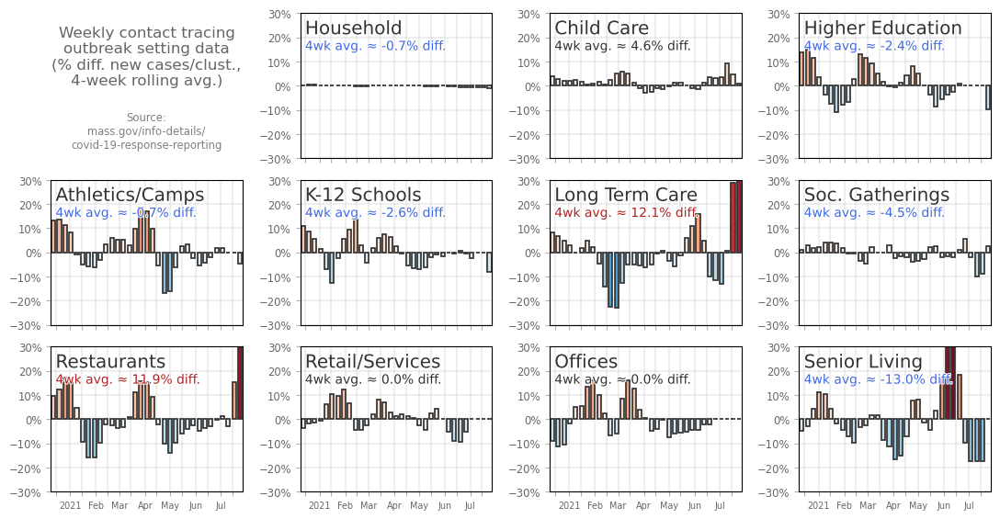

In [23]:
colum = 'new_cases_per_cluster'
colab = '% diff. new cases/clust.'
colim = 0.4
contact_df[colum] = contact_df['raw_new_cases']/contact_df['raw_new_clusters']

w = 3.3; h = 2.3
ncols = 4; nrows = 3
tups = list(it.product(range(nrows), range(ncols)))
fig, ax = plt.subplots(nrows, ncols, figsize=(ncols*w,nrows*h), dpi=100, sharex=True)#, sharey=True)
plt.subplots_adjust(wspace=0.3,hspace=0.15)

tmp = ['Household', 'Child Care', 'Colleges & Universities', 'Organized Athletics & Camps',
       'K-12 Schools', 'Long Term Care Facilities', 'Social Gatherings',
       'Restaurants & Food Courts', 'Retail & Services', 'Offices', 'Senior Living']

for di, dcurr in enumerate(tmp):
    di += 1
    aa = ax[tups[di]]
    cti = contact_df.loc[contact_df['setting']==dcurr].copy()
    cti[colum] = pd.Series(cti[colum].rolling(window=int(wid/2)).mean()).pct_change()
    cti[colum] = cti[colum].rolling(window=wid).mean()

    norm = matplotlib.colors.Normalize(vmin=-colim, vmax=colim)
    cvals = norm(np.nan_to_num(cti[colum].values[1:]))
    col = plt.cm.RdBu_r(cvals)

    aa.bar([date_dict[i] for i in cti['end_date'].values[1:]], cti[colum].values[1:],
           color=col, ec='.2', width=barw, lw=1.25)
    
    aa.text(0.025,0.95,labs[dcurr],ha='left',va='top',
            transform=aa.transAxes,fontsize='x-large',color='.2',
            path_effects=[path_effects.Stroke(linewidth=1.5, foreground='w'),
                          path_effects.Normal()])

    four_wmean = np.nanmean(np.nan_to_num(cti[colum].values)[-nw:])
    col = 'firebrick'
    if four_wmean < 0.1:
        col = '.2'
    if four_wmean < 0:
        col = 'royalblue'

    aa.text(0.025,0.815,'%iwk avg. ≈ %.1f%% diff.'%(nw,four_wmean*100),
            ha='left', va='top',transform=aa.transAxes, fontsize='medium',color=col,
            path_effects=[path_effects.Stroke(linewidth=1.5, foreground='w'),
                          path_effects.Normal()])

    aa.grid(linewidth=1.5,color='.75',alpha=0.25)
    aa.tick_params(labelcolor='.4',color='.7',labelsize='small')

    aa.set_xticks([date_dict[i] for i in dates_tt])
    aa.set_xticklabels(dates_ll, fontsize='x-small')
    aa.set_xlim(date_dict[contact_df['end_date'].unique()[7]]-barw/2-1,
                date_dict[contact_df['end_date'].max()]+barw/2+1)

    aa.yaxis.set_major_formatter(mtick.PercentFormatter(1.0,decimals=0))
    ylims = aa.get_ylim()
    ydiff = ylims[1] - ylims[0]
    aa.set_ylim(ylims[0], ylims[1]+ydiff*0.35)
    aa.set_ylim(-0.3, 0.3)


aa = ax[tups[0]]
aa.text(0.5, 0.70, 'Weekly contact tracing\noutbreak setting data\n(%s,\n%i-week rolling avg.)'%(colab, wid),
        ha='center', va='center', transform=aa.transAxes, color='.4', fontsize='large')
aa.text(0.5, 0.05, 'Source:\nmass.gov/info-details/\ncovid-19-response-reporting',
        ha='center', va='bottom', transform=aa.transAxes, color='.5', fontsize='small')

aa.set_axis_off()

plt.savefig('../figs/pngs/ma_outbreak_settings_%s_%s.png'%(colum,'pct_tmp'),dpi=425,bbox_inches='tight')

plt.show()

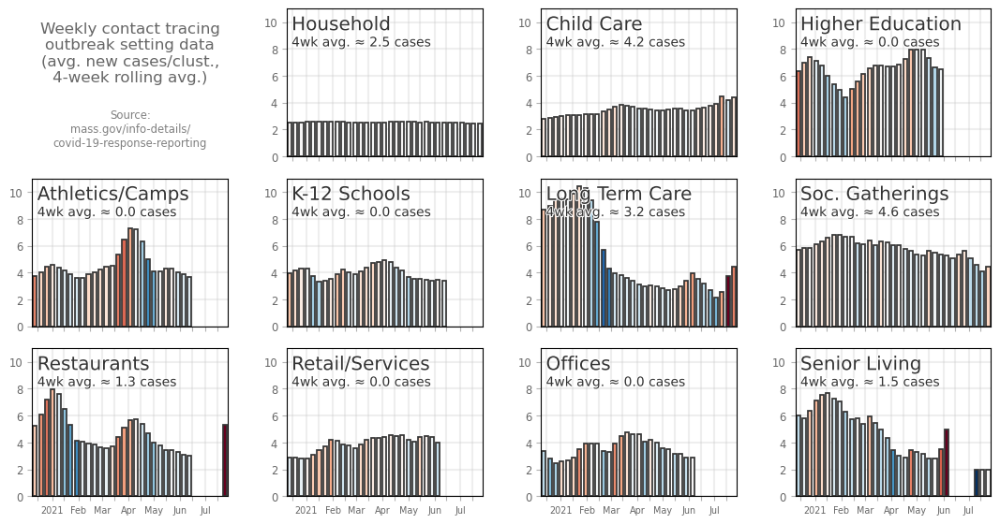

In [24]:
colum = 'new_cases_per_cluster'
colab = 'avg. new cases/clust.'
colim = 0.3
contact_df[colum] = contact_df['raw_new_cases']/contact_df['raw_new_clusters']

w = 3.3; h = 2.3
ncols = 4; nrows = 3
tups = list(it.product(range(nrows), range(ncols)))
fig, ax = plt.subplots(nrows, ncols, figsize=(ncols*w,nrows*h), dpi=100, sharex=True)#, sharey=True)
plt.subplots_adjust(wspace=0.3,hspace=0.15)

wid = 4
for di, dcurr in enumerate(tmp):
    di += 1
    aa = ax[tups[di]]
    cti = contact_df.loc[contact_df['setting']==dcurr].copy()

    norm = matplotlib.colors.Normalize(vmin=-colim, vmax=colim)
    cvals = norm(np.nan_to_num((cti[colum]+1).rolling(window=wid).mean().pct_change().values))
    col = plt.cm.RdBu_r(cvals)
    cti[colum] = cti[colum].rolling(window=wid).mean()

    aa.bar([date_dict[i] for i in cti['end_date'].values], cti[colum].values,
           color=col, ec='.2', width=barw, lw=1.25)
    
    aa.text(0.025,0.95,labs[dcurr],ha='left',va='top',
            transform=aa.transAxes,fontsize='x-large',color='.2',
            path_effects=[path_effects.Stroke(linewidth=1.5, foreground='w'),
                          path_effects.Normal()])

    four_wmean = np.nanmean(np.nan_to_num(cti[colum].values)[-nw:])
    aa.text(0.025,0.815,'%iwk avg. ≈ %.1f cases'%(nw,four_wmean),
            ha='left', va='top',transform=aa.transAxes, fontsize='medium',color='.2',
            path_effects=[path_effects.Stroke(linewidth=1.5, foreground='w'),
                          path_effects.Normal()])

    aa.grid(linewidth=1.5,color='.75',alpha=0.25)
    aa.tick_params(labelcolor='.4',color='.7',labelsize='small')

    aa.set_xticks([date_dict[i] for i in dates_tt])
    aa.set_xticklabels(dates_ll, fontsize='x-small')
    aa.set_xlim(date_dict[contact_df['end_date'].unique()[7]]-barw/2-1,
                date_dict[contact_df['end_date'].max()]+barw/2+1)

#     aa.yaxis.set_major_formatter(mtick.PercentFormatter(1.0,decimals=0))
    ylims = aa.get_ylim()
    ydiff = ylims[1] - ylims[0]
    aa.set_ylim(ylims[0], ylims[1]+ydiff*0.35)
    aa.set_ylim(0, 11)


aa = ax[tups[0]]
aa.text(0.5, 0.70, 'Weekly contact tracing\noutbreak setting data\n(%s,\n%i-week rolling avg.)'%(colab, wid),
        ha='center', va='center', transform=aa.transAxes, color='.4', fontsize='large')
aa.text(0.5, 0.05, 'Source:\nmass.gov/info-details/\ncovid-19-response-reporting',
        ha='center', va='bottom', transform=aa.transAxes, color='.5', fontsize='small')

aa.set_axis_off()

plt.savefig('../figs/pngs/ma_outbreak_settings_%s_%s.png'%(colum,'tmp'),dpi=425,bbox_inches='tight')

plt.show()

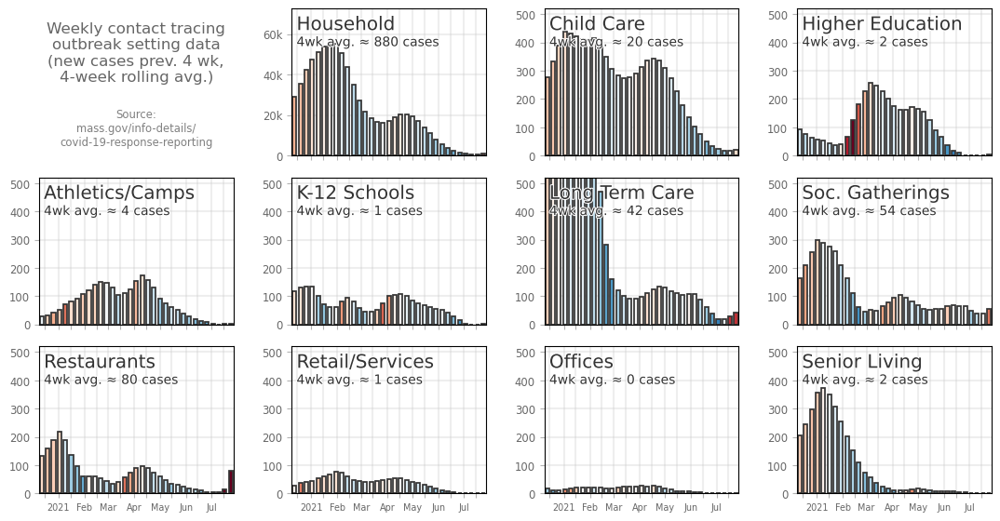

In [25]:
colum = 'raw_new_cases'
colab = 'new cases prev. 4 wk'
colim = 0.75

w = 3.3; h = 2.3
ncols = 4; nrows = 3
tups = list(it.product(range(nrows), range(ncols)))
fig, ax = plt.subplots(nrows, ncols, figsize=(ncols*w,nrows*h), dpi=100, sharex=True)#, sharey=True)
plt.subplots_adjust(wspace=0.3,hspace=0.15)

wid = 4
for di, dcurr in enumerate(tmp):
    di += 1
    aa = ax[tups[di]]
    cti = contact_df.loc[contact_df['setting']==dcurr].copy()

    norm = matplotlib.colors.Normalize(vmin=-colim, vmax=colim)
    cvals = norm(np.nan_to_num((cti[colum]+1).rolling(window=wid).mean().pct_change().values))
    col = plt.cm.RdBu_r(cvals)
    four_wmean = np.nanmean(np.nan_to_num(cti[colum].values)[-nw:])
    cti[colum] = cti[colum].rolling(window=wid).mean()

    aa.bar([date_dict[i] for i in cti['end_date'].values], cti[colum].values,
           color=col, ec='.2', width=barw, lw=1.25)
    
    aa.text(0.025,0.95,labs[dcurr],ha='left',va='top',
            transform=aa.transAxes,fontsize='x-large',color='.2',
            path_effects=[path_effects.Stroke(linewidth=1.5, foreground='w'),
                          path_effects.Normal()])

    aa.text(0.025,0.815,'%iwk avg. ≈ %i cases'%(nw,int(four_wmean)),
            ha='left', va='top',transform=aa.transAxes, fontsize='medium',color='.2',
            path_effects=[path_effects.Stroke(linewidth=1.5, foreground='w'),
                          path_effects.Normal()])

    aa.grid(linewidth=1.5,color='.75',alpha=0.25)
    aa.tick_params(labelcolor='.4',color='.7',labelsize='small')

    aa.set_xticks([date_dict[i] for i in dates_tt])
    aa.set_xticklabels(dates_ll, fontsize='x-small')
    aa.set_xlim(date_dict[contact_df['end_date'].unique()[7]]-barw/2-1,
                date_dict[contact_df['end_date'].max()]+barw/2+1)

    aa.yaxis.set_major_locator(MaxNLocator(integer=True, nbins='auto'))
    ylims = aa.get_ylim()
    ydiff = ylims[1] - ylims[0]
    aa.set_ylim(ylims[0], ylims[1]+ydiff*0.325)

    if di == 1:
        aa.set_ylim(0, 72500)
        aa.set_yticks([0, 20000, 40000, 60000])
        aa.set_yticklabels(['0', '20k', '40k', '60k'])
    else:
        aa.set_ylim(0,520)


aa = ax[tups[0]]
aa.text(0.5, 0.70, 'Weekly contact tracing\noutbreak setting data\n(%s,\n%i-week rolling avg.)'%(colab, wid),
        ha='center', va='center', transform=aa.transAxes, color='.4', fontsize='large')
aa.text(0.5, 0.05, 'Source:\nmass.gov/info-details/\ncovid-19-response-reporting',
        ha='center', va='bottom', transform=aa.transAxes, color='.5', fontsize='small')

aa.set_axis_off()

plt.savefig('../figs/pngs/ma_outbreak_settings_%s_%s.png'%(colum,'tmp'),dpi=425,bbox_inches='tight')

plt.show()

# Hospitalization

In [26]:
hosp_fn = 'https://healthdata.gov/api/views/anag-cw7u/rows.csv?accessType=DOWNLOAD'
hosp = pd.read_csv(hosp_fn, dtype={'fips_code':str,'zip':str})
hosp['collection_week'] = hosp.collection_week.astype(str).str[0:4] + '-' +\
                          hosp.collection_week.astype(str).str[5:7] + '-' +\
                          hosp.collection_week.astype(str).str[-2:]
hospx = hosp[['collection_week','state','hospital_name',
              'city','zip','fips_code']].copy()

In [27]:
adult_col = 'total_adult_patients_hospitalized_confirmed_and_suspected_covid_7_day_avg'
child_col = 'total_pediatric_patients_hospitalized_confirmed_and_suspected_covid_7_day_avg'
nrep = 500

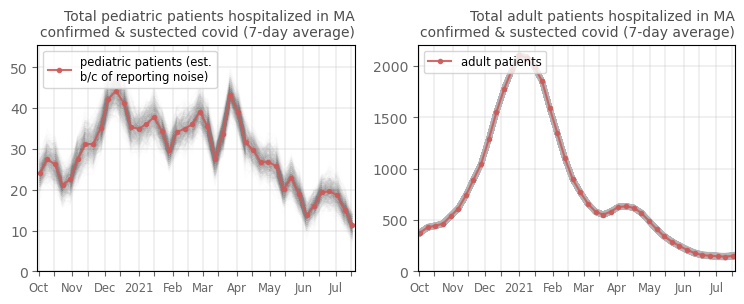

In [28]:
st = 'MA'
fig, ax = plt.subplots(1,2,figsize=(9,3),dpi=100)
adult_avg = []
child_avg = []
wid = 2

for xi in range(nrep):
    ma_hosp = hosp.loc[hosp['state']==st].copy()
    ma_hosp[adult_col] = [i if i != -999999.0 else np.random.randint(1,5) for i in ma_hosp[adult_col]]
    ma_hosp[child_col] = [i if i != -999999.0 else np.random.randint(1,5) for i in ma_hosp[child_col]]

    ma_hosp_g = ma_hosp.groupby(['collection_week']).agg({adult_col:np.nansum,
                                                          child_col:np.nansum}).reset_index()
    dates = [i for i in ma_hosp_g['collection_week'].values if i > '2020-10-01']
    ax[0].plot([date_dict[i] for i in dates],
         ma_hosp_g[child_col].rolling(window=wid).mean().values[-len(dates):],
         color='.5', lw=1, alpha=0.01, marker='')
    ax[1].plot([date_dict[i] for i in dates],
         ma_hosp_g[adult_col].rolling(window=wid).mean().values[-len(dates):],
         color='.7', lw=4, alpha=0.01, marker='')
    adult_avg.append(ma_hosp_g[adult_col].rolling(window=wid).mean().values[-len(dates):])
    child_avg.append(ma_hosp_g[child_col].rolling(window=wid).mean().values[-len(dates):])

ax[0].plot([date_dict[i] for i in dates], np.mean(child_avg,axis=0),
     color='indianred', lw=1.5, alpha=0.9, label='pediatric patients (est.\nb/c of reporting noise)',marker='.')
ax[1].plot([date_dict[i] for i in dates], np.mean(adult_avg,axis=0),
     color='indianred', lw=1.5, alpha=0.9, label='adult patients',marker='.')
        
ax[0].set_title('Total pediatric patients hospitalized in %s'%st+\
                '\nconfirmed & sustected covid (7-day average)',
             x=1,color='.3',ha='right',fontsize='medium')
ax[1].set_title('Total adult patients hospitalized in %s'%st+\
                '\nconfirmed & sustected covid (7-day average)',
             x=1,color='.3',ha='right',fontsize='medium')

dates_tt = ['2020-10-01','2020-10-15','2020-11-01','2020-11-15','2020-12-01','2020-12-15','2021-01-01',
            '2021-01-15','2021-02-01','2021-02-15','2021-03-01','2021-03-15','2021-04-01','2021-04-15',
            '2021-05-01','2021-05-15','2021-06-01','2021-06-15','2021-07-01','2021-07-15','2021-08-01']
dates_ll = ['Oct','','Nov','','Dec','','2021','','Feb','','Mar','','Apr','','May','','Jun','','Jul','','Aug']
for a in fig.axes:
    a.legend(loc=2, fontsize='small')
    a.set_xticks([date_dict[i] for i in dates_tt])
    a.set_xticklabels(dates_ll, fontsize='small')
    a.set_xlim(date_dict['2020-10-01']-1,
               date_dict[ma_hosp_g['collection_week'].values[-1]]+2)
    a.tick_params(labelcolor='.4', color='.4')
    a.grid(linewidth=1.25,color='.75',alpha=0.25)
    a.set_ylim(0)

plt.savefig('../figs/pngs/pediatric_and_adult_%s.png'%st,dpi=425,bbox_inches='tight')
plt.show()    

In [29]:
ma_hosp = hosp.loc[hosp['state']==st].copy()
ma_hosp[child_col] = [i if i != -999999.0 else 1 for i in ma_hosp[child_col]]
ma_hosp_g = ma_hosp.groupby(['collection_week']).agg({adult_col:np.nansum,
                                                      child_col:np.nansum}).reset_index()

url_st_hosp = 'https://healthdata.gov/api/views/g62h-syeh/rows.csv?accessType=DOWNLOAD'
hosp_st = pd.read_csv(url_st_hosp)
hosp_st['date'] = pd.to_datetime(hosp_st['date']).astype(str)
hosp_st = hosp_st.loc[hosp_st['date']>'2020-07-15'].copy()
hosp_st = hosp_st.sort_values(['state','date']).reset_index().iloc[:,1:]

all_prev_cols = ['previous_day_admission_adult_covid_confirmed',
                 'previous_day_admission_adult_covid_suspected',
                 'previous_day_admission_pediatric_covid_confirmed',
                 'previous_day_admission_pediatric_covid_suspected']
adult_prev_cols = ['previous_day_admission_adult_covid_confirmed',
                   'previous_day_admission_adult_covid_suspected']
child_prev_cols = ['previous_day_admission_pediatric_covid_confirmed',
                   'previous_day_admission_pediatric_covid_suspected']
adult_total_cols = 'total_adult_patients_hospitalized_confirmed_and_suspected_covid'
child_total_cols = 'total_pediatric_patients_hospitalized_confirmed_and_suspected_covid'
total_cols = ['total_adult_patients_hospitalized_confirmed_and_suspected_covid',
              'total_pediatric_patients_hospitalized_confirmed_and_suspected_covid']

hosp_st['previous_day_admission_confirmed_and_suspected'] = hosp_st[all_prev_cols].sum(axis=1)
hosp_st['total_patients_confirmed_and_suspected_covid'] = hosp_st[total_cols].sum(axis=1)
hosp_st['previous_day_pediatric_admission_confirmed_and_suspected'] = hosp_st[child_prev_cols].sum(axis=1)
hosp_st['previous_day_adult_admission_confirmed_and_suspected'] = hosp_st[adult_prev_cols].sum(axis=1)
ma_hosp = hosp_st.loc[hosp_st['state']=='MA'].copy()
ma_hosp = ma_hosp.loc[ma_hosp['date']>'2020-09-01'].copy()

In [30]:
sch_dfg = school_df.groupby(['date','num_students_est','num_employee_est']).agg({'new_cases_students':'sum',
                                         'new_cases_employee':'sum'}).reset_index()
sch_dfg = sch_dfg.merge(DATE_DF[['date','week']], how='left', on='date')

sch_dfg = pd.concat([sch_dfg,pd.DataFrame({'date':['2020-12-31'],'new_cases_students':[np.nan],
              'new_cases_employee':[np.nan],'week':[51]})]).sort_values('date').reset_index().iloc[:,1:]
sch_dfg.loc[sch_dfg['date']=='2021-02-18','new_cases_students'] = np.nan
sch_dfg.loc[sch_dfg['date']=='2021-02-18','new_cases_employee'] = np.nan
sch_dfg.loc[sch_dfg['date']=='2021-04-15','new_cases_students'] = np.nan
sch_dfg.loc[sch_dfg['date']=='2021-04-15','new_cases_employee'] = np.nan

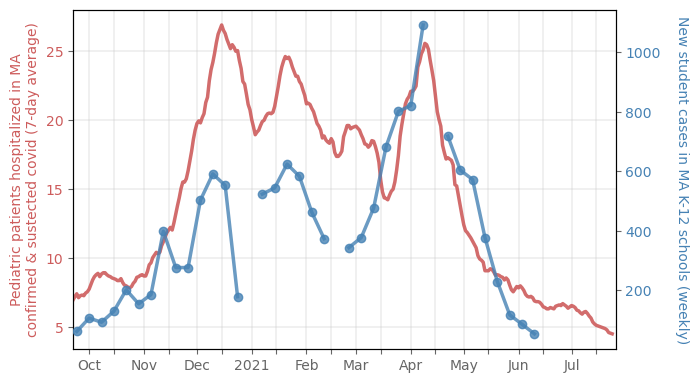

In [31]:
wx = 21
fig, ax = plt.subplots(1,1,figsize=(7,4.5),dpi=100)

ax.plot([date_dict[i] for i in ma_hosp['date']], 
        ma_hosp[child_total_cols].rolling(window=wx).mean(),
         color='indianred', lw=2.5, alpha=0.9, zorder=20)

ax2 = ax.twinx()
ax2.plot([date_dict[i] for i in sch_dfg['date']],
        sch_dfg['new_cases_students'].values, marker='o',
        label='students', lw=2.5, color='steelblue', zorder=10, alpha=0.8)
ax2.tick_params(axis='x', labelcolor='.4', color='.4')
ax2.tick_params(axis='y', labelcolor='steelblue', color='.4')
ax2.set_ylabel('New student cases in MA K-12 schools (weekly)',
               color='steelblue', rotation=270, labelpad=20)

ax.set_ylabel('Pediatric patients hospitalized in MA'+\
              '\nconfirmed & sustected covid (7-day average)',
              color='indianred')

ax.set_xticks([date_dict[i] for i in dates_tt])
ax.set_xticklabels(dates_ll)
ax.set_xlim(date_dict['2020-09-21']+wid-1,
            date_dict[ma_hosp['date'].values[-1]]+2)
ax.tick_params(axis='x', labelcolor='.4', color='.4')
ax.tick_params(axis='y', labelcolor='indianred', color='.4')
ax.grid(linewidth=1.25,color='.75',alpha=0.25)
# ax.set_ylim(0)
# ax2.set_ylim(0)

plt.savefig('../figs/pngs/pediatric_hosp_ma_schools.png',dpi=425,bbox_inches='tight')
plt.show()    

In [32]:
sch_dfg['new_cases_students_per100k'] = sch_dfg['new_cases_students'] / sch_dfg['num_students_est'] * 100000

In [33]:
ma_hospg = ma_hosp.merge(DATE_DF[['date','week']]).groupby('week').agg({child_total_cols:'max',
                                                             'date':'max'}).reset_index()
ma_hospg[child_total_cols] = ma_hospg[child_total_cols].astype(int)

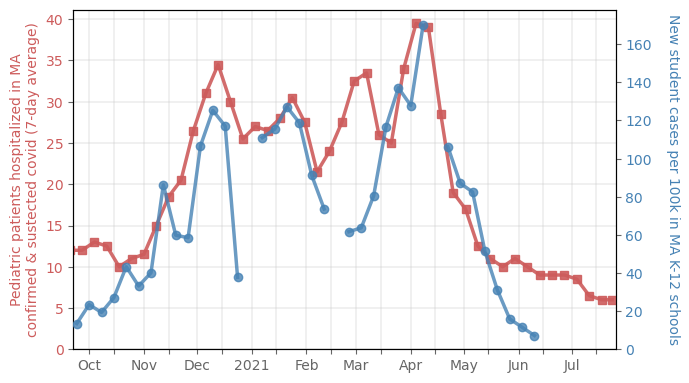

In [34]:
wx = 2
fig, ax = plt.subplots(1,1,figsize=(7,4.5),dpi=100)

ax.plot([date_dict[i] for i in ma_hospg['date']], 
        ma_hospg[child_total_cols].rolling(window=wx).mean(),
#         ma_hosp[child_total_cols].rolling(window=wx).mean(),
         color='indianred', lw=2.5, alpha=0.9, zorder=20, marker='s')

ax2 = ax.twinx()
ax2.plot([date_dict[i] for i in sch_dfg['date']],
        sch_dfg['new_cases_students_per100k'].rolling(window=1).mean(), marker='o',
        label='students', lw=2.5, color='steelblue', zorder=10, alpha=0.8)
ax2.tick_params(axis='x', labelcolor='.4', color='.4')
ax2.tick_params(axis='y', labelcolor='steelblue', color='.4')
ax2.set_ylabel('New student cases per 100k in MA K-12 schools',
               color='steelblue', rotation=270, labelpad=20)

ax.set_ylabel('Pediatric patients hospitalized in MA'+\
              '\nconfirmed & sustected covid (7-day average)',
              color='indianred')

ax.set_xticks([date_dict[i] for i in dates_tt])
ax.set_xticklabels(dates_ll)
ax.set_xlim(date_dict['2020-09-21']+wid-1,
            date_dict[ma_hosp['date'].values[-1]]+2)
ax.tick_params(axis='x', labelcolor='.4', color='.4')
ax.tick_params(axis='y', labelcolor='indianred', color='.4')
ax.grid(linewidth=1.25,color='.75',alpha=0.25)
# ax.set_yscale('log')
# ax2.set_yscale('log')
ax.set_ylim(0)
ax2.set_ylim(0)

plt.savefig('../figs/pngs/pediatric_hosp_ma_schools_per100k.png',dpi=425,bbox_inches='tight')
plt.show()    

_________________

# Schools

In [35]:
city_dfg = city_df.groupby('date').agg({'new_cases_town':np.nansum}).reset_index()
city_dfg = city_dfg.loc[(city_dfg['date']>=sch_dfg['date'].min())].copy()

In [36]:
dates_tt = ['2020-09-01','2020-10-01','2020-11-01','2020-12-01','2021-01-01',
            '2021-02-01','2021-03-01','2021-04-01','2021-05-01','2021-06-01','2021-07-01']
dates_ll = ['Sep','Oct','Nov','Dec','2021','Feb','Mar','Apr','May','Jun','Jul']

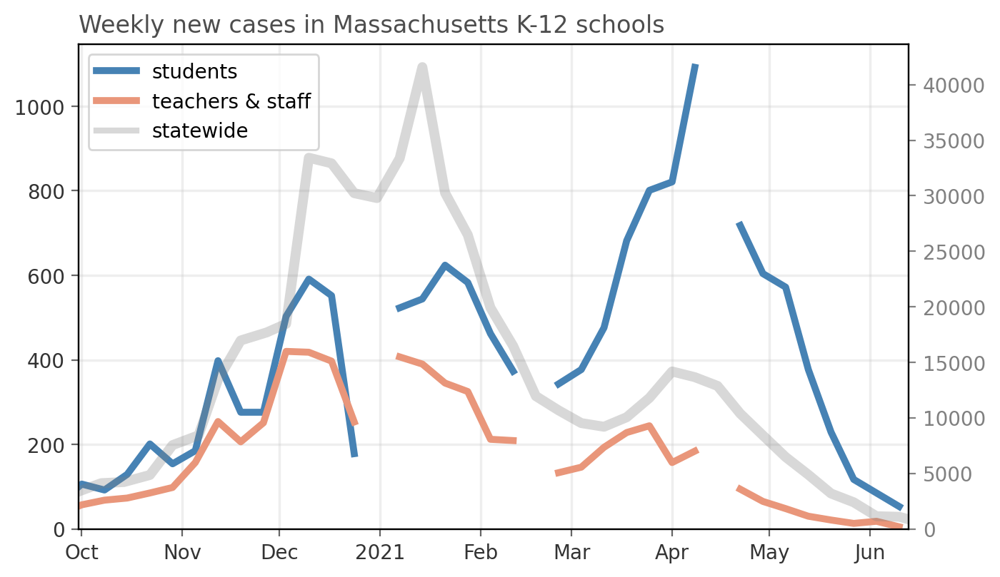

In [37]:
wid = 1
fig, ax = plt.subplots(1,1, figsize=(7.5, 4.5), dpi=200)

cols = ['steelblue','darksalmon']

ax.plot([date_dict[i] for i in sch_dfg['date']],
        sch_dfg['new_cases_students'].rolling(window=wid).mean().values,
        label='students', lw=3.5, color=cols[0], zorder=100)
ax.plot([date_dict[i] for i in sch_dfg['date']],
        sch_dfg['new_cases_employee'].rolling(window=wid).mean().values,
        label='teachers & staff', lw=3.5, color=cols[1], zorder=100)

ax.plot([-100,-101],[-1,-1],lw=3,color='.5',alpha=0.3,
        label='statewide')

ax2 = ax.twinx()
ax2.plot([date_dict[i] for i in city_dfg['date']],
          city_dfg['new_cases_town'].rolling(window=wid).mean().values,
         lw=5,color='.5',alpha=0.3)
ax2.tick_params(labelcolor='.5', color='.5')

ax.set_xticks([date_dict[i] for i in dates_tt])
ax.set_xticklabels(dates_ll)
ax.set_xlim(date_dict[sch_dfg['date'].min()]-1+7,date_dict[sch_dfg['date'].max()]+3)

ax.legend(loc=2)
ax.tick_params(labelcolor='.2', color='.4')
ax.grid(linewidth=1.25,color='.75',alpha=0.25)
ax.set_ylim(0)
ax2.set_ylim(0)

ax.set_title('Weekly new cases in Massachusetts K-12 schools',
             x=0,color='.3',ha='left')

plt.savefig('../figs/pngs/ma_k12_schools',dpi=425,bbox_inches='tight')
plt.show()

In [38]:
city_dfg = city_dfg.merge(DATE_DF[['date','week']], how='left', on='date')
ma_dfg = sch_dfg.merge(city_dfg[['week','new_cases_town']])

In [39]:
ma_dfg['date'] = [DATERANGE[date_dict[i]+6] for i in ma_dfg['date']]

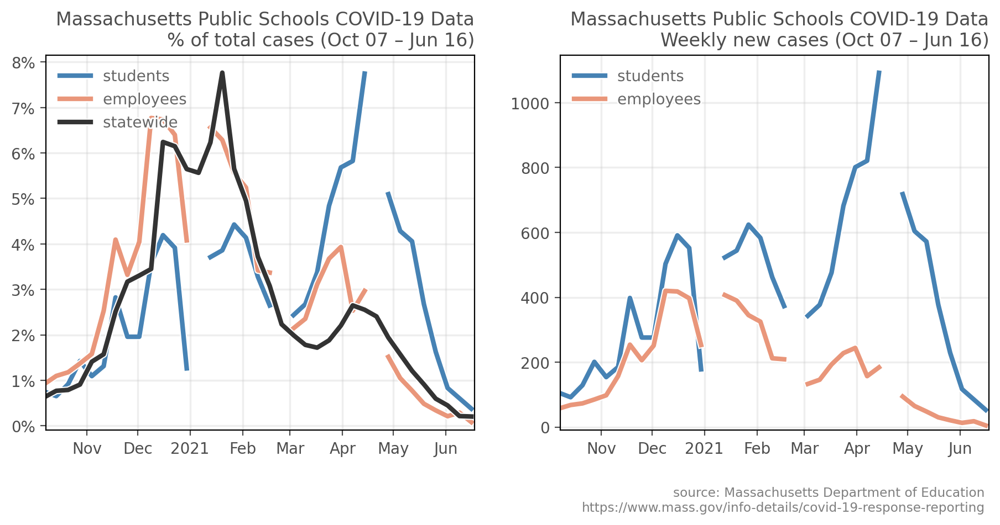

In [40]:
wid = 1
lw = 3
fig, ax = plt.subplots(1,2,figsize=(11,4.5),dpi=200)

labs_tx = ['students','employees','statewide']
cols = ['steelblue','darksalmon','.2']
for ci, col in enumerate(['new_cases_students','new_cases_employee','new_cases_town']):
    xvals_i = [date_dict[i] for i in ma_dfg['date'].values]
    yvals_i = ma_dfg[col].rolling(window=wid).mean().values
    ax[0].plot(xvals_i, yvals_i/np.nansum(yvals_i), label=labs_tx[ci], lw=lw, color=cols[ci],
            path_effects=[path_effects.Stroke(linewidth=lw*1.5, foreground='w'),
                          path_effects.Normal()])
    if ci < 2:
        yvals_i = ma_dfg[col].rolling(window=wid).mean().values
        ax[1].plot(xvals_i, yvals_i, label=labs_tx[ci], lw=lw, color=cols[ci],
                path_effects=[path_effects.Stroke(linewidth=lw*1.5, foreground='w'),
                              path_effects.Normal()])


ax[0].set_ylim(-0.001)
ax[1].set_ylim(-10)

ax[0].yaxis.set_major_formatter(mtick.PercentFormatter(1.0,decimals=0))
tlabs = ['% of total cases '+\
              '(%s %s – %s %s)'%(month_dict[ma_dfg['date'].min()[5:7]],
                                 ma_dfg['date'].min()[8:],
                                 month_dict[ma_dfg['date'].max()[5:7]],
                                 ma_dfg['date'].max()[8:]),
        'Weekly new cases '+\
              '(%s %s – %s %s)'%(month_dict[ma_dfg['date'].min()[5:7]],
                                 ma_dfg['date'].min()[8:],
                                 month_dict[ma_dfg['date'].max()[5:7]],
                                 ma_dfg['date'].max()[8:]),]

for ai,a in enumerate(fig.axes):
    a.set_xticks([date_dict[i] for i in dates_tt])
    a.set_xticklabels(dates_ll)
    l = a.legend(loc=2, ncol=1, framealpha=0)
    for text in l.get_texts():
        text.set_color('.4')
        text.set_path_effects([path_effects.Stroke(linewidth=2, foreground='w'),
                               path_effects.Normal()])

    a.tick_params(labelcolor='.3', color='.3')
    a.grid(linewidth=1.25,color='.75',alpha=0.25)
    a.set_title('Massachusetts Public Schools COVID-19 Data\n'+tlabs[ai],
                x=1,color='.3',ha='right')
    a.set_xlim(date_dict[ma_dfg['date'].min()]+1,
                date_dict[ma_dfg['date'].max()]+2)

ax[1].text(0.99,-0.15,'source: Massachusetts Department of Education\n'+\
        'https://www.mass.gov/info-details/covid-19-response-reporting',
        color='.5',fontsize='small', va='top', ha='right', transform=ax[1].transAxes)


plt.savefig('../figs/pngs/massachusetts_k12_studentstaff.png',dpi=425,bbox_inches='tight')
plt.savefig('../figs/pdfs/massachusetts_k12_studentstaff.pdf',bbox_inches='tight')
plt.show()

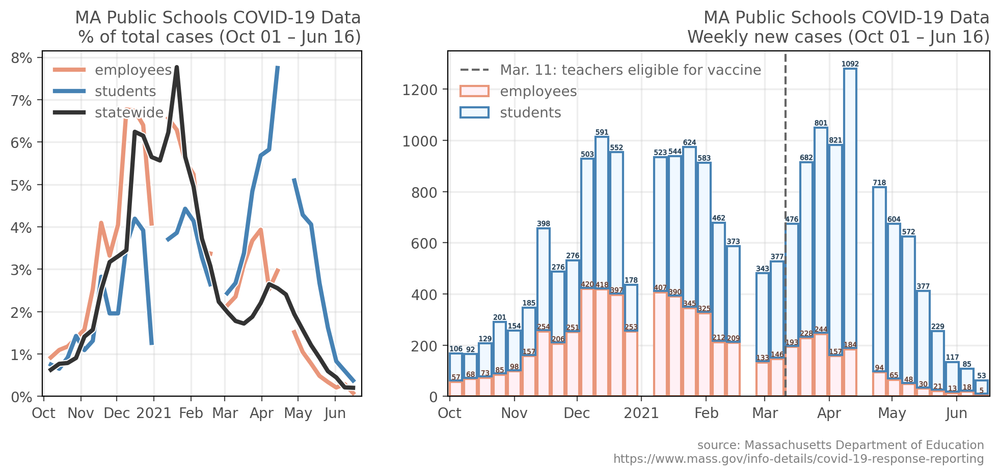

In [41]:
wid = 1
lw = 3
fig, ax = plt.subplots(1,2,figsize=(12,4.5),dpi=200,gridspec_kw={'width_ratios':[1,1.7]})

labs_tx = ['employees','students','statewide']
cols = ['darksalmon','steelblue','.2']
cols2 = ['lavenderblush','aliceblue','.2']
bbot = np.zeros(ma_dfg.shape[0])
width = 6
for ci, col in enumerate(['new_cases_employee','new_cases_students','new_cases_town']):
    xvals_i = np.array([date_dict[i] for i in ma_dfg['date'].values])
    yvals_i = ma_dfg[col].rolling(window=wid).mean().values
    ax[0].plot(xvals_i, yvals_i/np.nansum(yvals_i), label=labs_tx[ci], lw=lw, color=cols[ci],
            path_effects=[path_effects.Stroke(linewidth=lw*1.5, foreground='w'),
                          path_effects.Normal()])
    if ci < 2:
        yvals_i = ma_dfg[col].rolling(window=wid).mean().values
        ax[1].bar(xvals_i-3, yvals_i, bottom=bbot, label=labs_tx[ci], lw=1.5, color=cols2[ci],
                  width=width, ec=cols[ci])
        for xi,x in enumerate(ma_dfg[col]):
            if np.nan_to_num(x) != 0:
                ax[1].text(xvals_i[xi]-3, x+bbot[xi]+3, int(x), ha='center', va='bottom',
                           fontsize=4.85,color='.2',#cols[ci],#fontweight='bold',
                           path_effects=[path_effects.Stroke(linewidth=0.35, foreground=cols[ci]),
                                         path_effects.Normal()])

        bbot += yvals_i + 5


ax[0].set_ylim(-0)
ax[1].vlines(date_dict['2021-03-11'], -10, 1350, linestyle='--',color='.4',
             label='Mar. 11: teachers eligible for vaccine')

ax[1].set_ylim(-0,1350)

mind = DATERANGE[date_dict[ma_dfg['date'].min()]-6]
ax[0].yaxis.set_major_formatter(mtick.PercentFormatter(1.0,decimals=0))
tlabs = ['% of total cases '+\
              '(%s %s – %s %s)'%(month_dict[mind[5:7]],
                                 mind[8:],
                                 month_dict[ma_dfg['date'].max()[5:7]],
                                 ma_dfg['date'].max()[8:]),
        'Weekly new cases '+\
              '(%s %s – %s %s)'%(month_dict[mind[5:7]],
                                 mind[8:],
                                 month_dict[ma_dfg['date'].max()[5:7]],
                                 ma_dfg['date'].max()[8:]),]

for ai,a in enumerate(fig.axes):
    pp = 0
    if ai == 0:
        pp = 6
    a.set_xticks([date_dict[i] for i in dates_tt])
    a.set_xticklabels(dates_ll)
    l = a.legend(loc=2, ncol=1, framealpha=0)
    for text in l.get_texts():
        text.set_color('.4')
        text.set_path_effects([path_effects.Stroke(linewidth=2, foreground='w'),
                               path_effects.Normal()])

    a.tick_params(labelcolor='.3', color='.3')
    a.grid(linewidth=1.25,color='.75',alpha=0.25)
    a.set_title('MA Public Schools COVID-19 Data\n'+tlabs[ai],
                x=1,color='.3',ha='right')
    a.set_xlim(date_dict[ma_dfg['date'].min()]-7,
#     a.set_xlim(date_dict[ma_dfg['date'].min()]+14,
               date_dict[ma_dfg['date'].max()]+1+pp)

ax[1].text(0.99,-0.125,'source: Massachusetts Department of Education\n'+\
        'https://www.mass.gov/info-details/covid-19-response-reporting',
        color='.5',fontsize='small', va='top', ha='right', transform=ax[1].transAxes)


plt.savefig('../figs/pngs/massachusetts_k12_studentstaff_bar.png',dpi=425,bbox_inches='tight')
plt.savefig('../figs/pdfs/massachusetts_k12_studentstaff_bar.pdf',bbox_inches='tight')
plt.show()

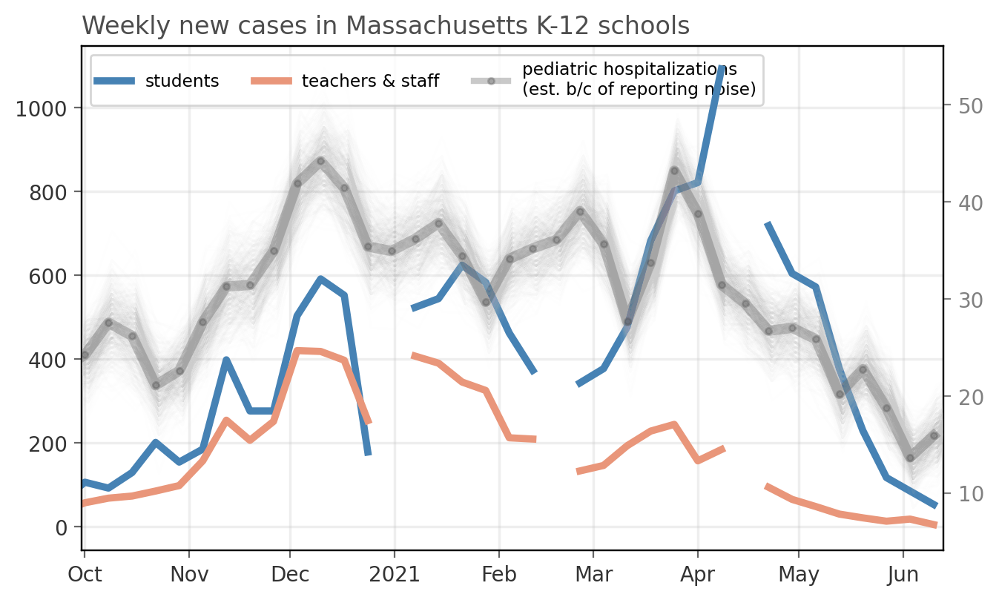

In [42]:
wid = 2
fig, ax = plt.subplots(1,1, figsize=(7.5, 4.5), dpi=200)

cols = ['steelblue','darksalmon']

ax2 = ax.twinx()
child_avg = []
for xi in range(500):
    ma_hosp = hosp.loc[hosp['state']==st].copy()
    ma_hosp[child_col] = [i if i != -999999.0 else np.random.randint(1,5) for i in ma_hosp[child_col]]

    ma_hosp_g = ma_hosp.groupby(['collection_week']).agg({child_col:np.nansum}).reset_index()
    dates = [i for i in ma_hosp_g['collection_week'].values]

    ax2.plot([date_dict[i] for i in dates],ma_hosp_g[child_col].rolling(window=wid).mean().values,
             color='.8', lw=1, alpha=0.02, marker='',zorder=10)
    child_avg.append(ma_hosp_g[child_col].rolling(window=wid).mean().values)

tmp = ma_hosp_g.merge(DATE_DF.rename(columns={'date':'collection_week'}),
                      how='left', on='collection_week')
tmp['pediatric_hosp'] = np.mean(child_avg,axis=0)
tmp = tmp.rename(columns={'collection_week':'date'})
child_hosp = tmp[['date','week','pediatric_hosp']].copy()
sch_dfg_hosp = sch_dfg.merge(child_hosp[['week','pediatric_hosp']], how='left', on='week')

ax2.plot([date_dict[i] for i in sch_dfg_hosp['date']],
         sch_dfg_hosp['pediatric_hosp'].values,
         color='.3',lw=5,alpha=0.3,marker='.',zorder=11)
ax2.tick_params(labelcolor='.5', color='.5')

ax.plot([date_dict[i] for i in sch_dfg['date']],
        sch_dfg['new_cases_students'].values,
        label='students', lw=3.5, color=cols[0], zorder=100)
ax.plot([date_dict[i] for i in sch_dfg['date']],
        sch_dfg['new_cases_employee'].values,
        label='teachers & staff', lw=3.5, color=cols[1], zorder=100)
ax.plot([-100,-101],[-1,-1],lw=3,color='.3',alpha=0.3,marker='.',
        label='pediatric hospitalizations\n(est. b/c of reporting noise)')

ax.set_xticks([date_dict[i] for i in dates_tt])
ax.set_xticklabels(dates_ll)
ax.set_xlim(date_dict[sch_dfg['date'].min()]-1+7,date_dict[sch_dfg['date'].max()]+3)

ax.legend(loc=2, ncol=3, fontsize='small')
ax.tick_params(labelcolor='.2', color='.4')
ax.grid(linewidth=1.25,color='.75',alpha=0.25)
# ax.set_ylim(0)
# ax2.set_ylim(0)

ax.set_title('Weekly new cases in Massachusetts K-12 schools',
             x=0,color='.3',ha='left')

plt.savefig('../figs/pngs/ma_k12_schools_hosp',dpi=425,bbox_inches='tight')
plt.show()

_________________

In [43]:
mass_data = client.open("COVID-data_Massachusetts")
vaccine_city_age_data = mass_data.worksheet('vaccine_city_age')

vax_age_dfx = pd.DataFrame(vaccine_city_age_data.get_all_records(default_blank=np.nan))
vax_age_dfx = vax_age_dfx.loc[vax_age_dfx['city']!='Unspecified'].copy()
vax_age_df = vax_age_dfx.loc[vax_age_dfx['age_group']!='Total'][['date', 'county', 'city',
         'age_group', 'population',  'atleast_onedose', 'fully_vaccinated','partially_vaccinated']].copy()

In [44]:
non = vax_age_df.loc[~vax_age_df['age_group'].isin(['12-15 Years','16-19 Years'])].copy()

tmp = vax_age_df.loc[vax_age_df['age_group'].isin(['12-15 Years','16-19 Years'])].copy()
tmp = tmp.groupby(['date','county','city']).agg({'atleast_onedose':'sum',
                                           'fully_vaccinated':'sum',
                                           'partially_vaccinated':'sum'}).reset_index()
tmp['age_group'] = '0-19 Years'
tmp = tmp.merge(vax_age_df.loc[(vax_age_df['date']=='2021-05-11')&(vax_age_df['age_group']=='0-19 Years')][['county',
                                            'city','population']], how='left', on=['county','city'])

vax_age_df = pd.concat([non,tmp]).sort_values(['date','county','city','age_group']).reset_index().iloc[:,1:]

In [45]:
tots = vax_age_df.loc[vax_age_df['age_group']!='Total'].groupby(['date','county','city']).agg({'population':'sum', 
                                                            'atleast_onedose':'sum',
                                                            'fully_vaccinated':'sum',
                                                            'partially_vaccinated':'sum'}).reset_index()
tots['age_group'] = 'Total'

vax_age_df = pd.concat([vax_age_df.drop_duplicates(),tots])

vax_age_dfg = vax_age_df.groupby(['date','age_group']).agg({'population':'sum', 
                                                            'atleast_onedose':'sum',
                                                            'fully_vaccinated':'sum',
                                                            'partially_vaccinated':'sum'}).reset_index()

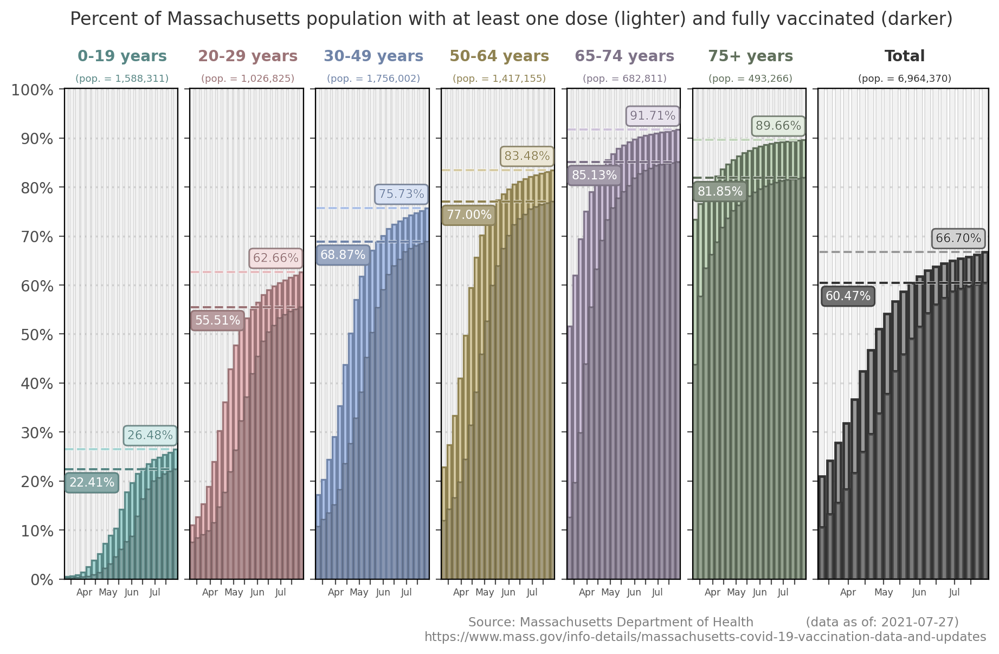

In [46]:
fig, ax = plt.subplots(1,vax_age_dfg['age_group'].nunique(),figsize=(11,6),dpi=200,sharey=True,sharex=True,
                       gridspec_kw={'width_ratios':[1]*(vax_age_dfg['age_group'].nunique()-1)+[1.5]})
plt.subplots_adjust(wspace=0.1)

colors = plt.cm.Pastel1_r(np.linspace(0,1,vax_age_dfg['age_group'].nunique()-1))
colors = ["#a6d5d3","#e7bbbe","#adc1e7","#d6cba4","#cec2d9","#c2d5bc"] + ['.6']
color_d = ["#588785","#9b7376","#7084a8","#8f8251","#7e7388","#606f5b"]+['.2']

for ai,ag in enumerate(vax_age_dfg['age_group'].unique()):
    vig = vax_age_dfg.loc[vax_age_dfg['age_group']==ag].copy()
    last_pad = 0
    if ag=='Total':
        last_pad=0.5
    
    ax[ai].bar([date_dict[i] for i in vig['date']], 1,
           fc='.95', ec='.2', width=5, linestyle='-', lw=0.1)
    ax[ai].bar([date_dict[i] for i in vig['date']],
               (vig['atleast_onedose']/vig['population']).tolist(),
               width=5, ec=color_d[ai], color=colors[ai], lw=1.2+last_pad)
    ax[ai].bar([date_dict[i] for i in vig['date']],
               (vig['fully_vaccinated']/vig['population']).tolist(),
               width=5, color='.2', lw=1.2+last_pad, ec='.2')
    ax[ai].bar([date_dict[i] for i in vig['date']],
               (vig['fully_vaccinated']/vig['population']).tolist(),
               width=5, ec=color_d[ai], alpha=0.7, color=colors[ai], lw=1.2+last_pad)

    vmax = (vig['atleast_onedose']/vig['population']).max()
    ax[ai].hlines(vmax, date_dict[vax_age_dfg['date'].min()]-2, date_dict[vax_age_dfg['date'].max()]-4,
                  lw=1.5, color=colors[ai], linestyle='--',
                  path_effects=[path_effects.Stroke(linewidth=2, foreground='w'),
                                path_effects.Normal()])
    props = dict(boxstyle='round', fc='w', alpha=0.999, ec='.5')
    ax[ai].text(date_dict[vax_age_dfg['date'].max()]-3, vmax+0.015, '%.2f%%'%(100*vmax),
                ha='right', va='bottom', fontsize=8,color='w', bbox=props)
    props = dict(boxstyle='round', fc=colors[ai], alpha=0.45, ec=color_d[ai])
    ax[ai].text(date_dict[vax_age_dfg['date'].max()]-3, vmax+0.015, '%.2f%%'%(100*vmax),
                ha='right', va='bottom', fontsize=8,color=color_d[ai],
                path_effects=[path_effects.Stroke(linewidth=0.5, foreground='w'),
                              path_effects.Normal()], bbox=props)

    vmax = (vig['fully_vaccinated']/vig['population']).max()
    ax[ai].hlines(vmax, date_dict[vax_age_dfg['date'].min()]-2, date_dict[vax_age_dfg['date'].max()]-4,
                  lw=1.5, color=color_d[ai], linestyle='--',
                  path_effects=[path_effects.Stroke(linewidth=2, foreground='w'),
                                path_effects.Normal()])
    props = dict(boxstyle='round', fc='w', alpha=0.999, ec='.5')
    ax[ai].text(date_dict[vax_age_dfg['date'].min()]+3, vmax-0.015, '%.2f%%'%(100*vmax),
                ha='left', va='top', fontsize=8,color='w', bbox=props)
    props = dict(boxstyle='round', fc=color_d[ai], alpha=0.7, ec=color_d[ai])
    ax[ai].text(date_dict[vax_age_dfg['date'].min()]+3, vmax-0.015, '%.2f%%'%(100*vmax),
                ha='left', va='top', fontsize=8,color='w',#color_d[ai],
                bbox=props)

    
    ax[ai].set_yticks(np.linspace(0,1,11))
    ax[ai].set_ylim(-0.001, 1.001)
    cat_ag = ag.replace(' Years',' years')
    ax[ai].text(0.51, 1.05, cat_ag, ha='center', va='bottom', transform=ax[ai].transAxes,
                fontsize='medium',color=color_d[ai], fontweight='bold')
    ax[ai].text(0.51, 1.01, "(pop. = {:,})".format(vig['population'].astype(int).unique()[0]),
                ha='center', va='bottom', transform=ax[ai].transAxes, fontsize=6.5,color=color_d[ai])

    
# dates_tt = [date_dict[i] for i in vig['date']]
# dates_ll = ['Mar\n9','Mar\n16','Mar\n23','Mar\n30','Apr\n6','Apr\n13','Apr\n20','Apr\n27','May\n4',
#             'May\n11','May\n18','May\n25','Jun\n1','Jun\n8','Jun\n15','Jun\n22','Jun\n29','Jul\n6','Jul\n13']
# dates_ll = [i if (ix-1)%3==0 else '' for ix,i in enumerate(dates_ll)]
dates_tt = [date_dict[i] for i in ['2021-03-15','2021-04-01','2021-04-15','2021-05-01','2021-05-15',
            '2021-06-01','2021-06-15','2021-07-01','2021-07-15','2021-08-01']]#,'2021-08-15','2021-09-01']
dates_ll = ['','Apr','','May','','Jun','','Jul','','Aug']#,'','Sep']

ax[0].yaxis.set_major_formatter(mtick.PercentFormatter(1.0,decimals=0))
plt.suptitle('Percent of Massachusetts population with at least'+\
             ' one dose (lighter) and fully vaccinated (darker)', color='.2', y=1.0)

for ai,a in enumerate(fig.axes):
    a.set_xticks(dates_tt)
    a.set_xticklabels(dates_ll, fontsize=6.25)
    a.tick_params(axis='x', which='major', pad=2)

    a.tick_params(labelcolor='.3', color='.3')
    a.grid(axis='y', linewidth=1.25,color='.5',alpha=0.25)
    a.set_xlim(date_dict[vax_age_dfg['date'].min()]-3,
               date_dict[vax_age_dfg['date'].max()]+3)

ax[-1].text(0.99,-0.075,'Source: Massachusetts Department of Health'+'             '+\
            '(data as of: %s)       \n'%vig['date'].max()+\
            'https://www.mass.gov/info-details/massachusetts-covid-19-vaccination-data-and-updates',
        color='.5',fontsize='small', va='top', ha='right', transform=ax[-1].transAxes)

plt.savefig('../figs/pngs/massachusetts_vaccine_age.png',dpi=425,bbox_inches='tight')
plt.savefig('../figs/pdfs/massachusetts_vaccine_age.pdf',bbox_inches='tight')

plt.show()

In [47]:
# mass_data = client.open("COVID-data_Massachusetts")
# city_meta_data = mass_data.worksheet('town_metadata')
# city_meta = pd.DataFrame(city_meta_data.get_all_records(default_blank=np.nan))

# city_remap = dict(zip(city_df['city'].unique(),[[i] for i in city_df['city'].unique()]))

# city_remap['Amherst'].append('Pelham')
# city_remap['Athol'].append('Phillipston')
# city_remap['Becket'].append('Washington')
# city_remap['Charlemont'].append('Hawley')
# city_remap['Chilmark'].append('Aquinnah')
# city_remap['Easthampton'].append('Westhampton')
# city_remap['Egremont'].append('Mount Washington')
# city_remap['Granville'].append('Tolland')
# city_remap['Great Barrington'].append('Alford')
# city_remap['Greenfield'].append('Leyden')
# city_remap['Hinsdale'].append('Peru')
# city_remap['Lanesborough'].append('Hancock')
# city_remap['Lanesborough'].append('New Ashford')
# city_remap['North Adams'].append('Clarksburg')
# city_remap['Westfield'].append('Montgomery')
# remove_towns = [j for ix,i in city_remap.items() for j in i if ix!=j]
# city_remap = {i:j for i,j in city_remap.items() if i not in remove_towns}

In [48]:
# city_merge = []
# x = 0
# for i,m in city_remap.items():
#     tmp = city_df.loc[city_df['city'].isin(m)].copy()
#     tmpg = tmp.groupby(['date','start_date','end_date']).agg({'population':'sum',
#                                                               'total_cases':'sum',
#                                                               'total_tests':'sum',
#                                                               'new_cases_town':'sum',
#                                                               'new_tests_town':'sum'}).reset_index()
#     tmpg['city'] = city_meta['city'].values[x]
#     city_merge.append(tmpg)
#     x += 1
# merge_df = pd.concat(city_merge).reset_index().iloc[:,1:]
# merge_df['total_fraction_infected'] = merge_df['total_cases'] / merge_df['population']
# merge_df = merge_df[['city', 'population', 'total_cases', 'total_fraction_infected',
#        'total_tests', 'new_cases_town', 'new_tests_town', 'date', 'start_date', 'end_date']].copy()

# most_recent_merge = merge_df.loc[merge_df['date']==merge_df['date'].max()].copy()
# most_recent_merge = most_recent_merge[['city', 'total_cases', 'total_fraction_infected',
#                    'total_tests', 'date']].copy()
# most_recent_merge = most_recent_merge.merge(city_meta, how='left', on='city')

# vaccine_city_sex_data = mass_data.worksheet('vaccine_city_sex')
# vax_sex_dfx = pd.DataFrame(vaccine_city_sex_data.get_all_records(default_blank=np.nan))
# vax_sex_dfx = vax_sex_dfx.loc[vax_sex_dfx['city']!='Unspecified'].copy()

# vax_sex_df = vax_sex_dfx[['date', 'county', 'city', 'sex', 'population', 
#        'atleast_onedose', 'fully_vaccinated','partially_vaccinated']].copy()

In [49]:
# tmp_vax_age = vax_age_df.loc[vax_age_df['date']==vax_age_df['date'].max()].copy()
# tmp_vax_rac = vax_race_dfx.loc[vax_race_dfx['date']==vax_race_dfx['date'].max()].copy()
# tmp_vax_sex = vax_sex_df.loc[vax_sex_df['date']==vax_sex_df['date'].max()].copy()

# tmp_vax_age = tmp_vax_age[['city', 'age_group', 'atleast_onedose', 'fully_vaccinated']].copy()
# tmp_vax_rac = tmp_vax_rac[['city', 'race', 'atleast_onedose', 'fully_vaccinated']].copy()
# tmp_vax_sex = tmp_vax_sex[['city', 'sex', 'atleast_onedose', 'fully_vaccinated']].copy()

# all_vax = tmp_vax_age.loc[tmp_vax_age['age_group']=='Total'][['city',
#                                           'atleast_onedose','fully_vaccinated']].copy()
# all_vax = all_vax.rename(columns={'atleast_onedose':'vaccination_total_atleast_onedose',
#                         'fully_vaccinated':'vaccination_total_fully_vaccinated'})


# age_vax_00_19 = tmp_vax_age.loc[tmp_vax_age['age_group']=='0-19 Years'][['city',
#                                           'atleast_onedose','fully_vaccinated']].copy()
# age_vax_00_19 = age_vax_00_19.rename(columns={'atleast_onedose':'vaccination_age_00_19_atleast_onedose',
#                                               'fully_vaccinated':'vaccination_age_00_19_fully_vaccinated'})

# age_vax_20_29 = tmp_vax_age.loc[tmp_vax_age['age_group']=='20-29 Years'][['city',
#                                           'atleast_onedose','fully_vaccinated']].copy()
# age_vax_20_29 = age_vax_20_29.rename(columns={'atleast_onedose':'vaccination_age_20_29_atleast_onedose',
#                                               'fully_vaccinated':'vaccination_age_20_29_fully_vaccinated'})

# age_vax_30_49 = tmp_vax_age.loc[tmp_vax_age['age_group']=='30-49 Years'][['city',
#                                           'atleast_onedose','fully_vaccinated']].copy()
# age_vax_30_49 = age_vax_30_49.rename(columns={'atleast_onedose':'vaccination_age_30_49_atleast_onedose',
#                                               'fully_vaccinated':'vaccination_age_30_49_fully_vaccinated'})

# age_vax_50_64 = tmp_vax_age.loc[tmp_vax_age['age_group']=='50-64 Years'][['city',
#                                           'atleast_onedose','fully_vaccinated']].copy()
# age_vax_50_64 = age_vax_50_64.rename(columns={'atleast_onedose':'vaccination_age_50_64_atleast_onedose',
#                                               'fully_vaccinated':'vaccination_age_50_64_fully_vaccinated'})

# age_vax_65_74 = tmp_vax_age.loc[tmp_vax_age['age_group']=='65-74 Years'][['city',
#                                           'atleast_onedose','fully_vaccinated']].copy()
# age_vax_65_74 = age_vax_65_74.rename(columns={'atleast_onedose':'vaccination_age_65_74_atleast_onedose',
#                                               'fully_vaccinated':'vaccination_age_65_74_fully_vaccinated'})

# age_vax_75over = tmp_vax_age.loc[tmp_vax_age['age_group']=='75+ Years'][['city',
#                                           'atleast_onedose','fully_vaccinated']].copy()
# age_vax_75over = age_vax_75over.rename(columns={'atleast_onedose':'vaccination_age_75_older_atleast_onedose',
#                                                 'fully_vaccinated':'vaccination_age_75_older_fully_vaccinated'})


# all_vax = all_vax.merge(age_vax_00_19, how='left', on='city')
# all_vax = all_vax.merge(age_vax_20_29, how='left', on='city')
# all_vax = all_vax.merge(age_vax_30_49, how='left', on='city')
# all_vax = all_vax.merge(age_vax_50_64, how='left', on='city')
# all_vax = all_vax.merge(age_vax_65_74, how='left', on='city')
# all_vax = all_vax.merge(age_vax_75over, how='left', on='city')

# rac_vax_AIAN = tmp_vax_rac.loc[tmp_vax_rac['race']=='AI/AN'][['city',
#                                           'atleast_onedose','fully_vaccinated']].copy()
# rac_vax_AIAN = rac_vax_AIAN.rename(columns={'atleast_onedose':'vaccination_race_AIAN_atleast_onedose',
#                                             'fully_vaccinated':'vaccination_race_AIAN_fully_vaccinated'})

# rac_vax_asian = tmp_vax_rac.loc[tmp_vax_rac['race']=='Asian'][['city',
#                                           'atleast_onedose','fully_vaccinated']].copy()
# rac_vax_asian = rac_vax_asian.rename(columns={'atleast_onedose':'vaccination_race_asian_atleast_onedose',
#                                               'fully_vaccinated':'vaccination_race_asian_fully_vaccinated'})

# rac_vax_black = tmp_vax_rac.loc[tmp_vax_rac['race']=='Black'][['city',
#                                           'atleast_onedose','fully_vaccinated']].copy()
# rac_vax_black = rac_vax_black.rename(columns={'atleast_onedose':'vaccination_race_black_atleast_onedose',
#                                               'fully_vaccinated':'vaccination_race_black_fully_vaccinated'})

# rac_vax_hispanic = tmp_vax_rac.loc[tmp_vax_rac['race']=='Hispanic'][['city',
#                                           'atleast_onedose','fully_vaccinated']].copy()
# rac_vax_hispanic = rac_vax_hispanic.rename(columns={'atleast_onedose':'vaccination_race_hispanic_atleast_onedose',
#                                                     'fully_vaccinated':'vaccination_race_hispanic_fully_vaccinated'})

# rac_vax_multi = tmp_vax_rac.loc[tmp_vax_rac['race']=='Multi'][['city',
#                                           'atleast_onedose','fully_vaccinated']].copy()
# rac_vax_multi = rac_vax_multi.rename(columns={'atleast_onedose':'vaccination_race_multi_atleast_onedose',
#                                               'fully_vaccinated':'vaccination_race_multi_fully_vaccinated'})

# rac_vax_NHPI = tmp_vax_rac.loc[tmp_vax_rac['race']=='NH/PI'][['city',
#                                           'atleast_onedose','fully_vaccinated']].copy()
# rac_vax_NHPI = rac_vax_NHPI.rename(columns={'atleast_onedose':'vaccination_race_NHPI_atleast_onedose',
#                                             'fully_vaccinated':'vaccination_race_NHPI_fully_vaccinated'})

# rac_vax_white = tmp_vax_rac.loc[tmp_vax_rac['race']=='White'][['city',
#                                           'atleast_onedose','fully_vaccinated']].copy()
# rac_vax_white = rac_vax_white.rename(columns={'atleast_onedose':'vaccination_race_white_atleast_onedose',
#                                               'fully_vaccinated':'vaccination_race_white_fully_vaccinated'})

# all_vax = all_vax.merge(rac_vax_AIAN, how='left', on='city')
# all_vax = all_vax.merge(rac_vax_asian, how='left', on='city')
# all_vax = all_vax.merge(rac_vax_black, how='left', on='city')
# all_vax = all_vax.merge(rac_vax_hispanic, how='left', on='city')
# all_vax = all_vax.merge(rac_vax_multi, how='left', on='city')
# all_vax = all_vax.merge(rac_vax_NHPI, how='left', on='city')
# all_vax = all_vax.merge(rac_vax_white, how='left', on='city')

# sex_vax_female = tmp_vax_sex.loc[tmp_vax_sex['sex']=='Female'][['city',
#                                           'atleast_onedose','fully_vaccinated']].copy()
# sex_vax_female = sex_vax_female.rename(columns={'atleast_onedose':'vaccination_sex_female_atleast_onedose',
#                                                'fully_vaccinated':'vaccination_sex_female_fully_vaccinated'})

# sex_vax_male = tmp_vax_sex.loc[tmp_vax_sex['sex']=='Male'][['city',
#                                           'atleast_onedose','fully_vaccinated']].copy()
# sex_vax_male = sex_vax_male.rename(columns={'atleast_onedose':'vaccination_sex_male_atleast_onedose',
#                                             'fully_vaccinated':'vaccination_sex_male_fully_vaccinated'})


# all_vax = all_vax.merge(sex_vax_female, how='left', on='city')
# all_vax = all_vax.merge(sex_vax_male, how='left', on='city')

# out_tmp = all_vax.merge(city_meta, how='left', on='city')

# out_tmp = out_tmp[['city', 'county', 'population_total',
#        'population_age_00-19', 'population_age_12-15', 'population_age_16-19',
#        'population_age_20-29', 'population_age_30-49', 'population_age_50-64',
#        'population_age_65-74', 'population_age_75+', 'population_sex_female',
#        'population_sex_male', 'population_race_ai/an', 'population_race_asian',
#        'population_race_black', 'population_race_hispanic',
#        'population_race_multi', 'population_race_nh/pi',
#        'population_race_other', 'population_race_white', 'laborforce_2020',
#        'employed_2020', 'unemployed_2020', 'unemployment_rate_2020',
#        'income_per_capita_2020', 'eqv_per_capita_2020',
#        'vaccination_total_atleast_onedose',
#        'vaccination_total_fully_vaccinated',
#        'vaccination_age_00_19_atleast_onedose',
#        'vaccination_age_00_19_fully_vaccinated',
#        'vaccination_age_20_29_atleast_onedose',
#        'vaccination_age_20_29_fully_vaccinated',
#        'vaccination_age_30_49_atleast_onedose',
#        'vaccination_age_30_49_fully_vaccinated',
#        'vaccination_age_50_64_atleast_onedose',
#        'vaccination_age_50_64_fully_vaccinated',
#        'vaccination_age_65_74_atleast_onedose',
#        'vaccination_age_65_74_fully_vaccinated',
#        'vaccination_age_75_older_atleast_onedose',
#        'vaccination_age_75_older_fully_vaccinated',
#        'vaccination_race_AIAN_atleast_onedose',
#        'vaccination_race_AIAN_fully_vaccinated',
#        'vaccination_race_asian_atleast_onedose',
#        'vaccination_race_asian_fully_vaccinated',
#        'vaccination_race_black_atleast_onedose',
#        'vaccination_race_black_fully_vaccinated',
#        'vaccination_race_hispanic_atleast_onedose',
#        'vaccination_race_hispanic_fully_vaccinated',
#        'vaccination_race_multi_atleast_onedose',
#        'vaccination_race_multi_fully_vaccinated',
#        'vaccination_race_NHPI_atleast_onedose',
#        'vaccination_race_NHPI_fully_vaccinated',
#        'vaccination_race_white_atleast_onedose',
#        'vaccination_race_white_fully_vaccinated',
#        'vaccination_sex_female_atleast_onedose',
#        'vaccination_sex_female_fully_vaccinated',
#        'vaccination_sex_male_atleast_onedose',
#        'vaccination_sex_male_fully_vaccinated']].copy()


# out_tmp['last_updated'] = '2021-06-17'

In [50]:
# out_tmp = out_tmp.merge(most_recent_merge[['city', 'total_cases', 'total_fraction_infected', 'total_tests']], how='left', on='city')
# out_tmp['total_fraction_atleast_onedose'] = out_tmp['vaccination_total_atleast_onedose'] / out_tmp['population_total']
# out_tmp['total_fraction_fully_vaccinated'] = out_tmp['vaccination_total_fully_vaccinated'] / out_tmp['population_total']

# out_tmp.to_csv('../data/tmp.csv', index=False)

In [51]:
# votes = pd.read_csv('../data/vaccine_bakervotes.csv')[['city','votes_baker','votes_not_baker']].drop_duplicates()
# out_tmp = out_tmp.merge(votes, how='left', on='city')
# out_tmp['votes_baker_percent'] = out_tmp['votes_baker'] / out_tmp[['votes_baker','votes_not_baker']].sum(axis=1)
# out_tmp['votes_not_baker_percent'] = out_tmp['votes_not_baker'] / out_tmp[['votes_baker','votes_not_baker']].sum(axis=1)

In [52]:
# fig, ax = plt.subplots(1,2,figsize=(10,4),dpi=100)
# sizes = 0.1*np.log10(out_tmp['population_total'].values)**4
# out_tmp['bhpop'] = (out_tmp[['population_race_black',
#                      'population_race_hispanic']].sum(axis=1)/out_tmp['population_total']).values
# # to = out_tmp.sort_values('bhpop', ascending=False)
# ax[0].scatter(out_tmp['eqv_per_capita_2020'],
#            out_tmp['total_fraction_infected']*100,lw=1,alpha=0.8,ec='.4',
#            c=out_tmp['bhpop'].values, vmin=0, vmax=0.24,s=sizes)
# ax[0].set_xscale('log')
# ax[0].set_xlim(5e4, 2e6)
# ax[0].set_yticks([0, 5, 10, 15, 20, 25])
# ax[0].set_yticklabels(['0%','5%','10%','15%','20%','25%'])
# ax[0].set_ylim(0)

# xx = ax[1].scatter(out_tmp['eqv_per_capita_2020'],
#            out_tmp['total_fraction_fully_vaccinated']*100,lw=1,alpha=0.8,ec='.4',
#            c=out_tmp['bhpop'].values, vmin=0, vmax=0.24,s=sizes)
# ax[1].set_xscale('log')
# ax[1].set_xlim(5e4, 2e6)
# ax[1].set_yticks([30, 40, 50, 60, 70, 80, 90, 100])
# ax[1].set_yticklabels(['30%','40%','50%','60%','70%','80%','90%', '100%'])
# ax[1].set_ylim(21,100)

# ax[0].set_title("Percent infected with SARS-CoV-2", x=0, ha='left', color='.2')
# ax[1].set_title("Percent fully vaccinated", x=0, ha='left', color='.2')
# ax[0].set_xlabel('EQV per capita (stand-in for 2020 "wealth")', color='.2')
# ax[1].set_xlabel('EQV per capita (stand-in for 2020 "wealth")', color='.2')
# cbar = plt.colorbar(xx)
# cbar.set_ticks([0, 0.05, 0.1, 0.15, 0.2, 0.25])
# cbar.set_ticklabels(['0%','5%','10%','15%','20%','25%+'])
# cbar.set_label('Percent of population Black/Hispanic', rotation=270, labelpad=20, color='.2')

# for ai,a in enumerate(fig.axes):
#     if ai < 2:
#         a.set_xticks([1e5,1e6])
#         a.set_xticklabels(['$100,000','$1,000,000'])
#     a.grid(linewidth=1.25,color='.75',alpha=0.25)
#     a.tick_params(labelcolor='.3', color='.3')

# plt.savefig('../figs/pngs/vax_corrs_wea1.png',dpi=425, bbox_inches='tight')
# plt.show()

In [53]:
# fig, ax = plt.subplots(1,2,figsize=(10,4),dpi=100)
# sizes = 0.1*np.log10(out_tmp['population_total'].values)**4
# out_tmp['bhpop'] = (out_tmp[['population_race_black',
#                      'population_race_hispanic']].sum(axis=1)/out_tmp['population_total']).values
# # to = out_tmp.sort_values('bhpop', ascending=False)
# ax[0].scatter(out_tmp['income_per_capita_2020'],
#            out_tmp['total_fraction_infected']*100,lw=1,alpha=0.8,ec='.4',
#            c=out_tmp['bhpop'].values, vmin=0, vmax=0.24,s=sizes)
# ax[0].set_xscale('log')
# # ax[0].set_xlim(5e4, 2e6)
# ax[0].set_yticks([0, 5, 10, 15, 20, 25])
# ax[0].set_yticklabels(['0%','5%','10%','15%','20%','25%'])
# ax[0].set_ylim(0)

# xx = ax[1].scatter(out_tmp['income_per_capita_2020'],
#            out_tmp['total_fraction_fully_vaccinated']*100,lw=1,alpha=0.8,ec='.4',
#            c=out_tmp['bhpop'].values, vmin=0, vmax=0.24,s=sizes)
# ax[1].set_xscale('log')
# # ax[1].set_xlim(5e4, 2e6)
# ax[1].set_yticks([30, 40, 50, 60, 70, 80, 90, 100])
# ax[1].set_yticklabels(['30%','40%','50%','60%','70%','80%','90%', '100%'])
# ax[1].set_ylim(21,100)


# ax[0].set_title("Percent infected with SARS-CoV-2", x=0, ha='left', color='.2')
# ax[1].set_title("Percent fully vaccinated", x=0, ha='left', color='.2')
# ax[0].set_xlabel('Mean per capita income', color='.2')
# ax[1].set_xlabel('Mean per capita income', color='.2')
# cbar = plt.colorbar(xx)
# cbar.set_ticks([0, 0.05, 0.1, 0.15, 0.2, 0.25])
# cbar.set_ticklabels(['0%','5%','10%','15%','20%','25%+'])
# cbar.set_label('Percent of population Black/Hispanic', rotation=270, labelpad=20, color='.2')

# for ai,a in enumerate(fig.axes):
#     if ai < 2:
#         a.set_xticks([1e5])
#         a.set_xticklabels(['$100,000'])
#     a.grid(linewidth=1.25,color='.75',alpha=0.25)
#     a.tick_params(labelcolor='.3', color='.3')

# plt.savefig('../figs/pngs/vax_corrs_inc1.png',dpi=425, bbox_inches='tight')
# plt.show()

In [54]:
# fig, ax = plt.subplots(1,2,figsize=(10,4),dpi=100)
# sizes = 0.1*np.log10(out_tmp['population_total'].values)**4
# out_tmp['bhpop'] = (out_tmp[['population_race_black',
#                      'population_race_hispanic']].sum(axis=1)/out_tmp['population_total']).values
# # to = out_tmp.sort_values('bhpop', ascending=False)
# ax[0].scatter(out_tmp['votes_baker_percent']*100,
#            out_tmp['total_fraction_infected']*100,lw=1,alpha=0.8,ec='.4',
#            c=out_tmp['bhpop'].values, vmin=0, vmax=0.26,s=sizes)
# # ax[0].set_xscale('log')
# # ax[0].set_xlim(5e4, 2e6)
# ax[0].set_yticks([0, 5, 10, 15, 20, 25])
# ax[0].set_yticklabels(['0%','5%','10%','15%','20%','25%'])
# ax[0].set_ylim(0)

# xx = ax[1].scatter(out_tmp['votes_baker_percent']*100,
#            out_tmp['total_fraction_fully_vaccinated']*100,lw=1,alpha=0.8,ec='.4',
#            c=out_tmp['bhpop'].values, vmin=0, vmax=0.26,s=sizes)
# # ax[1].set_xscale('log')
# # ax[1].set_xlim(5e4, 2e6)
# # ax[1].set_ylim(0)
# ax[1].set_yticks([30, 40, 50, 60, 70, 80, 90, 100])
# ax[1].set_yticklabels(['30%','40%','50%','60%','70%','80%','90%', '100%'])
# ax[1].set_ylim(21,100)


# ax[0].set_title("Percent infected with SARS-CoV-2", x=0, ha='left', color='.2')
# ax[1].set_title("Percent fully vaccinated", x=0, ha='left', color='.2')
# ax[0].set_xlabel('Percent vote share — Governor Baker, 2018', color='.2')
# ax[1].set_xlabel('Percent vote share — Governor Baker, 2018', color='.2')
# cbar = plt.colorbar(xx)
# cbar.set_ticks([0, 0.05, 0.1, 0.15, 0.2, 0.25])
# cbar.set_ticklabels(['0%','5%','10%','15%','20%','25%+'])
# cbar.set_label('Percent of population Black/Hispanic', rotation=270, labelpad=20, color='.2')

# for ai,a in enumerate(fig.axes):
#     if ai < 2:
#         a.set_xticks([30, 40, 50, 60, 70, 80])
#         a.set_xticklabels(['30%','40%','50%','60%','70%','80%'])
#     a.grid(linewidth=1.25,color='.75',alpha=0.25)
#     a.tick_params(labelcolor='.3', color='.3')


# plt.savefig('../figs/pngs/vax_corrs_gov1.png',dpi=425, bbox_inches='tight')
# plt.show()


In [55]:
# fig, ax = plt.subplots(1,2,figsize=(10,4),dpi=100)
# out_tmp['bhpop'] = (out_tmp[['population_race_black',
#                      'population_race_hispanic']].sum(axis=1)/out_tmp['population_total']).values
# to = out_tmp.sort_values('population_total', ascending=True)
# sizes = 0.03*np.log10(to['population_total'].values)**5
# ax[0].scatter(to['unemployment_rate_2020'].values*100,
#            to['total_fraction_infected'].values*100,lw=1,alpha=0.8,ec='.4',
#            c=to['bhpop'].values, vmin=0, vmax=0.26,s=sizes)
# # ax[0].set_xscale('log')
# # ax[0].set_xlim(5e4, 2e6)
# ax[0].set_yticks([0, 5, 10, 15, 20, 25])
# ax[0].set_yticklabels(['0%','5%','10%','15%','20%','25%'])
# ax[0].set_ylim(0)

# xx = ax[1].scatter(out_tmp['unemployment_rate_2020'].values*100,
#            out_tmp['total_fraction_fully_vaccinated'].values*100,lw=1,alpha=0.8,ec='.4',
#            c=out_tmp['bhpop'].values, vmin=0, vmax=0.26,s=sizes)
# # ax[1].set_xscale('log')
# # ax[1].set_xlim(5e4, 2e6)
# # ax[1].set_ylim(0)
# ax[1].set_yticks([30, 40, 50, 60, 70, 80, 90, 100])
# ax[1].set_yticklabels(['30%','40%','50%','60%','70%','80%','90%', '100%'])
# ax[1].set_ylim(21,100)


# ax[0].set_title("Percent infected with SARS-CoV-2", x=0, ha='left', color='.2')
# ax[1].set_title("Percent fully vaccinated", x=0, ha='left', color='.2')
# ax[0].set_xlabel('Unemployment rate, 2020', color='.2')
# ax[1].set_xlabel('Unemployment rate, 2020', color='.2')
# cbar = plt.colorbar(xx)
# cbar.set_ticks([0, 0.05, 0.1, 0.15, 0.2, 0.25])
# cbar.set_ticklabels(['0%','5%','10%','15%','20%','25%+'])
# cbar.set_label('Percent of population Black/Hispanic', rotation=270, labelpad=20, color='.2')

# for ai,a in enumerate(fig.axes):
#     if ai < 2:
#         a.set_xticks([2, 4, 6, 8, 10, 12, 14])
#         a.set_xticklabels(['2%','4%','6%','8%','10%','12%','14%'])
#     a.grid(linewidth=1.25,color='.75',alpha=0.25)
#     a.tick_params(labelcolor='.3', color='.3')


# plt.savefig('../figs/pngs/vax_corrs_emp1.png',dpi=425, bbox_inches='tight')
# plt.show()

In [56]:
# age_cols_pop = ['population_age_00-19', 'population_age_20-29', 'population_age_30-49',
#                 'population_age_50-64', 'population_age_65-74', 'population_age_75+']

# w = 3.0; h = 3.0
# fig, ax = plt.subplots(1,len(age_cols_pop),figsize=(len(age_cols_pop)*w,h),dpi=100,sharex=True,sharey=True)

# for xi,x in enumerate(age_cols_pop):
#     ax[xi].scatter(to['bhpop'],to[x]/to['population_total'],lw=1.5,
#                    ec='.4',c='.9',s=sizes,alpha=0.9)
# #     ax[xi].set_yscale('log')
#     ax[xi].set_xscale('log')
#     ax[xi].set_title(x.replace('_',' ').replace('population ',''))
#     ax[xi].set_ylim(0, 0.5)
#     ax[xi].set_xlim(7e-3, 1.1e0)
#     ax[xi].xaxis.set_major_formatter(mtick.PercentFormatter(1.0,decimals=0))
#     ax[xi].yaxis.set_major_formatter(mtick.PercentFormatter(1.0,decimals=0))
#     if xi==0:
#         ax[xi].set_ylabel('Percent of total population\n(by age group)')
#     ax[xi].set_xlabel('Percent Black/Hispanic pop')
#     ax[xi].grid(linewidth=1.25,color='.75',alpha=0.25)
#     ax[xi].tick_params(labelcolor='.3', color='.3')

# plt.savefig('../figs/pngs/bhpop_agegroups_ma_cities.png',dpi=425, bbox_inches='tight')
# plt.show()

In [57]:
# age_cols_pop = ['population_age_00-19', 'population_age_20-29', 'population_age_30-49',
#                 'population_age_50-64', 'population_age_65-74', 'population_age_75+']

# w = 3.0; h = 3.0
# fig, ax = plt.subplots(1,len(age_cols_pop),figsize=(len(age_cols_pop)*w,h),dpi=100,sharex=True,sharey=True)

# for xi,x in enumerate(age_cols_pop):
#     ax[xi].scatter(to['population_race_white']/to['population_total'],to[x]/to['population_total'],lw=1.5,
#                    ec='.4',c='.9',s=sizes,alpha=0.9)
# #     ax[xi].set_yscale('log')
#     ax[xi].set_xscale('log')
#     ax[xi].set_title(x.replace('_',' ').replace('population ',''))
#     ax[xi].set_ylim(0, 0.5)
#     ax[xi].set_xlim(7e-3, 1.1e0)
#     ax[xi].xaxis.set_major_formatter(mtick.PercentFormatter(1.0,decimals=0))
#     ax[xi].yaxis.set_major_formatter(mtick.PercentFormatter(1.0,decimals=0))
#     if xi==0:
#         ax[xi].set_ylabel('Percent of total population\n(by age group)')
#     ax[xi].set_xlabel('Percent White pop')
#     ax[xi].grid(linewidth=1.25,color='.75',alpha=0.25)
#     ax[xi].tick_params(labelcolor='.3', color='.3')

# plt.savefig('../figs/pngs/white_agegroups_ma_cities.png',dpi=425, bbox_inches='tight')
# plt.show()

In [58]:
# age_cols_pop = ['population_age_00-19', 'population_age_20-29', 'population_age_30-49',
#                 'population_age_50-64', 'population_age_65-74', 'population_age_75+']

# w = 4.5; h = 3.0
# ncol = 2
# fig, ax = plt.subplots(1,ncol,figsize=(ncol*w,h),dpi=100,sharex=True)
# plt.subplots_adjust(wspace=0.4)

# tox = to.loc[to['population_total']>8000].copy()
# sizesx = 0.02*np.log10(tox['population_total'].values)**5

# ax[0].scatter(tox['total_fraction_infected'],tox['total_cases']/tox['total_tests'],
#                lw=1.5, ec='.4',c='.9',s=sizesx*0.9,alpha=0.7)
# ax[0].yaxis.set_major_formatter(mtick.PercentFormatter(1.0,decimals=0))
# ax[0].set_ylabel('Total cases / Total tests',color='.2')
# # ax[0].set_yscale('log')

# ax[1].scatter(tox['total_fraction_infected'],tox['total_tests']/tox['population_total'],
#                lw=1.5, ec='.4',c=['.9' if i < 4 else 'mediumseagreen' for i in tox['total_tests']/tox['population_total']],
#               s=sizesx*0.9,alpha=0.7)
# # ax[1].set_yscale('log')
# # ax[1].set_xscale('log')
# # ax[1].yaxis.set_major_formatter(mtick.PercentFormatter(1.0,decimals=0))
# ax[1].set_ylabel('Total tests / Total population',color='.2')

# for ai,a in enumerate(fig.axes):
#     a.set_xlim(0)
#     a.set_ylim(0)
#     a.xaxis.set_major_formatter(mtick.PercentFormatter(1.0,decimals=0))
#     a.set_xlabel('Percent infected with SARS-CoV-2',color='.2')
#     a.grid(linewidth=1.25,color='.75',alpha=0.25)
#     a.tick_params(labelcolor='.3', color='.3')

# plt.savefig('../figs/pngs/ma_cities_percent_infected_testing.png',dpi=425, bbox_inches='tight')
# plt.show()

In [59]:
# age_cols_pop = ['population_age_00-19', 'population_age_20-29', 'population_age_30-49',
#                 'population_age_50-64', 'population_age_65-74', 'population_age_75+']

# w = 4.5; h = 3.0
# ncol = 1
# fig, ax = plt.subplots(1,ncol,figsize=(ncol*w,h),dpi=100,sharex=True)
# plt.subplots_adjust(wspace=0.4)

# tox = to.loc[to['population_total']>800].copy()
# sizesx = 0.02*np.log10(tox['population_total'].values)**5

# ax.scatter(tox['total_tests']/tox['population_total'],tox['total_cases']/tox['total_tests'],
#                lw=1.5, ec='.4',c='.9',s=sizesx*0.9,alpha=0.7)
# ax.set_ylabel('Ratio: total_cases / total_tests',color='.2')
# ax.set_xlabel('Ratio: total_tests / total_population',color='.2')
# ax.set_xscale('log')
# ax.set_yscale('log')
# ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0,decimals=0))

# ax.grid(linewidth=1.25,color='.75',alpha=0.25)
# ax.tick_params(labelcolor='.3', color='.3')

# plt.savefig('../figs/pngs/ma_cities_percent_tests_cases_pop.png',dpi=425, bbox_inches='tight')
# plt.show()

In [60]:
# age_cols_pop = ['population_age_00-19', 'population_age_20-29', 'population_age_30-49',
#                 'population_age_50-64', 'population_age_65-74', 'population_age_75+']

# w = 4.5; h = 3.0
# ncol = 1
# fig, ax = plt.subplots(1,ncol,figsize=(ncol*w,h),dpi=100,sharex=True)
# plt.subplots_adjust(wspace=0.4)

# # tox = to.loc[to['population_total']>10000].copy()
# # sizesx = 0.02*np.log10(tox['population_total'].values)**5
# # xv = (tox['total_tests']/tox['population_total']).values
# # yv = tox['total_fraction_infected'].values
# # ax.scatter(xv,yv,lw=1.5, ec='.4',c='.95',s=sizesx*0.9,alpha=0.3)

# tox = to.loc[to['population_total']>40000].copy()
# sizesx = 0.03*np.log10(tox['population_total'].values)**5
# xv = (tox['total_tests']/tox['population_total']).values
# yv = tox['total_fraction_infected'].values
# sli, ini, rvi, pvi, sti = linregress(xv, yv)
# ax.scatter(xv,yv,lw=1.5, ec='.2',c='.5',s=sizesx*0.9,alpha=0.7,
#            label=r"$r=%.2f$"%(rvi)+"\n"+r"$(p=%.4f)$"%(pvi))
# ax.legend()
# ax.set_ylabel('Percent infected with SARS-CoV-2',color='.2')
# ax.set_xlabel('Ratio: total_tests / total_population',color='.2')
# ax.set_title('among cities with 40k+ population',color='.2')
# # ax.set_xscale('log')
# # ax.set_yscale('log')
# ax.set_ylim(0,.25)
# ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0,decimals=0))

# ax.grid(linewidth=1.25,color='.75',alpha=0.25)
# ax.tick_params(labelcolor='.3', color='.3')

# plt.savefig('../figs/pngs/ma_cities_percent_tests_fractotal.png',dpi=425, bbox_inches='tight')
# plt.show()

In [61]:
mass_data = client.open("COVID-data_Massachusetts")

In [62]:
vaccine_city_race_data = mass_data.worksheet('vaccine_city_race')

vax_race_dfx = pd.DataFrame(vaccine_city_race_data.get_all_records(default_blank=np.nan))
vax_race_dfx = vax_race_dfx.loc[vax_race_dfx['city']!='Unspecified'].copy()

vax_race_df = vax_race_dfx.loc[vax_race_dfx['race']!='Total'][['date', 'county', 'city', 'race', 'population', 
       'atleast_onedose', 'fully_vaccinated','partially_vaccinated']].copy()

# tots = vax_race_dfx.loc[vax_race_dfx['race']!='Total'].groupby(['date','county','city']).agg({'population':'sum', 
#                                                             'atleast_onedose':'sum',
#                                                             'fully_vaccinated':'sum',
#                                                             'partially_vaccinated':'sum'}).reset_index()
# tots['race'] = 'Total'
tots = tots.rename(columns={'age_group':'race'})

vax_race_df = pd.concat([vax_race_df.drop_duplicates(),tots])

vax_race_dfg = vax_race_df.groupby(['date','race']).agg({'population':'sum', 
                                                            'atleast_onedose':'sum',
                                                            'fully_vaccinated':'sum',
                                                            'partially_vaccinated':'sum'}).reset_index()

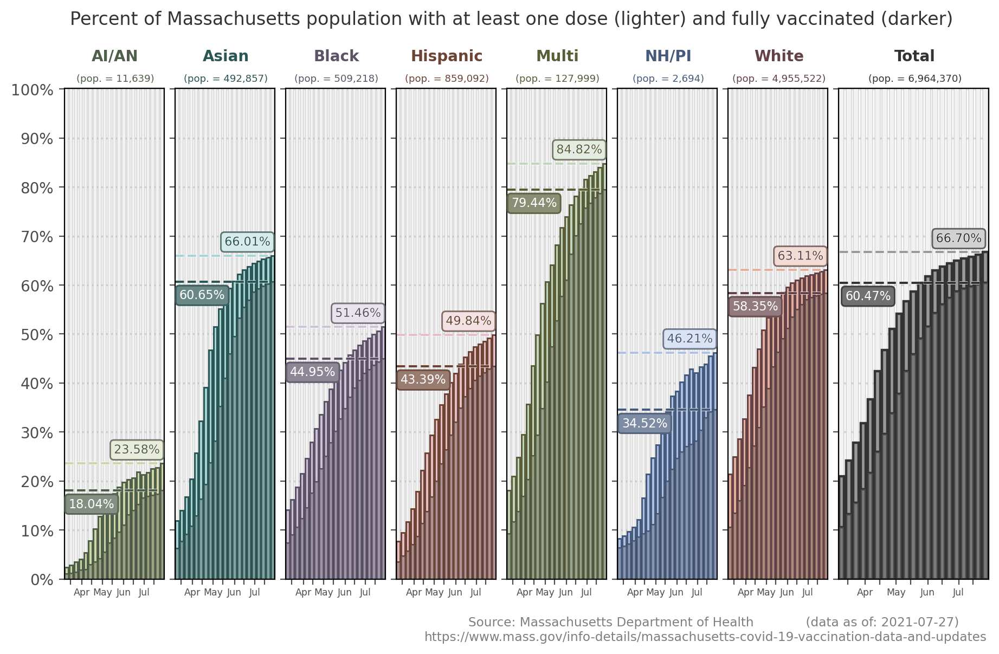

In [63]:
fig, ax = plt.subplots(1,vax_race_dfg['race'].nunique()-1,figsize=(11,6),dpi=200,sharey=True,sharex=True,
# fig, ax = plt.subplots(1,vax_race_dfg['race'].nunique()-1,figsize=(12,6),dpi=200,sharey=True,sharex=True,
                       gridspec_kw={'width_ratios':[1]*(vax_race_dfg['race'].nunique()-2)+[1.5]})
plt.subplots_adjust(wspace=0.1)

colors = ["#d0d5a9","#a6d5d3","#cec2d9","#e7bec3","#c2d5bc","#adc1e7","#e3b09d"] + ['.6']
color_d = ["#4f604a","#2a5655","#5d5367","#6d4434","#595e39","#465b7c","#644247"]+['.2']

for ai,ag in enumerate(['AI/AN', 'Asian', 'Black', 'Hispanic', 'Multi', 'NH/PI', 'White', 'Total']):
    vig = vax_race_dfg.loc[vax_race_dfg['race']==ag].copy()
    last_pad = 0
    if ag=='Total':
        last_pad=0.5
    ax[ai].bar([date_dict[i] for i in vig['date']], 1,
           fc='.95', ec='.2', width=5, linestyle='-', lw=0.1)
    ax[ai].bar([date_dict[i] for i in vig['date']],
               (vig['atleast_onedose']/vig['population']).tolist(),
               width=5, ec=color_d[ai], color=colors[ai], lw=1.1+last_pad)
    ax[ai].bar([date_dict[i] for i in vig['date']],
               (vig['fully_vaccinated']/vig['population']).tolist(),
               width=5, color='.2', lw=1.1+last_pad, ec='.2')
    ax[ai].bar([date_dict[i] for i in vig['date']],
               (vig['fully_vaccinated']/vig['population']).tolist(),
               width=5, ec=color_d[ai], alpha=0.7, color=colors[ai], lw=1.1+last_pad)

    vmax = (vig['atleast_onedose']/vig['population']).max()
    ax[ai].hlines(vmax, date_dict[vax_age_dfg['date'].min()]-2, date_dict[vax_age_dfg['date'].max()]-4,
                  lw=1.5, color=colors[ai], linestyle='--',
                  path_effects=[path_effects.Stroke(linewidth=2, foreground='w'),
                                path_effects.Normal()])
    props = dict(boxstyle='round', fc='w', alpha=0.999, ec='.5')
    ax[ai].text(date_dict[vax_age_dfg['date'].max()]-3.5, vmax+0.015, '%.2f%%'%(100*vmax),
                ha='right', va='bottom', fontsize=8,color='w', bbox=props)
    props = dict(boxstyle='round', fc=colors[ai], alpha=0.45, ec=color_d[ai])
    ax[ai].text(date_dict[vax_age_dfg['date'].max()]-3.5, vmax+0.015, '%.2f%%'%(100*vmax),
                ha='right', va='bottom', fontsize=8,color=color_d[ai],
                path_effects=[path_effects.Stroke(linewidth=0.5, foreground='w'),
                              path_effects.Normal()], bbox=props)

    vmax = (vig['fully_vaccinated']/vig['population']).max()
    ax[ai].hlines(vmax, date_dict[vax_age_dfg['date'].min()]-2, date_dict[vax_age_dfg['date'].max()]-4,
                  lw=1.5, color=color_d[ai], linestyle='--',
                  path_effects=[path_effects.Stroke(linewidth=2, foreground='w'),
                                path_effects.Normal()])
    props = dict(boxstyle='round', fc='w', alpha=0.999, ec='.5')
    ax[ai].text(date_dict[vax_age_dfg['date'].min()]+3.5, vmax-0.015, '%.2f%%'%(100*vmax),
                ha='left', va='top', fontsize=8,color='w', bbox=props)
    props = dict(boxstyle='round', fc=color_d[ai], alpha=0.7, ec=color_d[ai])
    ax[ai].text(date_dict[vax_age_dfg['date'].min()]+3.5, vmax-0.015, '%.2f%%'%(100*vmax),
                ha='left', va='top', fontsize=8,color='w',#color_d[ai],
                bbox=props)
#     vmax = (vig['atleast_onedose']/vig['population']).max()
#     ax[ai].hlines(vmax, date_dict[vax_age_dfg['date'].min()]-2, date_dict[vax_age_dfg['date'].max()]-4,
#                   lw=1.5, color=color_d[ai], linestyle='--',
#                   path_effects=[path_effects.Stroke(linewidth=2, foreground='w'),
#                                 path_effects.Normal()])
#     props = dict(boxstyle='round', fc='w', alpha=0.999, ec='.5')
#     ax[ai].text(date_dict[vax_age_dfg['date'].min()]+3, vmax+0.02, '%.2f%%'%(100*vmax),
#                 ha='left', va='bottom', fontsize='medium',color='w', bbox=props)
#     props = dict(boxstyle='round', fc=colors[ai], alpha=0.5, ec=color_d[ai])
#     ax[ai].text(date_dict[vax_age_dfg['date'].min()]+3, vmax+0.02, '%.2f%%'%(100*vmax),
#                 ha='left', va='bottom', fontsize='medium',color=color_d[ai],
#                 path_effects=[path_effects.Stroke(linewidth=0.5, foreground='w'),
#                               path_effects.Normal()], bbox=props)

    ax[ai].set_yticks(np.linspace(0,1,11))
    ax[ai].set_ylim(-0.001, 1.001)
    ax[ai].text(0.51, 1.05, ag, ha='center', va='bottom', transform=ax[ai].transAxes,
                fontsize='medium',color=color_d[ai], fontweight='bold')
    ax[ai].text(0.51, 1.01, "(pop. = {:,})".format(vig['population'].astype(int).unique()[0]),
                ha='center', va='bottom', transform=ax[ai].transAxes, fontsize=6.5,color=color_d[ai])
    
#     ax[ai].set_title(ag, color=color_d[ai],
#                      ha='center', fontsize='medium', fontweight='bold')

    
# dates_tt = [date_dict[i] for i in vig['date']]
# dates_ll = ['Mar\n9','Mar\n16','Mar\n23','Mar\n30','Apr\n6','Apr\n13','Apr\n20','Apr\n27','May\n4',
#             'May\n11','May\n18','May\n25','Jun\n1','Jun\n8','Jun\n15','Jun\n22','Jun\n29','Jul\n6','Jul\n13']
# dates_ll = [i if (ix-1)%3==0 else '' for ix,i in enumerate(dates_ll)]
dates_tt = [date_dict[i] for i in ['2021-03-15','2021-04-01','2021-04-15','2021-05-01','2021-05-15',
            '2021-06-01','2021-06-15','2021-07-01','2021-07-15','2021-08-01']]#,'2021-08-15','2021-09-01']
dates_ll = ['','Apr','','May','','Jun','','Jul','','Aug']#,'','Sep']

ax[0].yaxis.set_major_formatter(mtick.PercentFormatter(1.0,decimals=0))
plt.suptitle('Percent of Massachusetts population with at least'+\
             ' one dose (lighter) and fully vaccinated (darker)', color='.2', y=1.0)

for ai,a in enumerate(fig.axes):
    a.set_xticks(dates_tt)
    a.set_xticklabels(dates_ll, fontsize=6.25)
    a.tick_params(axis='x', which='major', pad=2)

    a.tick_params(labelcolor='.3', color='.3')
    a.grid(axis='y', linewidth=1.25,color='.5',alpha=0.25)
    a.set_xlim(date_dict[vax_age_dfg['date'].min()]-3,
               date_dict[vax_age_dfg['date'].max()]+3)

ax[-1].text(0.99,-0.075,'Source: Massachusetts Department of Health'+'             '+\
            '(data as of: %s)       \n'%vig['date'].max()+\
            'https://www.mass.gov/info-details/massachusetts-covid-19-vaccination-data-and-updates',
        color='.5',fontsize='small', va='top', ha='right', transform=ax[-1].transAxes)

plt.savefig('../figs/pngs/massachusetts_vaccine_race.png',dpi=425,bbox_inches='tight')
plt.savefig('../figs/pdfs/massachusetts_vaccine_race.pdf',bbox_inches='tight')

plt.show()

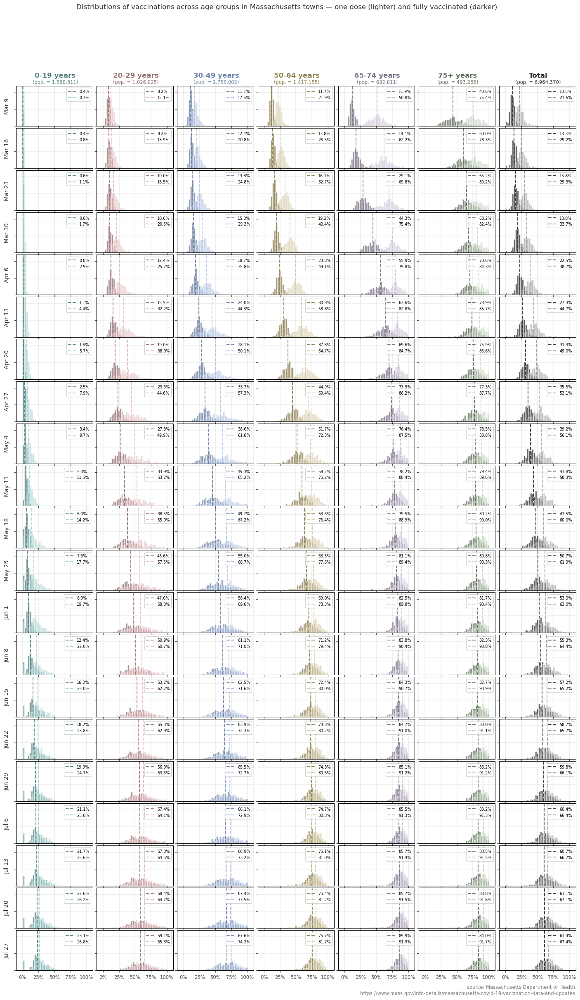

In [64]:
vax_age_df['atleast_onedose_percent_group'] = vax_age_df['atleast_onedose'].astype(float) / vax_age_df['population'].astype(float)
vax_age_df['fully_vaccinated_percent_group'] = vax_age_df['fully_vaccinated'].astype(float) / vax_age_df['population'].astype(float)

colors = ["#a6d5d3","#e7bbbe","#adc1e7","#d6cba4","#cec2d9","#c2d5bc"] + ['.6']
color_d = ["#588785","#9b7376","#7084a8","#8f8251","#7e7388","#606f5b"]+['.2']
w = 2.5; h = 1.35
ncols = vax_age_df['age_group'].nunique(); nrows = vax_age_df['date'].nunique()
tups = list(it.product(range(nrows), range(ncols)))
fig, ax = plt.subplots(nrows, ncols, figsize=(ncols*w,nrows*h), dpi=100, sharex=True, sharey=True)
plt.subplots_adjust(wspace=0.05,hspace=0.05)

dates_ll = ['Mar 9','Mar 16','Mar 23','Mar 30','Apr 6','Apr 13','Apr 20','Apr 27','May 4','May 11','May 18',
            'May 25','Jun 1','Jun 8','Jun 15','Jun 22','Jun 29','Jul 6','Jul 13','Jul 20','Jul 27','Aug 3']

ix = 0
for di,d in enumerate(vax_age_df['date'].unique()):
    for ai,ag in enumerate(vax_age_df['age_group'].unique()):
        vig = vax_age_dfg.loc[vax_age_dfg['age_group']==ag].copy()
        dfi = vax_age_df.loc[(vax_age_df['date']==d)&(vax_age_df['age_group']==ag)].copy()
        hist_i = dfi['fully_vaccinated_percent_group'].astype(float).values
        hist_i = hist_i[~np.isnan(hist_i)]
        mvi = np.median(hist_i)
        ax[tups[ix]].hist(hist_i, bins=np.linspace(0,1,40), color=color_d[ai], alpha=0.8, ec='.95')
        ax[tups[ix]].vlines(mvi, 0, 150, color=color_d[ai], alpha=0.9, linestyle='--',
                            label='%.1f%%'%(mvi*100))
        hist_i = dfi['atleast_onedose_percent_group'].values
        hist_i = hist_i[~np.isnan(hist_i)]
        mvi = np.median(hist_i)
        ax[tups[ix]].hist(hist_i, bins=np.linspace(0,1,40), color=colors[ai], alpha=0.6, ec='.95')
        ax[tups[ix]].vlines(mvi, 0, 150, color=colors[ai], alpha=0.9, linestyle='--',
                            label='%.1f%%'%(mvi*100))
        if di == 0:
            cat_ag = ag.replace(' Years',' years')
            ax[tups[ix]].text(0.51, 1.175, cat_ag, ha='center', va='bottom', transform=ax[tups[ix]].transAxes,
                        fontsize='large',color=color_d[ai], fontweight='bold')
            ax[tups[ix]].text(0.51, 1.025, "(pop. = {:,})".format(vig['population'].astype(int).unique()[0]),
                        ha='center', va='bottom', transform=ax[tups[ix]].transAxes,fontsize='small',color=color_d[ai])
            
        if ai == 0:
            ax[tups[ix]].set_ylabel(dates_ll[di], color='.2')

        ix += 1
        

dates_tt = [date_dict[i] for i in vig['date']]

plt.suptitle('Distributions of vaccinations across age groups in Massachusetts towns —'+\
             ' one dose (lighter) and fully vaccinated (darker)', color='.2', y=0.95)

for ai,a in enumerate(fig.axes):
    a.set_xticks([0,0.25,0.5,0.75,1])
    a.set_xlim(-0.1,1.1)
    a.xaxis.set_major_formatter(mtick.PercentFormatter(1.0,decimals=0))
    a.tick_params(axis='x', labelsize='small')
    a.tick_params(labelcolor='.3', color='.3')
    a.legend(fontsize='x-small')
    a.grid(linewidth=1.25,color='.75',alpha=0.25)
    a.set_ylim(0, 120)
    a.set_yticks([0, 50, 100])
    a.set_yticklabels(['','',''])
    
ax[tups[-1]].text(0.99,-0.35,'source: Massachusetts Department of Health\n'+\
        'https://www.mass.gov/info-details/massachusetts-covid-19-vaccination-data-and-updates',
        color='.5',fontsize='small', va='top', ha='right', transform=ax[tups[-1]].transAxes)

plt.savefig('../figs/pngs/massachusetts_vaccine_age_dists.png',dpi=425,bbox_inches='tight')
plt.savefig('../figs/pdfs/massachusetts_vaccine_age_dists.pdf',bbox_inches='tight')

plt.show()

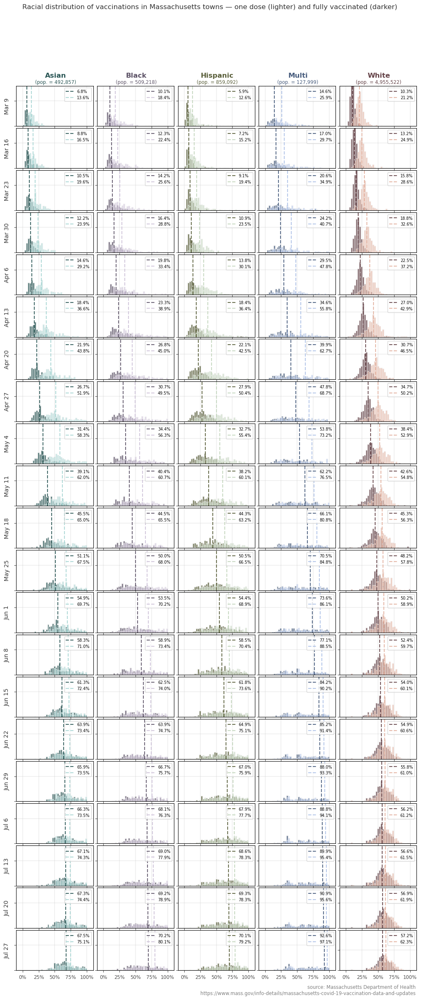

In [65]:
# vax_age_dfx = vax_age_dfx.loc[vax_age_dfx['city']!='Unspecified'].copy()
vax_race_dfx['atleast_onedose_percent_group'] = vax_race_dfx['atleast_onedose'] / vax_race_dfx['population']
vax_race_dfx['fully_vaccinated_percent_group'] = vax_race_dfx['fully_vaccinated'] / vax_race_dfx['population']

colors = ["#a6d5d3","#cec2d9","#c2d5bc","#adc1e7","#e3b09d"] + ['.6']
color_d = ["#2a5655","#5d5367","#595e39","#465b7c","#644247"]+['.2']
w = 2.5; h = 1.35
ncols = vax_race_dfx['race'].nunique()-4; nrows = vax_race_dfx['date'].nunique()
tups = list(it.product(range(nrows), range(ncols)))
fig, ax = plt.subplots(nrows, ncols, figsize=(ncols*w,nrows*h), dpi=100, sharex=True, sharey=True)
plt.subplots_adjust(wspace=0.05,hspace=0.05)

ix = 0
for di,d in enumerate(vax_race_dfx['date'].unique()):
    for ai,ag in enumerate(['Asian', 'Black', 'Hispanic', 'Multi', 'White']):#, 'Total']):
        vig = vax_race_dfg.loc[vax_race_dfg['race']==ag].copy()
        dfi = vax_race_dfx.loc[(vax_race_dfx['date']==d)&(vax_race_dfx['race']==ag)].copy()
        hist_i = dfi['fully_vaccinated_percent_group'].values
        hist_i = hist_i[~np.isnan(hist_i)]
        ax[tups[ix]].hist(hist_i, bins=np.linspace(0,1,40), color=color_d[ai], alpha=0.8, ec='.95')
        mvi = np.median(hist_i)
        ax[tups[ix]].vlines(mvi, 0, 150, color=color_d[ai], alpha=0.9, linestyle='--',
                            label='%.1f%%'%(mvi*100))
        hist_i = dfi['atleast_onedose_percent_group'].values
        hist_i = hist_i[~np.isnan(hist_i)]
        ax[tups[ix]].hist(hist_i, bins=np.linspace(0,1,40), color=colors[ai], alpha=0.6, ec='.95')
        mvi = np.median(hist_i)
        ax[tups[ix]].vlines(mvi, 0, 150, color=colors[ai], alpha=0.9, linestyle='--',
                            label='%.1f%%'%(mvi*100))
        if di == 0:
            cat_ag = ag.replace(' Years',' years')
            ax[tups[ix]].text(0.51, 1.175, cat_ag, ha='center', va='bottom',
                              transform=ax[tups[ix]].transAxes,
                        fontsize='large',color=color_d[ai], fontweight='bold')
            ax[tups[ix]].text(0.51, 1.025, "(pop. = {:,})".format(vig['population'].astype(int).unique()[0]),
                        ha='center', va='bottom', transform=ax[tups[ix]].transAxes,
                              fontsize='small',color=color_d[ai])
            
        if ai == 0:
            ax[tups[ix]].set_ylabel(dates_ll[di], color='.2')

        ix += 1
        

dates_tt = [date_dict[i] for i in vig['date']]

plt.suptitle('Racial distribution of vaccinations in Massachusetts towns —'+\
             ' one dose (lighter) and fully vaccinated (darker)', color='.2', y=0.95)

for ai,a in enumerate(fig.axes):
    a.set_xticks([0,0.25,0.5,0.75,1])
    a.set_xlim(-0.1,1.1)
    a.xaxis.set_major_formatter(mtick.PercentFormatter(1.0,decimals=0))
    a.tick_params(axis='x', labelsize='small')
    a.tick_params(labelcolor='.3', color='.3')
    a.legend(fontsize='x-small')
    a.grid(linewidth=1.25,color='.75',alpha=0.25)
    a.set_ylim(0, 80)
    a.set_yticks([0, 50, 100])
    a.set_yticklabels(['','',''])
    
ax[tups[-1]].text(0.99,-0.35,'source: Massachusetts Department of Health\n'+\
        'https://www.mass.gov/info-details/massachusetts-covid-19-vaccination-data-and-updates',
        color='.5',fontsize='small', va='top', ha='right', transform=ax[tups[-1]].transAxes)

plt.savefig('../figs/pngs/massachusetts_vaccine_race_dists.png',dpi=425,bbox_inches='tight')
plt.savefig('../figs/pdfs/massachusetts_vaccine_race_dists.pdf',bbox_inches='tight')

plt.show()

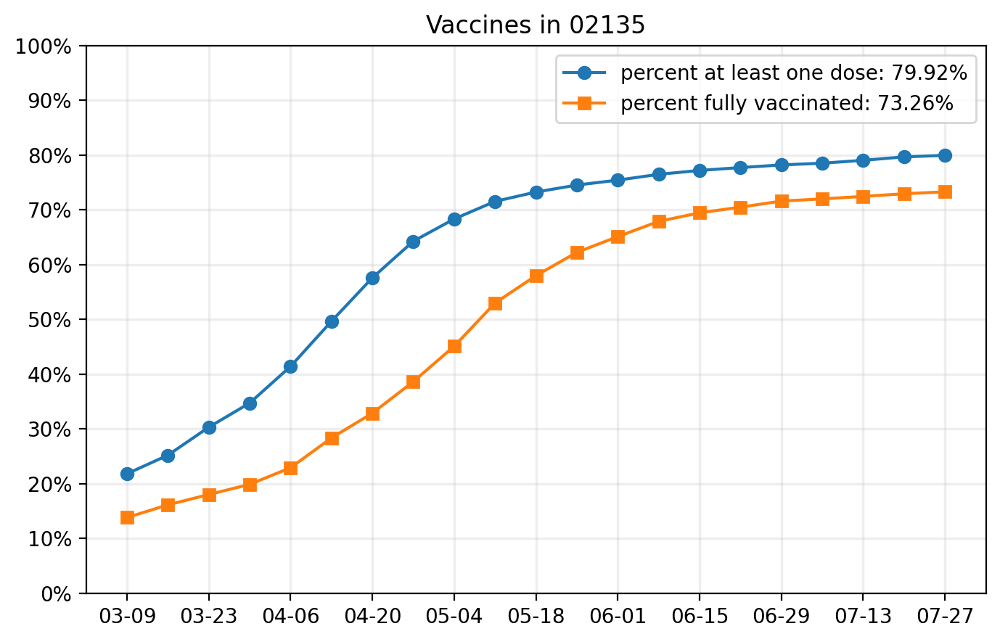

In [66]:
vaccine_zip_age_data = mass_data.worksheet('vaccine_zip_age')
vax_age_dfx = pd.DataFrame(vaccine_zip_age_data.get_all_records(default_blank=np.nan))

home_df = vax_age_dfx.loc[vax_age_dfx['zipcode']==2135].copy()
totpop = 42780
fig, ax = plt.subplots(1,1,figsize=(8,5),dpi=200)
ax.plot([date_dict[i] for i in home_df['date']],
        home_df[[i for i in home_df.columns if 'one' in i]].sum(axis=1)/totpop,
        marker='o',label='percent at least one dose: %.2f%%'%((home_df[[i for i in home_df.columns if 'one' in i]].sum(axis=1)/totpop).values[-1]*100))
ax.plot([date_dict[i] for i in home_df['date']],
        home_df[[i for i in home_df.columns if 'fully' in i]].sum(axis=1)/totpop,
        marker='s',
        label='percent fully vaccinated: %.2f%%'%((home_df[[i for i in home_df.columns if 'fully' in i]].sum(axis=1)/totpop).values[-1]*100))
ax.set_ylim(0,1)
ax.set_yticks(np.linspace(0,1,11))
ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0,decimals=0))
ax.set_xticks([date_dict[i] for i in home_df['date'].values[::2]])
ax.set_xticklabels([i[5:] for i in home_df['date'].values[::2]])
ax.grid(lw=1.25,alpha=0.25,color='.75')
ax.set_title('Vaccines in 02135')

ax.legend()

plt.savefig('../figs/pngs/vaccine_02135.png',dpi=425,bbox_inches='tight')
plt.show()

In [67]:
zc0 = 2445
zc1 = 2446
zip0 = 20774
zip1 = 29311

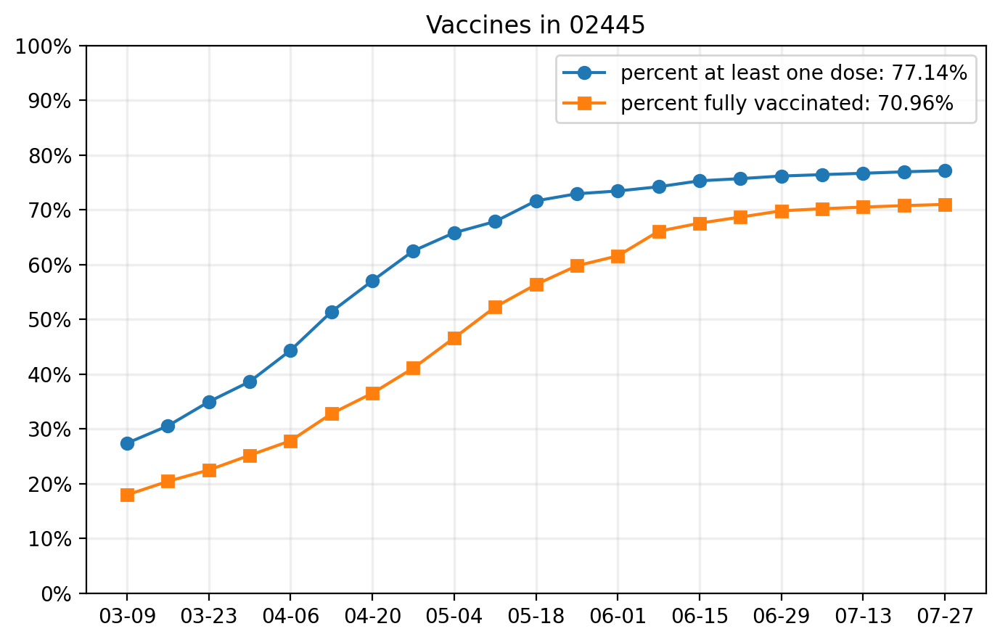

In [68]:
vaccine_zip_age_data = mass_data.worksheet('vaccine_zip_age')
vax_age_dfx = pd.DataFrame(vaccine_zip_age_data.get_all_records(default_blank=np.nan))

home_df = vax_age_dfx.loc[vax_age_dfx['zipcode']==zc0].copy()
totpop = zip0
fig, ax = plt.subplots(1,1,figsize=(8,5),dpi=200)
ax.plot([date_dict[i] for i in home_df['date']],
        home_df[[i for i in home_df.columns if 'one' in i]].sum(axis=1)/totpop,
        marker='o',label='percent at least one dose: %.2f%%'%((home_df[[i for i in home_df.columns if 'one' in i]].sum(axis=1)/totpop).values[-1]*100))
ax.plot([date_dict[i] for i in home_df['date']],
        home_df[[i for i in home_df.columns if 'fully' in i]].sum(axis=1)/totpop,
        marker='s',
        label='percent fully vaccinated: %.2f%%'%((home_df[[i for i in home_df.columns if 'fully' in i]].sum(axis=1)/totpop).values[-1]*100))
ax.set_ylim(0,1)
ax.set_yticks(np.linspace(0,1,11))
ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0,decimals=0))
ax.set_xticks([date_dict[i] for i in home_df['date'].values[::2]])
ax.set_xticklabels([i[5:] for i in home_df['date'].values[::2]])
ax.grid(lw=1.25,alpha=0.25,color='.75')
ax.set_title('Vaccines in 0%i'%zc0)

ax.legend()
plt.savefig('../figs/pngs/vaccine_02445.png',dpi=425,bbox_inches='tight')
plt.show()

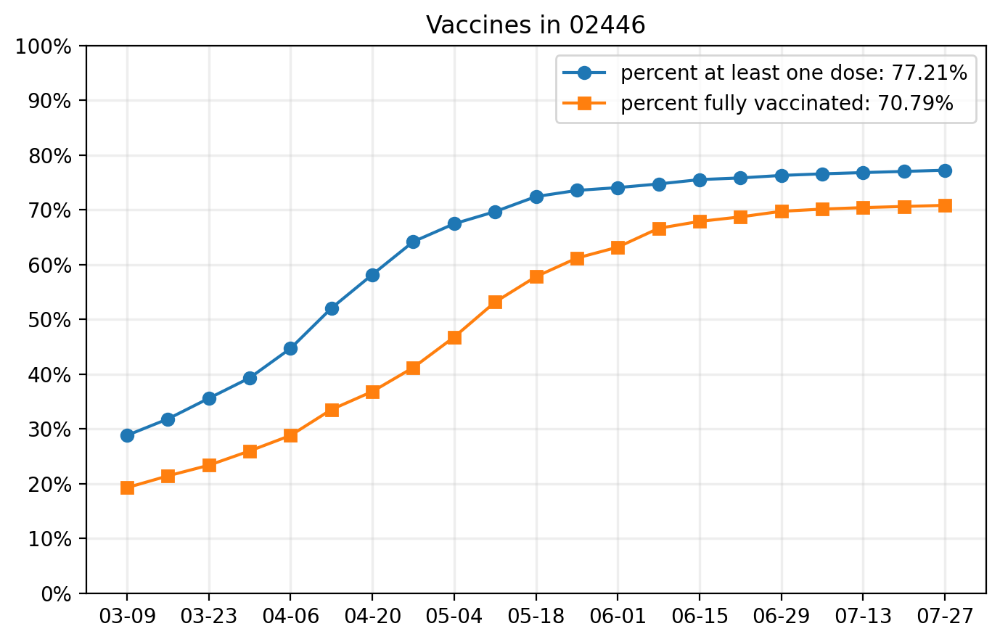

In [69]:
vaccine_zip_age_data = mass_data.worksheet('vaccine_zip_age')
vax_age_dfx = pd.DataFrame(vaccine_zip_age_data.get_all_records(default_blank=np.nan))

home_df = vax_age_dfx.loc[vax_age_dfx['zipcode']==zc1].copy()
totpop = zip1
fig, ax = plt.subplots(1,1,figsize=(8,5),dpi=200)
ax.plot([date_dict[i] for i in home_df['date']],
        home_df[[i for i in home_df.columns if 'one' in i]].sum(axis=1)/totpop,
        marker='o',label='percent at least one dose: %.2f%%'%((home_df[[i for i in home_df.columns if 'one' in i]].sum(axis=1)/totpop).values[-1]*100))
ax.plot([date_dict[i] for i in home_df['date']],
        home_df[[i for i in home_df.columns if 'fully' in i]].sum(axis=1)/totpop,
        marker='s',
        label='percent fully vaccinated: %.2f%%'%((home_df[[i for i in home_df.columns if 'fully' in i]].sum(axis=1)/totpop).values[-1]*100))
ax.set_ylim(0,1)
ax.set_yticks(np.linspace(0,1,11))
ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0,decimals=0))
ax.set_xticks([date_dict[i] for i in home_df['date'].values[::2]])
ax.set_xticklabels([i[5:] for i in home_df['date'].values[::2]])
ax.grid(lw=1.25,alpha=0.25,color='.75')
ax.set_title('Vaccines in 0%i'%zc1)

ax.legend()
plt.savefig('../figs/pngs/vaccine_02446.png',dpi=425,bbox_inches='tight')
plt.show()

In [70]:
from scipy.stats import entropy

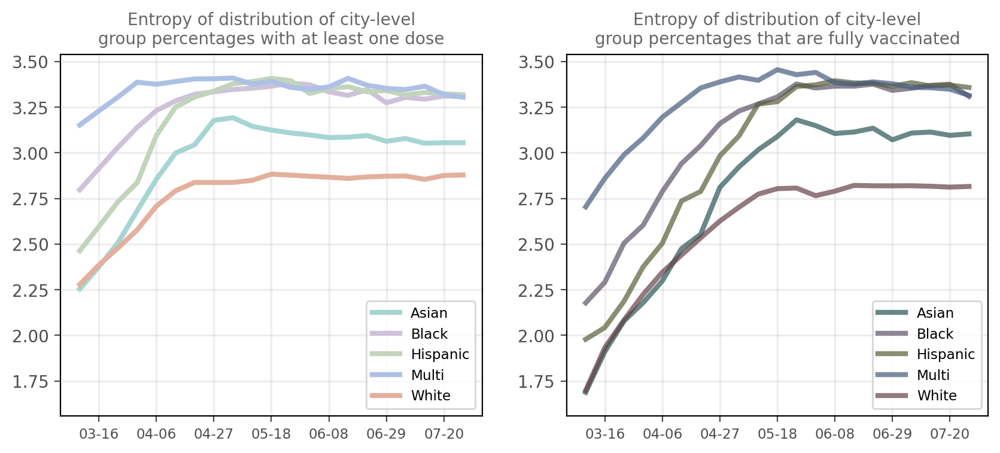

In [71]:
vax_race_dfx['atleast_onedose_percent_group'] = vax_race_dfx['atleast_onedose'] / vax_race_dfx['population']
vax_race_dfx['fully_vaccinated_percent_group'] = vax_race_dfx['fully_vaccinated'] / vax_race_dfx['population']
fig, ax = plt.subplots(1,2,figsize=(10,4),dpi=200)

colors = ["#a6d5d3","#cec2d9","#c2d5bc","#adc1e7","#e3b09d"] + ['.6']
color_d = ["#2a5655","#5d5367","#595e39","#465b7c","#644247"]+['.2']

out_ent = []
for di,d in enumerate(vax_race_dfx['date'].unique()):
    for ai,ag in enumerate(['Asian', 'Black', 'Hispanic', 'Multi', 'White']):#, 'Total']):
        vig = vax_race_dfg.loc[vax_race_dfg['race']==ag].copy()
        dfi = vax_race_dfx.loc[(vax_race_dfx['date']==d)&(vax_race_dfx['race']==ag)].copy()
        hist_i = dfi['atleast_onedose_percent_group'].values
        hist_i = hist_i[~np.isnan(hist_i)]
        h_i, spacing_i = np.histogram(hist_i, bins=np.linspace(0,1,40))
        out_ent.append(pd.DataFrame({'date':[d],'race':[ag],'entropy':[entropy(h_i/sum(h_i))]}))

ent_df = pd.concat(out_ent).reset_index().iloc[:,1:]
for ai,ag in enumerate(['Asian', 'Black', 'Hispanic', 'Multi', 'White']):#, 'Total']):
    ent_dfi = ent_df.loc[ent_df['race']==ag].copy()
    
    ax[0].plot([date_dict[i] for i in ent_dfi['date']],ent_dfi['entropy'], color=colors[ai], label=ag, lw=lw)
#     ax[0].plot([date_dict[i] for i in ent_dfi['date']],ent_dfi['entropy'], color=color_d[ai], lw=lw*0.25)

out_ent = []
for di,d in enumerate(vax_race_dfx['date'].unique()):
    for ai,ag in enumerate(['Asian', 'Black', 'Hispanic', 'Multi', 'White']):#, 'Total']):
        vig = vax_race_dfg.loc[vax_race_dfg['race']==ag].copy()
        dfi = vax_race_dfx.loc[(vax_race_dfx['date']==d)&(vax_race_dfx['race']==ag)].copy()
        hist_i = dfi['fully_vaccinated_percent_group'].values
        hist_i = hist_i[~np.isnan(hist_i)]
        h_i, spacing_i = np.histogram(hist_i, bins=np.linspace(0,1,40))
        out_ent.append(pd.DataFrame({'date':[d],'race':[ag],'entropy':[entropy(h_i/sum(h_i))]}))

ent_df = pd.concat(out_ent).reset_index().iloc[:,1:]
for ai,ag in enumerate(['Asian', 'Black', 'Hispanic', 'Multi', 'White']):#, 'Total']):
    ent_dfi = ent_df.loc[ent_df['race']==ag].copy()
    ax[1].plot([date_dict[i] for i in ent_dfi['date']],ent_dfi['entropy'], color=color_d[ai], label=ag, lw=lw,alpha=0.7)

    
ax[0].set_title('Entropy of distribution of city-level\ngroup percentages with at least one dose',
                fontsize='medium',color='.4')
ax[1].set_title('Entropy of distribution of city-level\ngroup percentages that are fully vaccinated',
                fontsize='medium',color='.4')
for a in fig.axes:
    a.set_xticks([date_dict[i] for i in ent_dfi['date'].values[1::3]])
    a.set_xticklabels([i[5:] for i in ent_dfi['date'].values[1::3]], fontsize='small')
    a.grid(lw=1.25,alpha=0.25,color='.75')
    a.set_ylim(1.56,3.54)
    a.tick_params(labelcolor='.3', color='.3')
    a.legend(ncol=1,fontsize='small',loc=4)
    
plt.savefig('../figs/pngs/entropy_racegroups.png',dpi=425,bbox_inches='tight')
plt.savefig('../figs/pdfs/entropy_racegroups.pdf',dpi=425,bbox_inches='tight')

plt.show()

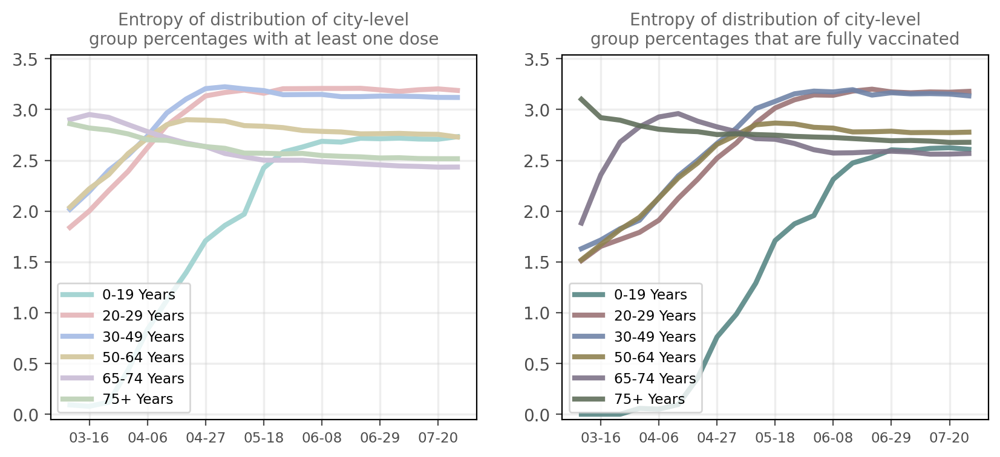

In [72]:
fig, ax = plt.subplots(1,2,figsize=(10,4),dpi=200)

colors = ["#a6d5d3","#e7bbbe","#adc1e7","#d6cba4","#cec2d9","#c2d5bc"] + ['.6']
color_d = ["#588785","#9b7376","#7084a8","#8f8251","#7e7388","#606f5b"]+['.2']

out_ent = []
ix = 0
for di,d in enumerate(vax_age_df['date'].unique()):
    for ai,ag in enumerate(vax_age_df['age_group'].unique()):
        vig = vax_age_dfg.loc[vax_age_dfg['age_group']==ag].copy()
        dfi = vax_age_df.loc[(vax_age_df['date']==d)&(vax_age_df['age_group']==ag)].copy()
        hist_i = dfi['atleast_onedose_percent_group'].values
        hist_i = hist_i[~np.isnan(hist_i)]
        h_i, spacing_i = np.histogram(hist_i, bins=np.linspace(0,1,40))
        out_ent.append(pd.DataFrame({'date':[d],'age':[ag],'entropy':[entropy(h_i/sum(h_i))]}))

ent_df = pd.concat(out_ent).reset_index().iloc[:,1:]
for ai,ag in enumerate(vax_age_df['age_group'].unique()[:-1]):
    ent_dfi = ent_df.loc[ent_df['age']==ag].copy()
    
    ax[0].plot([date_dict[i] for i in ent_dfi['date']],ent_dfi['entropy'], color=colors[ai], label=ag, lw=lw)
#     ax[0].plot([date_dict[i] for i in ent_dfi['date']],ent_dfi['entropy'], color=color_d[ai], lw=lw*0.25)

out_ent = []
for di,d in enumerate(vax_age_df['date'].unique()):
    for ai,ag in enumerate(vax_age_df['age_group'].unique()):
        vig = vax_age_dfg.loc[vax_age_dfg['age_group']==ag].copy()
        dfi = vax_age_df.loc[(vax_age_df['date']==d)&(vax_age_df['age_group']==ag)].copy()
        hist_i = dfi['fully_vaccinated_percent_group'].values
        hist_i = hist_i[~np.isnan(hist_i)]
        h_i, spacing_i = np.histogram(hist_i, bins=np.linspace(0,1,40))
        out_ent.append(pd.DataFrame({'date':[d],'age':[ag],'entropy':[entropy(h_i/sum(h_i))]}))

ent_df = pd.concat(out_ent).reset_index().iloc[:,1:]
for ai,ag in enumerate(vax_age_df['age_group'].unique()[:-1]):
    ent_dfi = ent_df.loc[ent_df['age']==ag].copy()
    
    ax[1].plot([date_dict[i] for i in ent_dfi['date']],ent_dfi['entropy'], color=color_d[ai], label=ag, lw=lw,alpha=0.9)
#     ax[1].plot([date_dict[i] for i in ent_dfi['date']],ent_dfi['entropy'], color=color_d[ai], lw=lw*0.25)

    
ax[0].set_title('Entropy of distribution of city-level\ngroup percentages with at least one dose',
                fontsize='medium',color='.4')
ax[1].set_title('Entropy of distribution of city-level\ngroup percentages that are fully vaccinated',
                fontsize='medium',color='.4')
for a in fig.axes:
    a.set_xticks([date_dict[i] for i in ent_dfi['date'].values[1::3]])
    a.set_xticklabels([i[5:] for i in ent_dfi['date'].values[1::3]], fontsize='small')
    a.grid(lw=1.25,alpha=0.25,color='.75')
    a.set_ylim(-0.05,3.54)
    a.legend(ncol=1,fontsize='small',loc=3)
    a.tick_params(labelcolor='.3', color='.3')

plt.savefig('../figs/pngs/entropy_agegroups.png',dpi=425,bbox_inches='tight')
plt.savefig('../figs/pdfs/entropy_agegroups.pdf',dpi=425,bbox_inches='tight')

plt.show()

# all city data

In [73]:
ztc = gpd.read_file('/Users/brennan/Desktop/code/covid/americas/data/ireland/USA_Zip/')
ztc['ZCTA5CE10'] = ztc['ZCTA5CE10'].astype(int)
ztc = ztc.rename(columns={'ZCTA5CE10':'zipcode'})

mass_data = client.open("COVID-data_Massachusetts")

In [74]:
vaccine_zip_age_data = mass_data.worksheet('vaccine_zip_age')
vax_age_zip = pd.DataFrame(vaccine_zip_age_data.get_all_records(default_blank=np.nan))
vax_age_zip = vax_age_zip.loc[vax_age_zip['zipcode']!='Unspecified']
vax_age_zip['zipcode'] = vax_age_zip['zipcode'].astype(int)

zip_dat = pd.read_csv('/Users/brennan/Desktop/code/covid/americas/data/voltron-output_zip_codes_2018_5yr.csv.gz')
zip_dat = zip_dat.loc[zip_dat['geo_id'].isin(vax_age_zip['zipcode'].unique())].copy()
zip_dat = zip_dat.rename(columns={'geo_id':'zipcode','total_pop':'population'})[['zipcode','population']].copy()
vax_age_zip = vax_age_zip.merge(zip_dat,how='left',on='zipcode')
ztc_curr = ztc.loc[ztc['zipcode'].isin(vax_age_zip['zipcode'].unique())].copy()

vax_age_zip['one_dose'] = vax_age_zip[['one_dose_12-15', 'one_dose_16-19', 'one_dose_20-29', 'one_dose_30-39',
       'one_dose_40-49', 'one_dose_50-59', 'one_dose_60-64', 'one_dose_65-69',
       'one_dose_70-74', 'one_dose_75-79', 'one_dose_80+']].sum(axis=1)

vax_age_zip['fully'] = vax_age_zip[['fully_12-15','fully_16-19',
       'fully_20-29', 'fully_30-39', 'fully_40-49', 'fully_50-59',
       'fully_60-64', 'fully_65-69', 'fully_70-74', 'fully_75-79', 'fully_80+']].sum(axis=1)

vax_age_zip['one_dose_pct'] = vax_age_zip['one_dose'] / vax_age_zip['population']
vax_age_zip['fully_pct'] = vax_age_zip['fully'] / vax_age_zip['population']

ztc_curr = ztc_curr.merge(vax_age_zip.loc[vax_age_zip['date']==vax_age_zip['date'].max()
                                         ][['zipcode','one_dose_pct','fully_pct']],how='left',on='zipcode')

ztc_curr['zipcode'] = ("0"+ztc_curr['zipcode'].astype(str).str[:]).str[-5:]
xvs = [i.x for i in list(ztc_curr.centroid)]
yvs = [i.y for i in list(ztc_curr.centroid)]

<ipython-input-74-d31c23361ea7>:27: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  xvs = [i.x for i in list(ztc_curr.centroid)]
<ipython-input-74-d31c23361ea7>:28: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  yvs = [i.y for i in list(ztc_curr.centroid)]


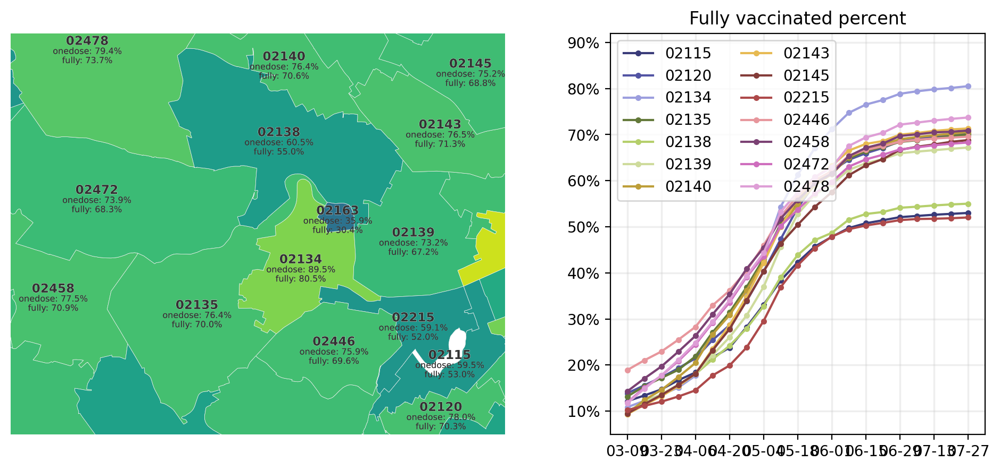

In [75]:
fig, ax = plt.subplots(1,2,figsize=(12,5),dpi=200,gridspec_kw={'width_ratios':[1.4,1]})

zoi = []
ztc_curr.loc[ztc_curr['zipcode']=='02163','fully_pct'] = 0.375
ztc_curr.plot(ax=ax[0],column='fully_pct',vmin=0,vmax=1,ec='.95',lw=0.25)

for i in range(len(xvs)):
    if xvs[i] > -71.1975 and xvs[i] < -71.08275:
        if yvs[i] > 42.3275 and yvs[i] < 42.3985:
            tmp = vax_age_zip.loc[vax_age_zip['zipcode']==(int(ztc_curr['zipcode'].values[i]))].copy()
            of_vals = (tmp['one_dose_pct'].values[-1]*100,tmp['fully_pct'].values[-1]*100)
            ax[0].text(xvs[i],yvs[i],ztc_curr['zipcode'].values[i],
                       ha='center',va='bottom',fontsize='small', fontweight='bold',
                       path_effects=[path_effects.Stroke(linewidth=0.25, foreground='w'),
                              path_effects.Normal()], color='.2')
            ax[0].text(xvs[i],yvs[i],"onedose: %.1f%%\nfully: %.1f%%"%of_vals,
                       ha='center',va='top',fontsize='xx-small',
                       path_effects=[path_effects.Stroke(linewidth=0.05, foreground='w'),
                              path_effects.Normal()], color='.2')
            zoi.append(tmp['zipcode'].unique()[0])

ax[0].set_axis_off()
ax[0].set_xlim(-71.1975,-71.08155)
ax[0].set_ylim(42.3285,42.3985)

zoi = [i for i in sorted(zoi) if i!=2163]
cols = plt.cm.tab20b(np.linspace(0,1,len(zoi)))
for zi,z in enumerate(zoi):
    dfzi = vax_age_zip.loc[vax_age_zip['zipcode']==z].copy()
    ax[1].plot([date_dict[i] for i in dfzi['date']], dfzi['fully_pct'].values,
               marker='.',label="0"+str(z), color=cols[zi])

ax[1].legend(ncol=2,loc=2)
ax[1].set_yticks(np.linspace(0,1,11))
ax[1].set_ylim(0.05,0.92)
ax[1].yaxis.set_major_formatter(mtick.PercentFormatter(1.0,decimals=0))
ax[1].set_xticks([date_dict[i] for i in dfzi['date'].values[::4]])
ax[1].set_xticklabels([i[5:] for i in dfzi['date'].values[::4]])
ax[1].grid(lw=1.25,alpha=0.25,color='.75')
ax[1].set_title('Fully vaccinated percent')

plt.savefig('../figs/pngs/neighborhood_percent.png',dpi=425,bbox_inches='tight')
# plt.savefig('../figs/pdfs/neighborhood_percent.pdf',bbox_inches='tight')
plt.show()

2020-08-26 	 2021-07-30 10:13:50.386518
2020-09-02 	 2021-07-30 10:13:50.388697
2020-09-09 	 2021-07-30 10:14:07.642040
2020-09-16 	 2021-07-30 10:14:23.706434
2020-09-23 	 2021-07-30 10:14:39.221125
2020-09-30 	 2021-07-30 10:14:55.434484
2020-10-07 	 2021-07-30 10:15:11.033664
2020-10-14 	 2021-07-30 10:15:27.133838
2020-10-22 	 2021-07-30 10:15:43.462554
2020-10-29 	 2021-07-30 10:15:59.452246
2020-11-06 	 2021-07-30 10:16:17.217838
2020-11-12 	 2021-07-30 10:16:32.894700
2020-11-19 	 2021-07-30 10:16:48.406264
2020-11-27 	 2021-07-30 10:17:05.475025
2020-12-03 	 2021-07-30 10:17:21.949761
2020-12-10 	 2021-07-30 10:17:39.860904
2020-12-17 	 2021-07-30 10:17:58.475866
2020-12-24 	 2021-07-30 10:18:16.218253
2020-12-31 	 2021-07-30 10:18:32.101536
2021-01-07 	 2021-07-30 10:18:46.268812
2021-01-14 	 2021-07-30 10:19:00.804014
2021-01-21 	 2021-07-30 10:19:18.444236
2021-01-28 	 2021-07-30 10:19:34.501872
2021-02-04 	 2021-07-30 10:19:49.657041
2021-02-11 	 2021-07-30 10:20:05.594128


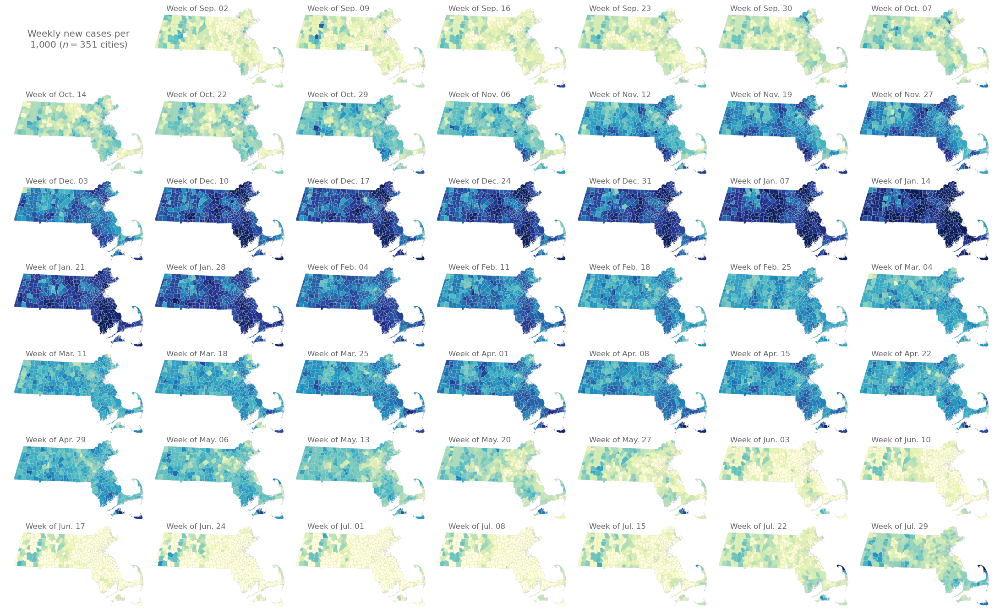

In [76]:
dat_shp = gpd.read_file('../../covid19-mobility/data/towns/').rename(columns={'TOWN':'city'})
city_df['city'] = city_df['city'].str.upper()

w = 4.0; h = 2.5
ncols = 7; nrows = 7
tups = list(it.product(range(nrows), range(ncols)))
fig, ax = plt.subplots(nrows, ncols, figsize=(ncols*w,nrows*h), dpi=100)#, sharex=True)
plt.subplots_adjust(wspace=-0.05,hspace=-0.01)

for di, d in enumerate(list(city_df['date'].unique())[-int(nrows*ncols):]):
    print(d, '\t', dt.datetime.now())
    aa = ax[tups[di]]
    if di != 0:
        aa = ax[tups[di]]
        dat_shp_i = dat_shp.copy()
        dat_shp_i = dat_shp_i.merge(city_df.loc[city_df['date']==d][['city','new_cases_town','population']],
                                    how='left', on='city')
        dat_shp_i['new_cases_town'] = np.nan_to_num(dat_shp_i['new_cases_town'])
        dat_shp_i['new_cases_town'] = np.log((dat_shp_i['new_cases_town']+1) / (dat_shp_i['population']+1) * 1000)
        new_means = {}
        for ci in dat_shp_i['city'].unique():
            row_i = dat_shp_i.loc[dat_shp_i['city']==ci].copy()
            inp, res = dat_shp_i.sindex.query_bulk(row_i.geometry, predicate='intersects')
            neighboring_i = dat_shp_i['city'].values[res]
            new_mean_i = np.mean([dat_shp_i.loc[dat_shp_i['city'].isin(neighboring_i)]['new_cases_town'].mean(),
                                  row_i['new_cases_town'].mean()])
            new_means[ci] = new_mean_i

        dat_shp_i['new_cases_town'] = [new_means[i] for i in dat_shp_i['city']]
        dat_shp_i.loc[dat_shp_i['population']<1200,'new_cases_town'] = dat_shp_i['new_cases_town'].median()

        dat_shp_i.plot(ax=aa, column='new_cases_town', ec='.8', lw=0.2, cmap='YlGnBu', vmin=-1.8, vmax=1.8)
#         dat_shp_i.plot(ax=aa, column='new_cases_town', ec='.8', lw=0.2, cmap='RdPu', vmin=-2.0, vmax=2.0)
        d = "Week of "+month_dict[d[5:7]]+'. %s'%(d[8:])
        aa.text(0.125, 0.95, d, ha='left', va='center',
                transform=aa.transAxes, color='.4', fontsize='large')

    else:
        aa.text(0.5, 0.6, 'Weekly new cases per\n1,000 ($n=%i$ cities)'%city_df['city'].nunique(), color='.4',
                ha='center', va='center', transform=aa.transAxes, fontsize='x-large')

    aa.set_axis_off()

for dr in range(len(tups)-(di+1)):
    ax[tups[di + 1 + dr]].set_axis_off()

plt.savefig('../figs/pngs/ma_cities_casecounts_per1000_over_time.png',dpi=425,bbox_inches='tight')

plt.show()

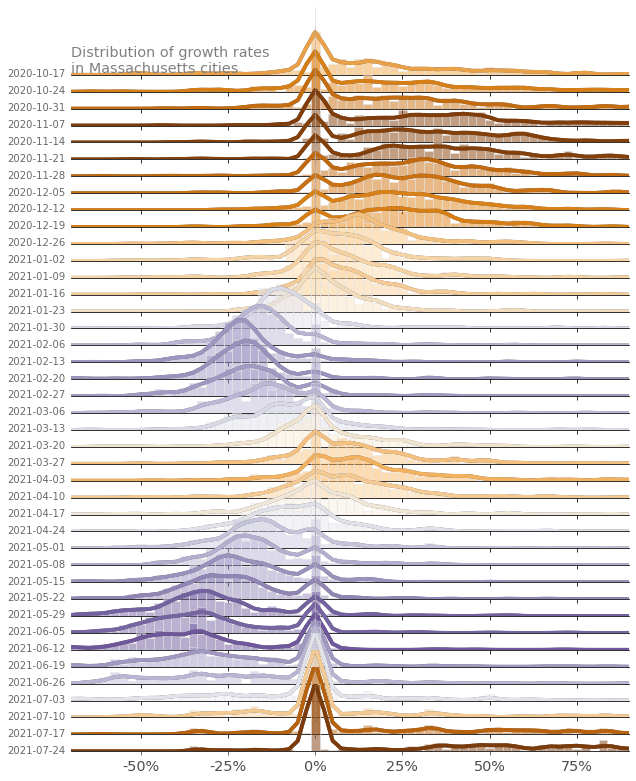

2020-10-10 	 2021-07-30 10:27:24.584322
2020-10-17 	 2021-07-30 10:27:24.584899
2020-10-24 	 2021-07-30 10:27:41.654135
2020-10-31 	 2021-07-30 10:27:56.830421
2020-11-07 	 2021-07-30 10:28:11.621102
2020-11-14 	 2021-07-30 10:28:26.146816
2020-11-21 	 2021-07-30 10:28:40.119916
2020-11-28 	 2021-07-30 10:28:54.216263
2020-12-05 	 2021-07-30 10:29:08.398361
2020-12-12 	 2021-07-30 10:29:22.453281
2020-12-19 	 2021-07-30 10:29:36.601898
2020-12-26 	 2021-07-30 10:29:50.564561
2021-01-02 	 2021-07-30 10:30:04.797741
2021-01-09 	 2021-07-30 10:30:19.506915
2021-01-16 	 2021-07-30 10:30:34.325842
2021-01-23 	 2021-07-30 10:30:49.150778
2021-01-30 	 2021-07-30 10:31:03.764458
2021-02-06 	 2021-07-30 10:31:18.565029
2021-02-13 	 2021-07-30 10:31:33.351911
2021-02-20 	 2021-07-30 10:31:48.191481
2021-02-27 	 2021-07-30 10:32:03.256094
2021-03-06 	 2021-07-30 10:32:18.156116
2021-03-13 	 2021-07-30 10:32:33.964989
2021-03-20 	 2021-07-30 10:32:51.625840
2021-03-27 	 2021-07-30 10:33:07.377963


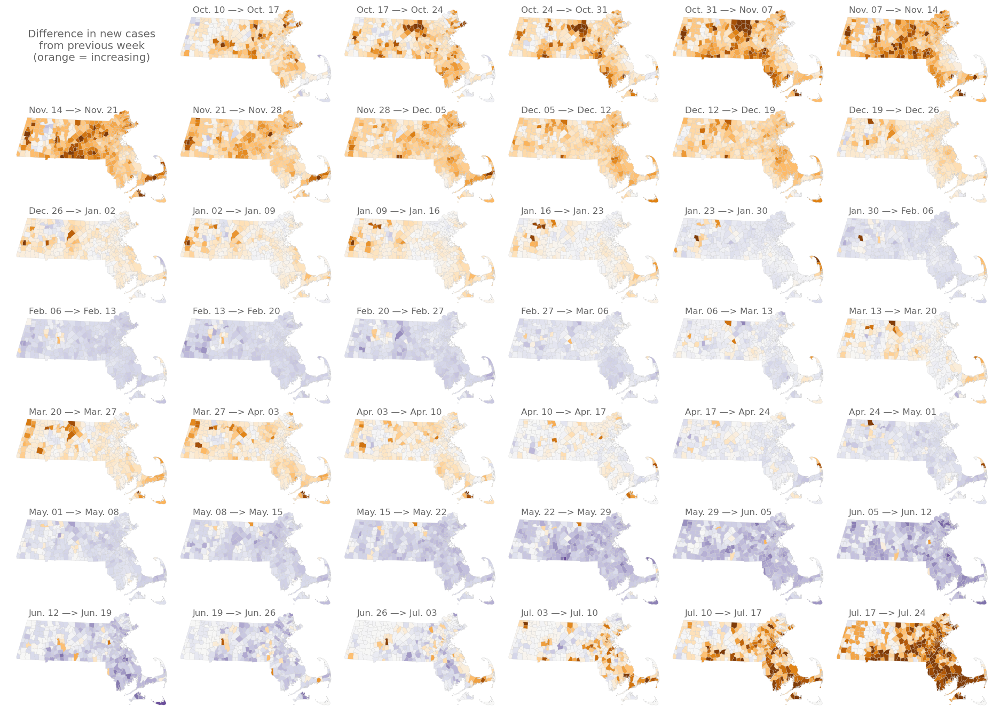

In [77]:
widx = 3
city_dfx = []
for city in city_df['city'].unique():
    cf = city_df.loc[city_df['city']==city].copy()
    cf['new_cases_town'] = np.nan_to_num(cf['new_cases_town'].rolling(window=widx).mean())
    cf['pct_new_cases_town'] = np.nan_to_num(cf['new_cases_town'].pct_change().rolling(window=widx).mean())
    city_dfx.append(cf)
    
city_dfx = pd.concat(city_dfx).reset_index().iloc[:,1:]
city_dfx['city'] = city_dfx['city'].str.upper()

from matplotlib import cm
import matplotlib

from scipy.stats import gaussian_kde
def kde_scipy(x, x_grid, bandwidth=0.2, **kwargs):
    """Kernel Density Estimation with Scipy"""
    # Note that scipy weights its bandwidth by the covariance of the
    # input data.  To make the results comparable to the other methods,
    # we divide the bandwidth by the sample standard deviation here.
    bandwidth = np.mean(np.diff(pct_bins))#/2
    kde = gaussian_kde(x, bw_method=bandwidth / x.std(ddof=1), **kwargs)
    return kde.evaluate(x_grid)

lw = 3
from matplotlib import gridspec
nrows = 48
dcus = city_dfx['end_date'].unique()[-nrows:]

gs = gridspec.GridSpec(nrows+1, 1)
fig = plt.figure(figsize=(10, 14))

i = 1

ax_objs = []
for tup in range(1,nrows+1):
    dcurr = dcus[tup-1]
    cf = city_dfx.loc[city_dfx['end_date']==dcurr][['city','pct_new_cases_town']].copy()
    pct_bins = np.linspace(-1, 1, 81)
    xvals = (pct_bins[1:]+pct_bins[:-1])/2
    xvals = pct_bins[:-1]
    bhd = kde_scipy(cf['pct_new_cases_town'].values, pct_bins)
    bhd = bhd/sum(bhd)
    bh = np.histogram(cf['pct_new_cases_town'], bins=pct_bins)[0]
    yvals_st = bh / sum(bh)
    yvals_st[yvals_st>max(bhd)] = max(bhd)
    ax_objs.append(fig.add_subplot(gs[i:i+1, 0:]))
    ymax_i = np.argmax(yvals_st)
    ymax = yvals_st[ymax_i]
    
    norm = matplotlib.colors.Normalize(vmin=-0.4, vmax=0.4)
    col_co = cm.PuOr_r(norm(np.mean(cf['pct_new_cases_town'])))
    ax_objs[-1].bar(xvals, yvals_st, ec='.9', lw=1,
           width=np.round(np.diff(xvals)[0],3), fc=col_co, alpha=0.5, zorder=nrows)
    ax_objs[-1].plot(pct_bins, bhd, color='.3', lw=lw*1.25, zorder=nrows+1)
    ax_objs[-1].plot(pct_bins, bhd, color=col_co, lw=lw*1.3, zorder=nrows+1, alpha=0.95)

    rect = ax_objs[-1].patch
    rect.set_alpha(0)

    ax_objs[-1].set_yticks([])
    ax_objs[-1].set_yticklabels([])

    if i == nrows:
        ax_objs[-1].set_xticks([-1, -0.75, -0.5, -0.25, 0, .25, .5, .75, 1])
        ax_objs[-1].set_xticklabels(['-100%','-75%','-50%','-25%','0%','25%','50%','75%','100%'],fontsize='x-large')
        ax_objs[-1].tick_params(axis="x", pad=5, colors='.3')

    else:
        ax_objs[-1].set_xticks([-1, -0.75, -0.5, -0.25, 0, .25, .5, .75, 1])
        ax_objs[-1].set_xticklabels(['' for i in range(9)])

    ax_objs[-1].set_xlim(-0.7, 0.9)
    spines = ["top","right","left"]#,"bottom"]
    for s in spines:
        ax_objs[-1].spines[s].set_visible(False)

    ax_objs[-1].text(-0.01,0.01,dcurr,transform=ax_objs[-1].transAxes,
                     fontsize='medium',va='center',ha="right",color='.4',alpha=0.99)
    ax_objs[-1].vlines(0, 0, 0.2, zorder=nrows+2, color='.7', linestyle=':', lw=0.75)
    ax_objs[-1].set_ylim(0, 0.2)

    i += 1

gs.update(hspace=-0.75)

fig.text(0.125,0.825,'Distribution of growth rates\nin Massachusetts cities',
               color='.5', fontsize='x-large', va='top', ha='left')

plt.savefig('../figs/pngs/ridgeplot_growthrate_dist.png', dpi=425, bbox_inches='tight')
plt.savefig('../figs/pdfs/ridgeplot_growthrate_dist.pdf', bbox_inches='tight')
plt.show()


w = 4.0; h = 2.5
ncols = 7; nrows = 7
tups = list(it.product(range(nrows), range(ncols)))
fig, ax = plt.subplots(nrows, ncols, figsize=(ncols*w,nrows*h), dpi=100)#, sharex=True)
plt.subplots_adjust(wspace=-0.05,hspace=-0.01)

for di, dcurr in enumerate(list(city_dfx['end_date'].unique())[-int(nrows*ncols):]):
    print(dcurr, '\t', dt.datetime.now())
    aa = ax[tups[di]]
    if di > 0:#widx-1:
        dprev = list(city_dfx['end_date'].unique())[-int(nrows*ncols):][di-1]
        dat_shp_i = dat_shp.copy()
        dat_shp_i = dat_shp_i.merge(city_dfx.loc[city_dfx['end_date']==dcurr][['city','pct_new_cases_town','population']],
                        how='left', on='city')
        new_means = {}
        for ci in dat_shp_i['city'].unique():
            row_i = dat_shp_i.loc[dat_shp_i['city']==ci].copy()
            inp, res = dat_shp_i.sindex.query_bulk(row_i.geometry, predicate='intersects')
            neighboring_i = dat_shp_i['city'].values[res]
            new_mean_i = np.mean([dat_shp_i.loc[dat_shp_i['city'].isin(neighboring_i)]['pct_new_cases_town'].mean(),
                                  row_i['pct_new_cases_town'].mean()])
            new_means[ci] = new_mean_i

        dat_shp_i['pct_new_cases_town'] = [new_means[i] for i in dat_shp_i['city']]
        dat_shp_i.loc[dat_shp_i['population']<1000,'pct_new_cases_town'] = dat_shp_i['pct_new_cases_town'].median()
        
        dat_shp_i.plot(ax=aa, column='pct_new_cases_town', ec='.8', lw=0.2, cmap='PuOr_r', vmin=-1.0, vmax=1.0)
        dprev = month_dict[dprev[5:7]]+'. %s'%(dprev[8:])
        dcurr = month_dict[dcurr[5:7]]+'. %s'%(dcurr[8:])
        aa.text(0.12, 0.95, dprev+" —> "+dcurr, ha='left', va='center',
                transform=aa.transAxes, color='.4', fontsize='large')
    elif di == 0:
        aa.text(0.5, 0.6, 'Difference in new cases\nfrom previous week\n(orange = increasing)',
                ha='center', va='center', transform=aa.transAxes, color='.4', fontsize='x-large')
        
    aa.set_axis_off()

for dr in range(len(tups)-(di+1)):
    ax[tups[di + 1 + dr]].set_axis_off()


plt.savefig('../figs/pngs/ma_cities_casecounts_over_time_pct_diff.png',dpi=425,bbox_inches='tight')

plt.show()

2020-10-17 	 2021-07-30 10:37:55.488406
2020-10-24 	 2021-07-30 10:38:09.838671
2020-10-31 	 2021-07-30 10:38:24.369674
2020-11-07 	 2021-07-30 10:38:39.734255
2020-11-14 	 2021-07-30 10:38:54.404830
2020-11-21 	 2021-07-30 10:39:09.042534
2020-11-28 	 2021-07-30 10:39:23.527641
2020-12-05 	 2021-07-30 10:39:37.886109
2020-12-12 	 2021-07-30 10:39:51.729884
2020-12-19 	 2021-07-30 10:40:06.002141
2020-12-26 	 2021-07-30 10:40:20.732464
2021-01-02 	 2021-07-30 10:40:35.038714
2021-01-09 	 2021-07-30 10:40:49.881072
2021-01-16 	 2021-07-30 10:41:04.633830
2021-01-23 	 2021-07-30 10:41:19.357024
2021-01-30 	 2021-07-30 10:41:34.070784
2021-02-06 	 2021-07-30 10:41:48.623135
2021-02-13 	 2021-07-30 10:42:03.353247
2021-02-20 	 2021-07-30 10:42:17.808161
2021-02-27 	 2021-07-30 10:42:32.203537
2021-03-06 	 2021-07-30 10:42:46.580850
2021-03-13 	 2021-07-30 10:43:00.475023
2021-03-20 	 2021-07-30 10:43:14.736885
2021-03-27 	 2021-07-30 10:43:29.049471
2021-04-03 	 2021-07-30 10:43:43.817995


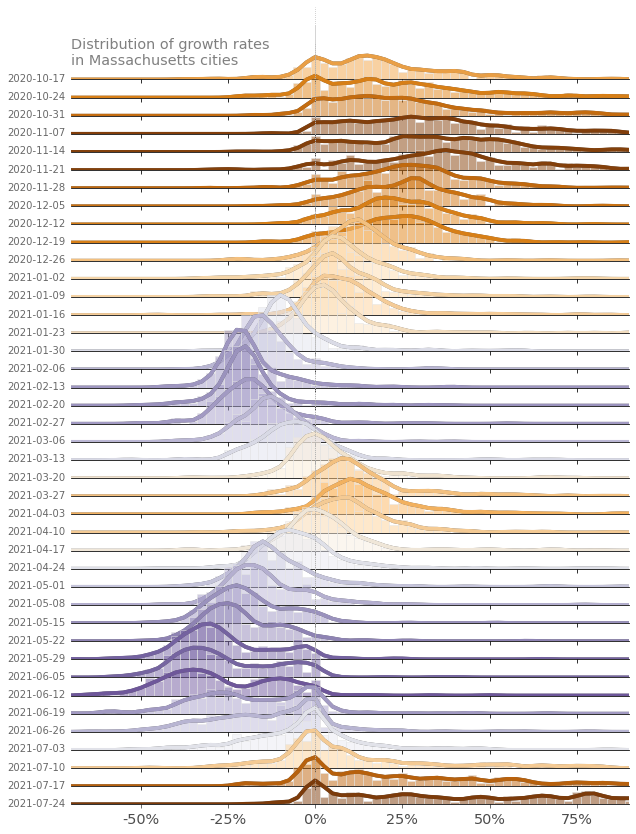

In [78]:
lw = 3
from matplotlib import gridspec
nrows = 48
dcus = city_dfx['end_date'].unique()[-nrows:]

gs = gridspec.GridSpec(nrows+1, 1)
fig = plt.figure(figsize=(10, 15))

i = 1

ax_objs = []
for tup in range(1,nrows+1):
    dcurr = dcus[tup-1]
    print(dcurr, '\t', dt.datetime.now())
    cf = city_dfx.loc[city_dfx['end_date']==dcurr][['city','pct_new_cases_town']].copy()
    dat_shp_i = dat_shp.copy()
    dat_shp_i = dat_shp_i.merge(cf, how='left', on='city')

    new_means = {}
    for ci in dat_shp_i['city'].unique():
        row_i = dat_shp_i.loc[dat_shp_i['city']==ci].copy()
        inp, res = dat_shp_i.sindex.query_bulk(row_i.geometry, predicate='intersects')
        neighboring_i = dat_shp_i['city'].values[res]
        new_mean_i = np.mean([dat_shp_i.loc[dat_shp_i['city'].isin(neighboring_i)]['pct_new_cases_town'].mean(),
                              row_i['pct_new_cases_town'].mean()])
        new_means[ci] = new_mean_i

    dat_shp_i['pct_new_cases_town'] = [new_means[i] for i in dat_shp_i['city']]
    cf = dat_shp_i[['city','pct_new_cases_town']].copy()
    
    pct_bins = np.linspace(-1, 1, 81)
    xvals = (pct_bins[1:]+pct_bins[:-1])/2
    xvals = pct_bins[:-1]
    bhd = kde_scipy(cf['pct_new_cases_town'].values, pct_bins)
    bhd = bhd/sum(bhd)
    bh = np.histogram(cf['pct_new_cases_town'], bins=pct_bins)[0]
    yvals_st = bh / sum(bh)
    yvals_st[yvals_st>max(bhd)] = max(bhd)
    ax_objs.append(fig.add_subplot(gs[i:i+1, 0:]))
    ymax_i = np.argmax(yvals_st)
    ymax = yvals_st[ymax_i]
    
    norm = matplotlib.colors.Normalize(vmin=-0.4, vmax=0.4)
    col_co = cm.PuOr_r(norm(np.mean(cf['pct_new_cases_town'])))
    ax_objs[-1].bar(xvals, yvals_st, ec='.9', lw=1,
           width=np.round(np.diff(xvals)[0],3), fc=col_co, alpha=0.5, zorder=nrows)
    ax_objs[-1].plot(pct_bins, bhd, color='.3', lw=lw*1.25, zorder=nrows+1)
    ax_objs[-1].plot(pct_bins, bhd, color=col_co, lw=lw*1.3, zorder=nrows+1, alpha=0.95)

    rect = ax_objs[-1].patch
    rect.set_alpha(0)

    ax_objs[-1].set_yticks([])
    ax_objs[-1].set_yticklabels([])

    if i == nrows:
        ax_objs[-1].set_xticks([-1, -0.75, -0.5, -0.25, 0, .25, .5, .75, 1])
        ax_objs[-1].set_xticklabels(['-100%','-75%','-50%','-25%','0%','25%','50%','75%','100%'],fontsize='x-large')
        ax_objs[-1].tick_params(axis="x", pad=5, colors='.3')

    else:
        ax_objs[-1].set_xticks([-1, -0.75, -0.5, -0.25, 0, .25, .5, .75, 1])
        ax_objs[-1].set_xticklabels(['' for i in range(9)])

    ax_objs[-1].set_xlim(-0.7, 0.9)
    spines = ["top","right","left"]#,"bottom"]
    for s in spines:
        ax_objs[-1].spines[s].set_visible(False)

    ax_objs[-1].text(-0.01,0.01,dcurr,transform=ax_objs[-1].transAxes,
                     fontsize='medium',va='center',ha="right",color='.4',alpha=0.99)
    ax_objs[-1].vlines(0, 0, 0.2, zorder=nrows+2, color='.7', linestyle=':', lw=0.75)
    ax_objs[-1].set_ylim(0, 0.2)

    i += 1

gs.update(hspace=-0.75)

fig.text(0.125,0.835,'Distribution of growth rates\nin Massachusetts cities',
               color='.5', fontsize='x-large', va='top', ha='left')

plt.savefig('../figs/pngs/ridgeplot_growthrate_dist.png', dpi=425, bbox_inches='tight')
plt.savefig('../figs/pdfs/ridgeplot_growthrate_dist.pdf', bbox_inches='tight')
plt.show()

In [79]:
tots = vax_age_df.loc[vax_age_df['age_group']!='Total'].groupby(['date','county','city']).agg({'population':'sum', 
                                                            'atleast_onedose':'sum',
                                                            'fully_vaccinated':'sum',
                                                            'partially_vaccinated':'sum'}).reset_index()
tots['age_group'] = 'Total'

city_cases_df = city_df.copy()
city_cases_df['date'] = [DATERANGE[date_dict[i]-2] for i in city_cases_df['date']]
city_cases_df['city'] = city_cases_df['city'].str.title()

mass_data = client.open("COVID-data_Massachusetts")
vaccine_city_sex_data = mass_data.worksheet('vaccine_city_sex')

vax_sex_dfx = pd.DataFrame(vaccine_city_sex_data.get_all_records(default_blank=np.nan))
vax_sex_dfx = vax_sex_dfx.loc[vax_sex_dfx['city']!='Unspecified'].copy()

vax_sex_df = vax_sex_dfx[['date', 'county', 'city', 'sex', 'population', 
       'atleast_onedose', 'fully_vaccinated','partially_vaccinated']].copy()

df_all = vax_age_df[['date','county','city']].drop_duplicates()
df_all['city'] = df_all['city'].str.upper()

In [80]:
cat = 'age'
cat_df_ai = vax_age_df[['date','county','city']].drop_duplicates()
for ai in vax_age_df['age_group'].unique():
    tmp_df_ai = vax_age_df.loc[vax_age_df['age_group']==ai].copy()
    ailab = ai.split(' ')[0]
    tmp_df_ai = tmp_df_ai.rename(columns={'population':'population_%s_%s'%(cat,ailab),
                              "atleast_onedose":"atleast_onedose_%s_%s"%(cat,ailab),
                              "fully_vaccinated":"fully_vaccinated_%s_%s"%(cat,ailab),
                              "partially_vaccinated":"partially_vaccinated_%s_%s"%(cat,ailab)})
    tmp_df_ai = tmp_df_ai[[i for i in tmp_df_ai.columns if i != 'age_group' and 'percent_group' not in i]].copy()
    cat_df_ai = cat_df_ai.merge(tmp_df_ai,how='left',on=['date','county','city'])

cat_df_ai['city'] = cat_df_ai['city'].str.upper()
df_all = df_all.merge(cat_df_ai, how='left', on=['date','county','city'])

In [81]:
cat = 'race'
cat_df_ai = vax_race_df[['date','county','city']].drop_duplicates()
for ai in vax_race_df['race'].unique():
    tmp_df_ai = vax_race_df.loc[vax_race_df['race']==ai].copy()
    ailab = ai.split(' ')[0]
    if ailab == 'Other/Unknown':
        ailab = 'Unknown'
    if ailab == 'AI/AN':
        ailab = 'AIAN'
    tmp_df_ai = tmp_df_ai.rename(columns={'population':'population_%s_%s'%(cat,ailab),
                              "atleast_onedose":"atleast_onedose_%s_%s"%(cat,ailab),
                              "fully_vaccinated":"fully_vaccinated_%s_%s"%(cat,ailab),
                              "partially_vaccinated":"partially_vaccinated_%s_%s"%(cat,ailab)})
    tmp_df_ai = tmp_df_ai[[i for i in tmp_df_ai.columns if i != 'race' and 'percent_group' not in i]].copy()
    cat_df_ai = cat_df_ai.merge(tmp_df_ai,how='left',on=['date','county','city'])
    
cat_df_ai['city'] = cat_df_ai['city'].str.upper()
df_all = df_all.merge(cat_df_ai, how='left', on=['date','county','city'])

In [82]:
cat = 'sex'
cat_df_ai = vax_sex_df[['date','county','city']].drop_duplicates()
for ai in vax_sex_df['sex'].unique():
    tmp_df_ai = vax_sex_df.loc[vax_sex_df['sex']==ai].copy()
    ailab = ai.split(' ')[0]
    tmp_df_ai = tmp_df_ai.rename(columns={'population':'population_%s_%s'%(cat,ailab),
                              "atleast_onedose":"atleast_onedose_%s_%s"%(cat,ailab),
                              "fully_vaccinated":"fully_vaccinated_%s_%s"%(cat,ailab),
                              "partially_vaccinated":"partially_vaccinated_%s_%s"%(cat,ailab)})
    tmp_df_ai = tmp_df_ai[[i for i in tmp_df_ai.columns if i != 'sex' and 'percent_group' not in i]].copy()
    cat_df_ai = cat_df_ai.merge(tmp_df_ai,how='left',on=['date','county','city'])

In [83]:
cat_df_ai['city'] = cat_df_ai['city'].str.upper()
df_all = df_all.merge(cat_df_ai, how='left', on=['date','county','city'])
df_all['city'] = df_all['city'].str.split(' \(includes').str[0]

df_all['city'] = df_all['city'].str.title()

In [84]:
city_add = city_dfx[['date','city','county','pct_new_cases_town','population','new_tests_town','new_cases_town']].copy()
city_add['date'] = [DATERANGE[date_dict[i]-2] for i in city_add['date']]
city_add['city'] = city_add['city'].str.title()

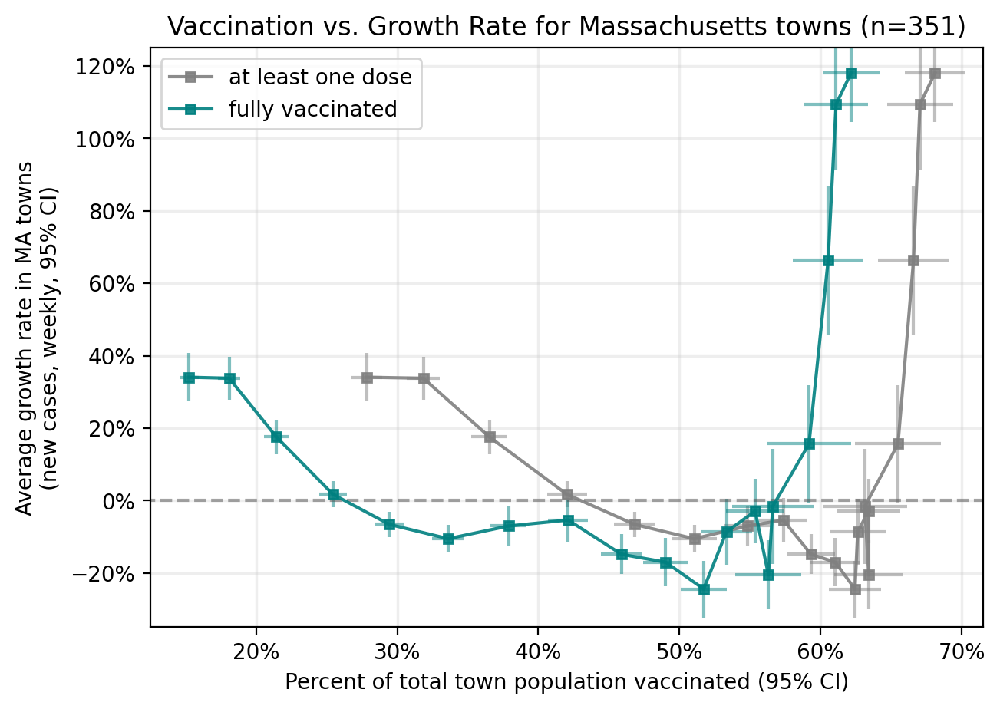

In [85]:
# df_ma = df_all.merge(city_add, how='left', on=['date','city','county'])
df_ma = df_all.merge(city_cases_df[['date','city','county','population','new_tests_town','new_cases_town']],
             how='left', on=['date','county','city'])

df_ma = df_ma.merge(tots[['date','county','city','atleast_onedose','fully_vaccinated','partially_vaccinated']],
            how='left', on=['date','county','city'])
df_ma['new_cases_town_pctchange'] = df_ma.groupby(['county','city'])['new_cases_town'].pct_change()
popthresh = 5000
df_ma = df_ma.loc[(df_ma['population']>popthresh)&(df_ma['date']>df_ma['date'].min())].copy()
df_ma['new_tests_town_percent'] = df_ma['new_tests_town'] / df_ma['population']

# state_df = df_ma.groupby('date').agg({'new_cases_town':'sum','population':'sum'}).reset_index()

wi = 2
tmp_out = []
for ci in sorted(df_ma['city'].unique()):
    tmp = df_ma.loc[df_ma['city'] == ci].copy()
    tmp['atleast_onedose_percent'] = tmp['atleast_onedose'] / tmp['population']
    tmp['fully_vaccinated_percent'] = tmp['fully_vaccinated'] / tmp['population']
    tmp['atleast_onedose_per100k'] = tmp['atleast_onedose'] / tmp['population'] * 100000
    tmp['fully_vaccinated_per100k'] = tmp['fully_vaccinated'] / tmp['population'] * 100000

    tmp['atleast_onedose_percent'] = tmp['atleast_onedose_percent'].rolling(window=wi).mean()
    tmp['fully_vaccinated_percent'] = tmp['fully_vaccinated_percent'].rolling(window=wi).mean()
    tmp['new_cases_town_pctchange'] = tmp['new_cases_town_pctchange'].rolling(window=wi).mean()

    tmp_out.append(tmp[['date','city','atleast_onedose_percent','fully_vaccinated_percent',
                        'new_cases_town_pctchange','population']])


tmp_df = pd.concat(tmp_out).reset_index().iloc[:,1:]
tmp_df = tmp_df.dropna()

q1 = 0.0025
q2 = 0.9975
for c in ['new_cases_town_pctchange']:
# for c in ['atleast_onedose_percent', 'fully_vaccinated_percent','new_cases_town_pctchange']:
    tmp_df = tmp_df.loc[(tmp_df[c]>np.quantile(tmp_df[c],q1))&(tmp_df[c]<np.quantile(tmp_df[c],q2))]

def get_ci(df, col, gb_col='date', percentile='95'):
    if percentile == '999':
        cival = 3.291
    if percentile == '995':
        cival = 2.807
    if percentile == '99':
        cival = 2.576
    if percentile == '95':
        cival = 1.96
    if percentile == '90':
        cival = 1.645
    if percentile == '80':
        cival = 1.282

    df_stats = df.groupby(gb_col)[col].agg([np.nanmean,'count',np.nanstd])
    ci95_hi = []
    ci95_lo = []
    for i in df_stats.index:
        m, c, s = df_stats.loc[i]
        ci95_hi.append(m + cival*s/np.sqrt(c))
        ci95_lo.append(m - cival*s/np.sqrt(c))
    df_stats['ci95_hi'] = ci95_hi
    df_stats['ci95_lo'] = ci95_lo

    return df_stats.reset_index()

onedose_ci = get_ci(tmp_df,col='atleast_onedose_percent',percentile='995')
fullvax_ci = get_ci(tmp_df,col='fully_vaccinated_percent',percentile='995')
pctchan_ci = get_ci(tmp_df,col='new_cases_town_pctchange',percentile='95')

fig, ax = plt.subplots(1,1,figsize=(7,5),dpi=200)

ax.hlines(pctchan_ci['nanmean'], onedose_ci['ci95_lo'], onedose_ci['ci95_hi'], color='.5',alpha=0.5)
ax.vlines(onedose_ci['nanmean'], pctchan_ci['ci95_lo'], pctchan_ci['ci95_hi'], color='.5',alpha=0.5)
ax.plot(onedose_ci['nanmean'], pctchan_ci['nanmean'], color='.5',alpha=0.9,
        label='at least one dose',marker='s', markersize=4)

ax.hlines(pctchan_ci['nanmean'], fullvax_ci['ci95_lo'], fullvax_ci['ci95_hi'], color='teal',alpha=0.5)
ax.vlines(fullvax_ci['nanmean'], pctchan_ci['ci95_lo'], pctchan_ci['ci95_hi'], color='teal',alpha=0.5)
ax.plot(fullvax_ci['nanmean'], pctchan_ci['nanmean'], color='teal',alpha=0.9,
        label='fully vaccinated',marker='s', markersize=4)

ax.hlines(0,0,1, color='.3',alpha=0.5,ls='--')
ax.set_ylabel('Average growth rate in MA towns\n(new cases, weekly, 95% CI)')
ax.set_xlabel('Percent of total town population vaccinated (95% CI)')
ax.set_ylim(-0.35,1.35)
ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0,decimals=0))
ax.set_xlim(0.125, 0.715)
ax.xaxis.set_major_formatter(mtick.PercentFormatter(1.0,decimals=0))
ax.grid(lw=1.25,alpha=0.25,color='.75')
ax.set_title('Vaccination vs. Growth Rate for Massachusetts towns (n=351)')

ax.legend()

plt.savefig('../figs/pngs/vaccination_growthrate_ma.png',dpi=425,bbox_inches='tight')
plt.show()